#Introdução

Vamos estudar os 3 algoritimos mais usados para classificação:

- Arvore de Decisão
- knn
- Bernoulli Naive Bayes

Vamos estudar a plicação de cada modelo em um problema, entender como eles funcionam de baixo dos panos (matemática). E no final vamos comparar os 3 e decidir qual é o melhor modelo para nosso problema.

#Problema

Estamos atuando numa empresa de telecomunicações ficticia, e nosso chefe quer que, modelemos um algoritmo de machine learning que consiga traçar o perfil da pessoa que vai deixar de ser nosso cliente, ou seja, ele quer que usemos um modelo de classificação, para classificar o perfil do cliente que vai deixar de consumir nosso produtos... O famoso churn.

O seu chefe te disponibilizou uma base de dados que ele julga que tem o necessário para fazer essa classificação, vamos importar ela:

#Analise exploratória dos dados - Tratamento de variáveis Categóricas

Nossa base é formada por 18 campos, o que são bastantes campos. Para conseguirmos entender de fomra clara cada um deles, separamos eles em variáveis categóricas/Qualitativas e variáveis Quantitativas:

- Categóricas/Qualitativas
  - Maior65Anos --> Booleano mostrando se o cliente é idoso ou não.
  - Conjugue --> Booleano (Sim e Não) que mostra se ele é casado ou nnão.
  - Dependentes --> Booleano (Sim ou Não)
  - Telefone Fixo --> Booleano (Sim ou Não)
  - VariasLinhasTelefonicas --> Categórica, Não se tem apenas uma linha, Sim se tem mais de uma linha e SemServicoTelefonico se não tiver nenhuma linha telefonica.
  - ServicoDeInternet --> Categórica, DLS se tiver internet a cobre, FibraOptica se for de fibra optica e Não se não tiver serviço de internet.
  - SegurancaOnline --> booleana (Sim ou Não).
  - BackupOnline --> booleana (Sim ou Não).
  - SeguroNoDispositivo --> booleana (Sim ou Não).
  - SuporteTecnico --> booleana (Sim ou Não).
  - TVaCabo --> booleana (Sim ou Não).
  - StreamingDeFilmes --> booleana (Sim ou Não).
  - TipoDeContrato --> Categórica que mostra o tipo de contrato do cliente, que pode ser: Mensalmente, DoisAnos, UmAno.
  - PagamentoOnline --> booleana (Sim ou Não).
  - FormaDePagamento --> Categórica que mostra a forma de pagamento que aquele cliente faz, que pode ser: ChequeDigital, ChequePapel, DebitoEmConta ou CartaoDeCredito.
  - Churn --> É a nossa variável que queremos prever! É booleana (Sim e Não) que mostra se o cliente abandonou nossos serviços ou não.

- Quantitativas/Númericas
  - MesesDeContrato --> Mostra a quantidade de meses que está no contrato do cliente.
  - ContaMensal --> É o valor em dólares da conta mensal média que esse cliente paga.

importando os dados:

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
link = "https://raw.githubusercontent.com/alura-cursos/ML_Classificacao_por_tras_dos_panos/main/Dados/Customer-Churn.csv"
dados = pd.read_csv(link, sep =",")
dados.head()

,Maior65Anos,Conjuge,Dependentes,MesesDeContrato,TelefoneFixo,VariasLinhasTelefonicas,ServicoDeInternet,SegurancaOnline,BackupOnline,SeguroNoDispositivo,SuporteTecnico,TVaCabo,StreamingDeFilmes,TipoDeContrato,PagamentoOnline,FormaDePagamento,ContaMensal,Churn
0,0,Sim,Nao,1,Nao,SemServicoTelefonico,DSL,Nao,Sim,Nao,Nao,Nao,Nao,Mensalmente,Sim,ChequeDigital,29.85,Nao
1,0,Nao,Nao,34,Sim,Nao,DSL,Sim,Nao,Sim,Nao,Nao,Nao,UmAno,Nao,ChequePapel,56.95,Nao
2,0,Nao,Nao,2,Sim,Nao,DSL,Sim,Sim,Nao,Nao,Nao,Nao,Mensalmente,Sim,ChequePapel,53.85,Sim
3,0,Nao,Nao,45,Nao,SemServicoTelefonico,DSL,Sim,Nao,Sim,Sim,Nao,Nao,UmAno,Nao,DebitoEmConta,42.30,Nao
4,0,Nao,Nao,2,Sim,Nao,FibraOptica,Nao,Nao,Nao,Nao,Nao,Nao,Mensalmente,Sim,ChequeDigital,70.70,Sim


In [ ]:
dados.shape

(7043, 18)

##Transformando os dados

Nossa primeira tarefa é fazer a transformação dos dados categóricos/qualitativos em númericos, pois seja lá qual for o modelo de classificação que vamos aplicar, o computador entende apenas números! Nesse sentido devemos dar valores númericos para cada um dos campos categóricos para cada categoria dentro dela.

Existem várias formas de fazer isso, vamos ensinar 2:

Forma manual --> Através de dicionarios e com o método replace.

In [ ]:
dicionario = {"Sim": 1, "Nao": 0}
dados_virgem = dados.copy()
dados[["Conjuge", "Dependentes", "TelefoneFixo", "PagamentoOnline", "Churn"]] = dados[["Conjuge", "Dependentes", "TelefoneFixo", "PagamentoOnline", "Churn"]].replace(dicionario)
dados

,Maior65Anos,Conjuge,Dependentes,MesesDeContrato,TelefoneFixo,VariasLinhasTelefonicas,ServicoDeInternet,SegurancaOnline,BackupOnline,SeguroNoDispositivo,SuporteTecnico,TVaCabo,StreamingDeFilmes,TipoDeContrato,PagamentoOnline,FormaDePagamento,ContaMensal,Churn
0,0,1,0,1,0,SemServicoTelefonico,DSL,Nao,Sim,Nao,Nao,Nao,Nao,Mensalmente,1,ChequeDigital,29.85,0
1,0,0,0,34,1,Nao,DSL,Sim,Nao,Sim,Nao,Nao,Nao,UmAno,0,ChequePapel,56.95,0
2,0,0,0,2,1,Nao,DSL,Sim,Sim,Nao,Nao,Nao,Nao,Mensalmente,1,ChequePapel,53.85,1
3,0,0,0,45,0,SemServicoTelefonico,DSL,Sim,Nao,Sim,Sim,Nao,Nao,UmAno,0,DebitoEmConta,42.30,0
4,0,0,0,2,1,Nao,FibraOptica,Nao,Nao,Nao,Nao,Nao,Nao,Mensalmente,1,ChequeDigital,70.70,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,0,1,1,24,1,Sim,DSL,Sim,Nao,Sim,Sim,Sim,Sim,UmAno,1,ChequePapel,84.80,0
7039,0,1,1,72,1,Sim,FibraOptica,Nao,Sim,Sim,Nao,Sim,Sim,UmAno,1,CartaoDeCredito,103.20,0
7040,0,1,1,11,0,SemServicoTelefonico,DSL,Sim,Nao,Nao,Nao,Nao,Nao,Mensalmente,1,ChequeDigital,29.60,0
7041,1,1,0,4,1,Sim,FibraOptica,Nao,Nao,Nao,Nao,Nao,Nao,Mensalmente,1,ChequePapel,74.40,1


Forma Automatizada --> Vamos utilizar a função get_dummies(), nela não precisamos passar dicionario ela mesma varre a coluna e comça atribuir números começando com 0, para cada categoria dentro de cada coluna:

In [ ]:
dados = pd.get_dummies(dados)
dados

,Maior65Anos,Conjuge,Dependentes,MesesDeContrato,TelefoneFixo,PagamentoOnline,ContaMensal,Churn,VariasLinhasTelefonicas_Nao,VariasLinhasTelefonicas_SemServicoTelefonico,VariasLinhasTelefonicas_Sim,ServicoDeInternet_DSL,ServicoDeInternet_FibraOptica,ServicoDeInternet_Nao,SegurancaOnline_Nao,SegurancaOnline_SemServicoDeInternet,SegurancaOnline_Sim,BackupOnline_Nao,BackupOnline_SemServicoDeInternet,BackupOnline_Sim,SeguroNoDispositivo_Nao,SeguroNoDispositivo_SemServicoDeInternet,SeguroNoDispositivo_Sim,SuporteTecnico_Nao,SuporteTecnico_SemServicoDeInternet,SuporteTecnico_Sim,TVaCabo_Nao,TVaCabo_SemServicoDeInternet,TVaCabo_Sim,StreamingDeFilmes_Nao,StreamingDeFilmes_SemServicoDeInternet,StreamingDeFilmes_Sim,TipoDeContrato_DoisAnos,TipoDeContrato_Mensalmente,TipoDeContrato_UmAno,FormaDePagamento_CartaoDeCredito,FormaDePagamento_ChequeDigital,FormaDePagamento_ChequePapel,FormaDePagamento_DebitoEmConta
0,0,1,0,1,0,1,29.85,0,0,1,0,1,0,0,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0
1,0,0,0,34,1,0,56.95,0,1,0,0,1,0,0,0,0,1,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0
2,0,0,0,2,1,1,53.85,1,1,0,0,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0
3,0,0,0,45,0,0,42.30,0,0,1,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,0,0,1,0,0,0,1
4,0,0,0,2,1,1,70.70,1,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,0,1,1,24,1,1,84.80,0,0,0,1,1,0,0,0,0,1,1,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0
7039,0,1,1,72,1,1,103.20,0,0,0,1,0,1,0,1,0,0,0,0,1,0,0,1,1,0,0,0,0,1,0,0,1,0,0,1,1,0,0,0
7040,0,1,1,11,0,1,29.60,0,0,1,0,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0
7041,1,1,0,4,1,1,74.40,1,0,0,1,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0


A função get_dummies() quando se depara com um campo categórico que tem mais de 2 categorias, ele cria novas novas colunas para cada categoria que existia nesse campo. Por exemplo, no nosso dataset existia o campo TipoDeContrato que poderia ser: Mensalmente, DoisAnos, UmAno.

  A função get_dummies() vai criar 3 novos campos/colunas para cada uma dessas categorias, e vai marcar como 1 se ele for daquela categoria ou 0 caso contrário. Ou seja, teremos os 3 novos campos:

  - TipoDeContrato_DoisAnos	--> 1 para sim e 0 para não.
  - TipoDeContrato_Mensalmente --> 1 para sim e 0 para não.
  - TipoDeContrato_UmAno --> 1 para sim e 0 para não.

Com isso o nosso número de colunas aumentou para 39... se você perceber, é tanta coluna que o próprio dataframe pandas não mostra todas as colunas. Para visualizarmos todas as colunas devemos setar um novo máximo de exibição de colunas:

In [ ]:
pd.set_option("display.max_columns", 39)
dados

,Maior65Anos,Conjuge,Dependentes,MesesDeContrato,TelefoneFixo,PagamentoOnline,ContaMensal,Churn,VariasLinhasTelefonicas_Nao,VariasLinhasTelefonicas_SemServicoTelefonico,VariasLinhasTelefonicas_Sim,ServicoDeInternet_DSL,ServicoDeInternet_FibraOptica,ServicoDeInternet_Nao,SegurancaOnline_Nao,SegurancaOnline_SemServicoDeInternet,SegurancaOnline_Sim,BackupOnline_Nao,BackupOnline_SemServicoDeInternet,BackupOnline_Sim,SeguroNoDispositivo_Nao,SeguroNoDispositivo_SemServicoDeInternet,SeguroNoDispositivo_Sim,SuporteTecnico_Nao,SuporteTecnico_SemServicoDeInternet,SuporteTecnico_Sim,TVaCabo_Nao,TVaCabo_SemServicoDeInternet,TVaCabo_Sim,StreamingDeFilmes_Nao,StreamingDeFilmes_SemServicoDeInternet,StreamingDeFilmes_Sim,TipoDeContrato_DoisAnos,TipoDeContrato_Mensalmente,TipoDeContrato_UmAno,FormaDePagamento_CartaoDeCredito,FormaDePagamento_ChequeDigital,FormaDePagamento_ChequePapel,FormaDePagamento_DebitoEmConta
0,0,1,0,1,0,1,29.85,0,0,1,0,1,0,0,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0
1,0,0,0,34,1,0,56.95,0,1,0,0,1,0,0,0,0,1,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0
2,0,0,0,2,1,1,53.85,1,1,0,0,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0
3,0,0,0,45,0,0,42.30,0,0,1,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,0,0,1,0,0,0,1
4,0,0,0,2,1,1,70.70,1,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,0,1,1,24,1,1,84.80,0,0,0,1,1,0,0,0,0,1,1,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0
7039,0,1,1,72,1,1,103.20,0,0,0,1,0,1,0,1,0,0,0,0,1,0,0,1,1,0,0,0,0,1,0,0,1,0,0,1,1,0,0,0
7040,0,1,1,11,0,1,29.60,0,0,1,0,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0
7041,1,1,0,4,1,1,74.40,1,0,0,1,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0


#Análise exploratória dos dados -  Tratamento de Desbalanceamento

##Churn - Y

Churn é nossa variável preditora/dependente, isto é, é aquela que queremos prever. A primeira coisa que se deve fazer em variáveis depentestes categóricas é saber se os dados estão balanceados ou não:

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


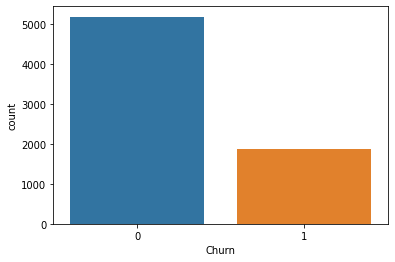

In [ ]:
sns.countplot(dados.Churn)

In [ ]:
dados.Churn.value_counts()

0    5174
1    1869
Name: Churn, dtype: int64

Claramente nossa variável dependente está desbalanceada... Isso é ruim, pois envieza a classificação do modelo de classificação modelado com os dados de treino. Isto é, como existem mais dados com a classificação 0 para o churn, o modelo pode aprender somente a prever corretamente somente os casos onde o churn é 0 e errar muito nos casos onde o churn é 1.


###Balanceando os dados - Oversampling -SOMTE

Para realizar o balanceamento dos dados, utilizaremos uma técnica chamada de Oversampling, que consiste em realizar a criação de novas observações (dados) da classe que tem menos amostras, tendo como objetivo igualar a proporção entre as categorias. É importante salientar que Oversampling não é um método específico, mas sim um conjunto de tecnicas que seguem essa lógica geral, isto é, tecnicas que fazem a criação de novos dados artificiais para a classificação minoritária.

Vale salientar que, a criação de dados sintéticos com base nos dados que já existem ***NÃO FORNECE INFORMAÇÃO ADICIONAL AO MODELO***

A o método que vamos utilizar é o SMOTE.Sua ideia consiste em criar observações intermediárias entre os dados que estão próximos. Isto é, o método SMOTE vai selecionar aleatóriamente 2 elementos da classe minoritária, e sobre a linha de distância euclidiana entre esses 2 pontos, o SMOTE vai selecionar aleatóriamente um ponto sobre essa linha. Por exemplo, seja meu Y um campos de minutos, se minutos são 129.1 e 146.3 (que são dados reais), então será criada uma amostra de minutos com 137.7. Lembrando que não é necessariamente a média entre as amostras (o que seria o ponto que divide ao meio a reta de distância euclidiana entre os pontos).

Como cada elementos que vai ser gerado sintéticamente tem 39 nove campos, 1 campo da variável Y e 38 da variável X, ele vai rodar essa algoritmo de pegar um ponto entre dois pontos reais da classe minoritária para cada um dos 40 campos.

Antes de utilizar a classe SMOTE - Synthetic Minority Oversampling Technique - , devemos separar nossos dados em dados de variáveis independentes/explicativas/features X, dos dados de predição/dependentes/target Y:



In [ ]:
x = dados.drop("Churn", axis = 1)#Devolve todo o dataset subtraido a coluna mandada pelo paramtro, que no caso eh Churn
x

,Maior65Anos,Conjuge,Dependentes,MesesDeContrato,TelefoneFixo,PagamentoOnline,ContaMensal,VariasLinhasTelefonicas_Nao,VariasLinhasTelefonicas_SemServicoTelefonico,VariasLinhasTelefonicas_Sim,ServicoDeInternet_DSL,ServicoDeInternet_FibraOptica,ServicoDeInternet_Nao,SegurancaOnline_Nao,SegurancaOnline_SemServicoDeInternet,SegurancaOnline_Sim,BackupOnline_Nao,BackupOnline_SemServicoDeInternet,BackupOnline_Sim,SeguroNoDispositivo_Nao,SeguroNoDispositivo_SemServicoDeInternet,SeguroNoDispositivo_Sim,SuporteTecnico_Nao,SuporteTecnico_SemServicoDeInternet,SuporteTecnico_Sim,TVaCabo_Nao,TVaCabo_SemServicoDeInternet,TVaCabo_Sim,StreamingDeFilmes_Nao,StreamingDeFilmes_SemServicoDeInternet,StreamingDeFilmes_Sim,TipoDeContrato_DoisAnos,TipoDeContrato_Mensalmente,TipoDeContrato_UmAno,FormaDePagamento_CartaoDeCredito,FormaDePagamento_ChequeDigital,FormaDePagamento_ChequePapel,FormaDePagamento_DebitoEmConta
0,0,1,0,1,0,1,29.85,0,1,0,1,0,0,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0
1,0,0,0,34,1,0,56.95,1,0,0,1,0,0,0,0,1,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0
2,0,0,0,2,1,1,53.85,1,0,0,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0
3,0,0,0,45,0,0,42.30,0,1,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,0,0,1,0,0,0,1
4,0,0,0,2,1,1,70.70,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,0,1,1,24,1,1,84.80,0,0,1,1,0,0,0,0,1,1,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0
7039,0,1,1,72,1,1,103.20,0,0,1,0,1,0,1,0,0,0,0,1,0,0,1,1,0,0,0,0,1,0,0,1,0,0,1,1,0,0,0
7040,0,1,1,11,0,1,29.60,0,1,0,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0
7041,1,1,0,4,1,1,74.40,0,0,1,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0


In [ ]:
y = dados[["Churn"]]
y

,Churn
0,0
1,0
2,1
3,0
4,1
...,...
7038,0
7039,0
7040,0
7041,1


Para utilizar a classe SMOTE devemos importar ela da biblioteca imblearn.over_sampling:

In [ ]:
from imblearn.over_sampling import SMOTE

smt = SMOTE(random_state=123)  # Instancia um objeto da classe SMOTE, passamos um código de estado, para ganrantir que, toda vez que essa celula for rodada
                               # a classes SMOTE vai gerar os mesma dados sintéticos.
x, y = smt.fit_resample(x, y)  # o método fit_sample devolve dois datasets, x e y, e esses data set já tem as linhas sintéticas criadas conforme foi explicado anteriormente

In [ ]:
x

,Maior65Anos,Conjuge,Dependentes,MesesDeContrato,TelefoneFixo,PagamentoOnline,ContaMensal,VariasLinhasTelefonicas_Nao,VariasLinhasTelefonicas_SemServicoTelefonico,VariasLinhasTelefonicas_Sim,ServicoDeInternet_DSL,ServicoDeInternet_FibraOptica,ServicoDeInternet_Nao,SegurancaOnline_Nao,SegurancaOnline_SemServicoDeInternet,SegurancaOnline_Sim,BackupOnline_Nao,BackupOnline_SemServicoDeInternet,BackupOnline_Sim,SeguroNoDispositivo_Nao,SeguroNoDispositivo_SemServicoDeInternet,SeguroNoDispositivo_Sim,SuporteTecnico_Nao,SuporteTecnico_SemServicoDeInternet,SuporteTecnico_Sim,TVaCabo_Nao,TVaCabo_SemServicoDeInternet,TVaCabo_Sim,StreamingDeFilmes_Nao,StreamingDeFilmes_SemServicoDeInternet,StreamingDeFilmes_Sim,TipoDeContrato_DoisAnos,TipoDeContrato_Mensalmente,TipoDeContrato_UmAno,FormaDePagamento_CartaoDeCredito,FormaDePagamento_ChequeDigital,FormaDePagamento_ChequePapel,FormaDePagamento_DebitoEmConta
0,0,1,0,1,0,1,29.850000,0,1,0,1,0,0,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0
1,0,0,0,34,1,0,56.950000,1,0,0,1,0,0,0,0,1,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0
2,0,0,0,2,1,1,53.850000,1,0,0,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0
3,0,0,0,45,0,0,42.300000,0,1,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,0,0,1,0,0,0,1
4,0,0,0,2,1,1,70.700000,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10343,0,1,0,5,1,1,80.921075,0,0,1,0,1,0,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0
10344,0,0,0,3,1,1,74.347278,0,0,1,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0
10345,0,0,0,18,1,1,70.164647,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0
10346,0,0,0,30,1,0,93.024726,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0


In [ ]:
y

,Churn
0,0
1,0
2,1
3,0
4,1
...,...
10343,1
10344,1
10345,1
10346,1


Note que, o número de elementos/linhas do nosso dataset foi de 7.043 para 10.348, ou seja forom criadas 3.305 novas linhas sintéticas pelo método SMOTE. Esse valor não é por acaso, o método SMOTE cria dados sintéticos da classe minoritária de tal forma que, ao final o número de elementos das duas classes se iguale! Ou seja, a diferença incial entre as classes era de 3.305!

In [ ]:
dados.Churn.value_counts()[0] - dados.Churn.value_counts()[1]

3305

In [ ]:
y.Churn.value_counts()

0    5174
1    5174
Name: Churn, dtype: int64

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


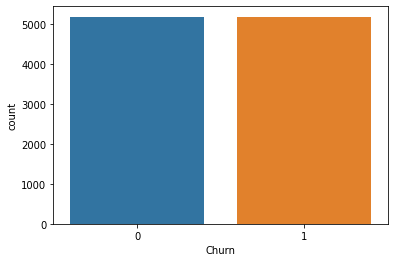

In [ ]:
sns.countplot(y.Churn)

Veja que, os novos dados Y (e também o X) tem o mesmo número de elementos para ambas as classes. Agora precisamos concatenar os dados X e Y, que neste momento estão em dataset separados.

In [ ]:
dados =pd.concat([x,y], axis=1)
dados

,Maior65Anos,Conjuge,Dependentes,MesesDeContrato,TelefoneFixo,PagamentoOnline,ContaMensal,VariasLinhasTelefonicas_Nao,VariasLinhasTelefonicas_SemServicoTelefonico,VariasLinhasTelefonicas_Sim,ServicoDeInternet_DSL,ServicoDeInternet_FibraOptica,ServicoDeInternet_Nao,SegurancaOnline_Nao,SegurancaOnline_SemServicoDeInternet,SegurancaOnline_Sim,BackupOnline_Nao,BackupOnline_SemServicoDeInternet,BackupOnline_Sim,SeguroNoDispositivo_Nao,SeguroNoDispositivo_SemServicoDeInternet,SeguroNoDispositivo_Sim,SuporteTecnico_Nao,SuporteTecnico_SemServicoDeInternet,SuporteTecnico_Sim,TVaCabo_Nao,TVaCabo_SemServicoDeInternet,TVaCabo_Sim,StreamingDeFilmes_Nao,StreamingDeFilmes_SemServicoDeInternet,StreamingDeFilmes_Sim,TipoDeContrato_DoisAnos,TipoDeContrato_Mensalmente,TipoDeContrato_UmAno,FormaDePagamento_CartaoDeCredito,FormaDePagamento_ChequeDigital,FormaDePagamento_ChequePapel,FormaDePagamento_DebitoEmConta,Churn
0,0,1,0,1,0,1,29.850000,0,1,0,1,0,0,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0
1,0,0,0,34,1,0,56.950000,1,0,0,1,0,0,0,0,1,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0
2,0,0,0,2,1,1,53.850000,1,0,0,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,1
3,0,0,0,45,0,0,42.300000,0,1,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,0,0,1,0,0,0,1,0
4,0,0,0,2,1,1,70.700000,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10343,0,1,0,5,1,1,80.921075,0,0,1,0,1,0,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,1
10344,0,0,0,3,1,1,74.347278,0,0,1,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,1
10345,0,0,0,18,1,1,70.164647,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,1
10346,0,0,0,30,1,0,93.024726,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,1


#Modelo KNN - k-nearest neighbors/K-vizinhos mais próximos

O KNN é um algoritmo de ML Supervisionado e pode ser usado tanto para classificação (o nosso caso) quando para Regressão. A lógica é extremamante simples...


  O algoritmo recebe os elementos já existentes do dataset e com eles em mãos, vai ficar no aguardo de novos elementos que desejamos classificar:

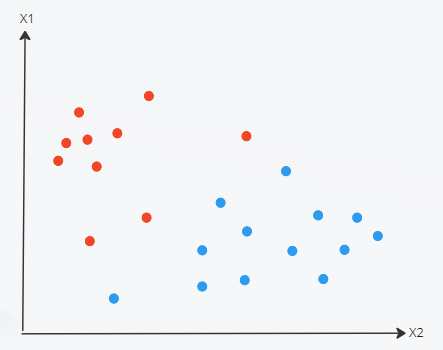

Aqui, os eixos X1 e X2 são as caracteristicas/features/variáveis independentes, e a cor dos pontos é a classificação de cada ponto dentro da variável dependente/tagert Y. Neste exemplo, o target Y é categórica booleana, onde os azuis representam alguma categoria e o vermelho a outra.

Em seguida o entra um novo elementos que, nosso modelo de KNN que classificar como sendo ou da classe azul ou vermelha:

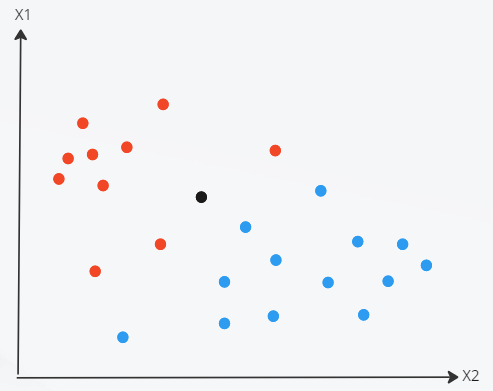

Logo em seguida passamos o parâmetro k, onde k é um número inteiro tal que 0 < K < Tamanho da população.

Esse número K vai guiar o calculo de distâncias euclidianas do novo ponto (ponto preto) com os k elementos vizinhos mais próximos dele. Digamos que fizemos k = 1, logo teremos que:

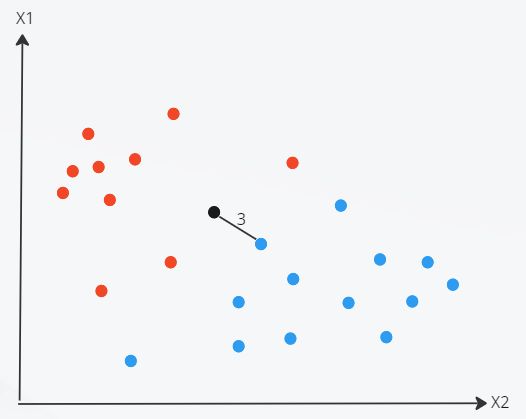

O algoritmo KNN nos retornou que o vizinho mais próximo é um azul e a distância entre eles é 3 unidades. Nesta configuração de K, onde k = 1, o algoritmo irá classificar esse novo elemento como sendo da classe azul.

Se k = 2 temos que:

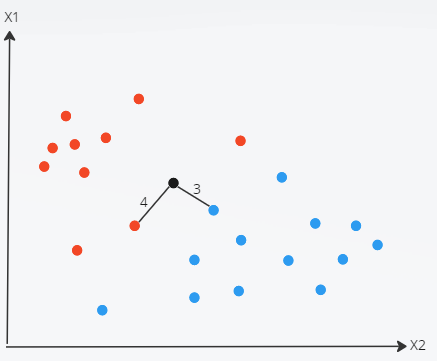

O segundo vizinho mais próximo é um vermelho com distância 4. Com essa configuração o algoritmo vai escolher a classe que tem a menor distância do novo ponto, ou seja, ele vai classificar o novo ponto como sendo azul.

Com k = 3 temos que:

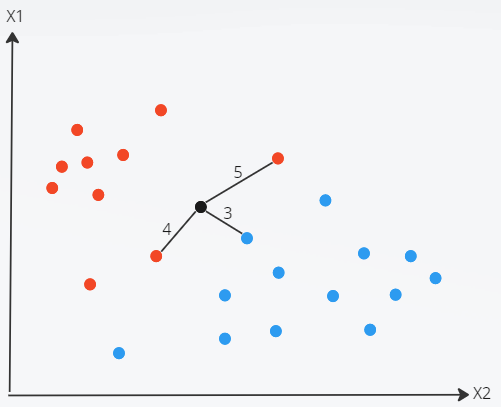

O terceiro vizinho mais próximo é um vermelho com distância 5 do ponto novo. Com essa nova configuração o algoritmo vai escolher a classificação que mais aparece na lista de k = 3 vizinhos mais próximo, ou seja, ele vai classificar o novo ponto como sendo vermelho, pois existem 2 vermelhos e 1 azul na lista de k = 3 mais próximos.

A lógica para k = n, onde n >3 é a mesma, o algoritmo calcula as distâncias do novo ponto com o n mais próximos, organiza de forma crescente essa lista de distâncias e vai classificar o novo ponto com a mesma classe que está em maior frequencia dentro da lista de distâncias.

Caso de empate, ou seja, na lista de distâncias houver a mesma quantidade para ambas as classes, o algoritmo pega a classificação da classe que tem a menor distância.

Por exemplo, quand k = 6 temos:

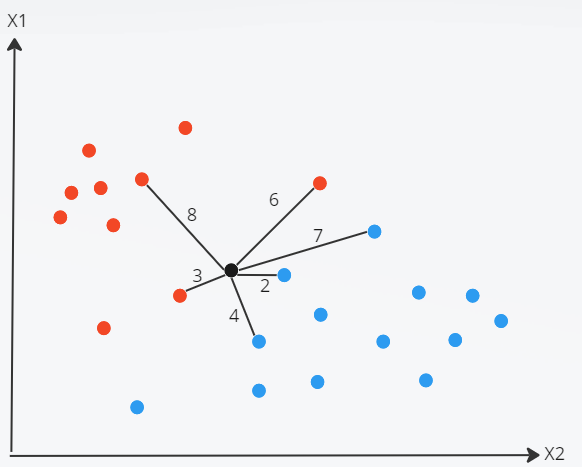

A lista de distâncias será:

lista = [2A, 3V, 4A, 6V, 7A, 8V]

Neste caso, como há a mesma ferquência de classes dentro da lista (3 vermelhas e 3 azuis) o algoritmo pega aquele que apresenta as menores distâncias, que no caso é a Azul, logo o novo ponto é classificado como sendo azul.

##Valor de K

Estudado a teoria sobre o algoritmo KNN, sempre vem a grende questão... qual será o valor de K perfeito para o qual temos um acrária máxima? Para responder isso vamos fazer suposições sobre o valor de K e vejamos os desdobramentos:

**Valor de K muito pequeno -> Overfitting (KNN)**

Overfitting é o quando nosso modelo apenas consegue fazer previsões com acurácia boa se os dados de entrada forem os próprios dados de treino ou que sejam semelhantes a estes. Ou seja, se os dados forem diferentes com o que ele treinou, ele vai errar.Em linguajar mais acadêmico, falamos que o modelo se ajustou muito aos dados de treino. Na maioria dos modelos de Machine Learning isso ocorre quando a quantidade de dados de treino é muito grande ou/e quando os dados de treino são muitos pareceidos entre sí, ou seja, a grande quantidade de dados de treino não refletiu em novas informações para o modelo.


 no caso do modelo KNN é o oposto! Isto é, o Overfitting é quando adicionamos poucos dados de treino. Mas a conseguencia é a mesma do Overfitting, isto é, o nosso modelo de KNN apenas vai conseguir fazer previsões corretas  se os dados forem semelhantes daqueles com que treinou.

**Valor de K muito grande --> Underfitting (KNN)**

Unerfitting, como o nome já sugere, é quando não damos a quantidade suficiente de dados de treino ao nosso modelo e acabamos por subtreinar nosso modelo. Isso acarreta em siatuações onde, o nosso modelo é tão mal ajustado que ele nem consegue fazer previsões corretas com os próprios dados de treino como entrada. Para dados não semelhantes aos de treino a acurácia é pior ainda!

No caso do modelo KNN ocorre o Underfitting quando ocorre o oposto com os dados de treino! Isto é, quando adicionamos muitos dados ao modelo de KNN ocorre o Underfitting, pois nesse caso, a lista de distâncias dos K vizinhos mais próximos é tão grande, que, na hora que chaga um novo ponto para ser classificado, existem muitos vizinhos tanto de uma classe quanto da outra.

Por padrão usa-se k = 5, e é exatamente esse valor de k = 5, que o sklearn carrega caso não passemos esse parametro para ele. É claro que, podemos testar vários valores de k, pois não necessariamente para k = 5 teremos a maior acurácia para todos os casos.

##Pré Requisitos - KNN

Assim como todo modelo de Machine Learning, o KNN funciona melhor em determinados cenários ideias, ou seja, fora deles, a acuária da previsão por KNN pode ser baixa. Sem mais de longas vamos a eles:


***- Mesma Escala dos dados de treino***
  - O KNN foi modelado para ser usado em casos onde os dados de treino/features estão na mesma escala. Por esse motivo faz-se necessário aplicar tecnicas que padronizam as escalas das variáveis indepedentes, como:
    - Padronização: Ou seja, estamos falando da tecnica que diminui a escala da distribuição de cada variável X num intervalo menor, que pode ser maior que 1 e menor que 0. Estamos falando da tecnica de padronização Z! Ou seja de novo, padronizar uma variável independente deixará sua média igual a 0 e um desvio padrão igual a 1:
    

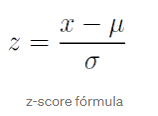

- Normalização: normalizar todos as variáveis Xs dentro do range [0,1] também é um alternativa bastabte utilizada!

***- Dimensionalidade Baixa***
  -  o KNN é adequado para dados dimensionais baixos, isto é, para baixos número de variáveis explicativas Xs.  Você pode experimentá-lo em dados de alta dimensão (centenas ou milhares de variáveis ​​de entrada), mas esteja ciente de que ele pode não funcionar tão bem quanto outras técnicas.

***- Features quantitativas e qualitativas***
  - Isto não é um  pré requisito, na verdade é mais uma dica, avisando que as variáveis das features pode ser tanto do tipo qualitativas quanto quantitativas.



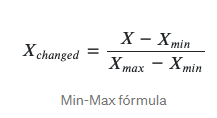

Como comentado, o algoritmo de KNN necessita que todos os dados de treino estejam numa mesma escala, isto pe, o KNN é muito sensível a variáveis explicativas X que tenham um escalas muito grandes

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


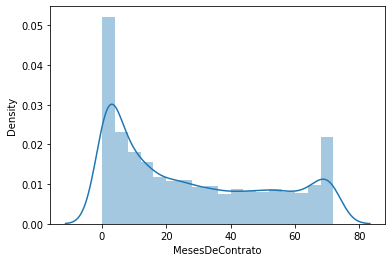

In [ ]:
sns.distplot(dados.MesesDeContrato)

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


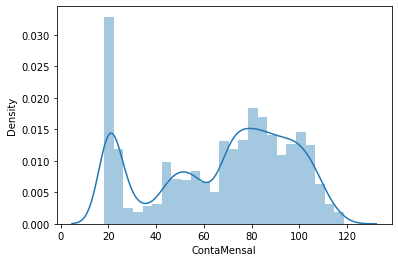

In [ ]:
sns.distplot(dados.ContaMensal)

In [ ]:
x

,Maior65Anos,Conjuge,Dependentes,MesesDeContrato,TelefoneFixo,PagamentoOnline,ContaMensal,VariasLinhasTelefonicas_Nao,VariasLinhasTelefonicas_SemServicoTelefonico,VariasLinhasTelefonicas_Sim,ServicoDeInternet_DSL,ServicoDeInternet_FibraOptica,ServicoDeInternet_Nao,SegurancaOnline_Nao,SegurancaOnline_SemServicoDeInternet,SegurancaOnline_Sim,BackupOnline_Nao,BackupOnline_SemServicoDeInternet,BackupOnline_Sim,SeguroNoDispositivo_Nao,SeguroNoDispositivo_SemServicoDeInternet,SeguroNoDispositivo_Sim,SuporteTecnico_Nao,SuporteTecnico_SemServicoDeInternet,SuporteTecnico_Sim,TVaCabo_Nao,TVaCabo_SemServicoDeInternet,TVaCabo_Sim,StreamingDeFilmes_Nao,StreamingDeFilmes_SemServicoDeInternet,StreamingDeFilmes_Sim,TipoDeContrato_DoisAnos,TipoDeContrato_Mensalmente,TipoDeContrato_UmAno,FormaDePagamento_CartaoDeCredito,FormaDePagamento_ChequeDigital,FormaDePagamento_ChequePapel,FormaDePagamento_DebitoEmConta
0,0,1,0,1,0,1,29.850000,0,1,0,1,0,0,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0
1,0,0,0,34,1,0,56.950000,1,0,0,1,0,0,0,0,1,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0
2,0,0,0,2,1,1,53.850000,1,0,0,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0
3,0,0,0,45,0,0,42.300000,0,1,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,0,0,1,0,0,0,1
4,0,0,0,2,1,1,70.700000,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10343,0,1,0,5,1,1,80.921075,0,0,1,0,1,0,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0
10344,0,0,0,3,1,1,74.347278,0,0,1,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0
10345,0,0,0,18,1,1,70.164647,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0
10346,0,0,0,30,1,0,93.024726,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0


In [ ]:
from sklearn.preprocessing import StandardScaler

padronizar  = StandardScaler()
x_padronizado = x
x_padronizado[["MesesDeContrato","ContaMensal"]] = padronizar.fit_transform(x_padronizado[["MesesDeContrato","ContaMensal"]])
x_padronizado

,Maior65Anos,Conjuge,Dependentes,MesesDeContrato,TelefoneFixo,PagamentoOnline,ContaMensal,VariasLinhasTelefonicas_Nao,VariasLinhasTelefonicas_SemServicoTelefonico,VariasLinhasTelefonicas_Sim,ServicoDeInternet_DSL,ServicoDeInternet_FibraOptica,ServicoDeInternet_Nao,SegurancaOnline_Nao,SegurancaOnline_SemServicoDeInternet,SegurancaOnline_Sim,BackupOnline_Nao,BackupOnline_SemServicoDeInternet,BackupOnline_Sim,SeguroNoDispositivo_Nao,SeguroNoDispositivo_SemServicoDeInternet,SeguroNoDispositivo_Sim,SuporteTecnico_Nao,SuporteTecnico_SemServicoDeInternet,SuporteTecnico_Sim,TVaCabo_Nao,TVaCabo_SemServicoDeInternet,TVaCabo_Sim,StreamingDeFilmes_Nao,StreamingDeFilmes_SemServicoDeInternet,StreamingDeFilmes_Sim,TipoDeContrato_DoisAnos,TipoDeContrato_Mensalmente,TipoDeContrato_UmAno,FormaDePagamento_CartaoDeCredito,FormaDePagamento_ChequeDigital,FormaDePagamento_ChequePapel,FormaDePagamento_DebitoEmConta
0,0,1,0,-1.107684,0,1,-1.321762,0,1,0,1,0,0,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0
1,0,0,0,0.267214,1,0,-0.379579,1,0,0,1,0,0,0,0,1,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0
2,0,0,0,-1.066020,1,1,-0.487356,1,0,0,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0
3,0,0,0,0.725513,0,0,-0.888914,0,1,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,0,0,1,0,0,0,1
4,0,0,0,-1.066020,1,1,0.098466,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10343,0,1,0,-0.941029,1,1,0.453821,0,0,1,0,1,0,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0
10344,0,0,0,-1.024356,1,1,0.225270,0,0,1,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0
10345,0,0,0,-0.399403,1,1,0.079853,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0
10346,0,0,0,0.100559,1,0,0.874627,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0


/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


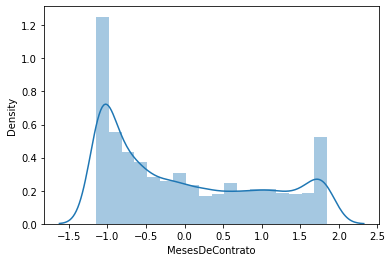

In [ ]:
sns.distplot(x_padronizado.MesesDeContrato)

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


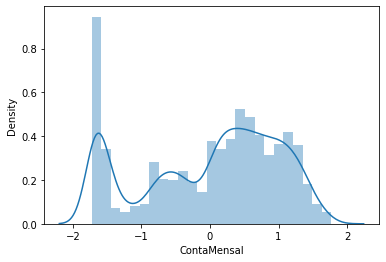

In [ ]:
sns.distplot(x_padronizado.ContaMensal)

In [ ]:
from sklearn.model_selection import train_test_split

SEED = 123
np.random.seed(SEED)

x_treino, x_teste, y_treino, y_teste = train_test_split(x_padronizado, y, test_size = 0.3)
x_treino.shape

(7243, 38)

In [ ]:
x_teste.shape

(3105, 38)

##Instanciando Modelo KNN e métrica de Distância

Agora que temos os dados padronizados e já separamos os dados para treino e teste, vamos de fato instanciar o nosso modelo de KNN com a biblioteca sklearn.neighbors, dela vamos importar a classe KNeighborsClassifier. Ela nos trás um modelo de KNN virgem/puro, no qual passamos a métrica de distância que ela vai usar para calcular a distância entre o novo ponto que queremos classificar e os pontos que nosso modelo já tem (dados de treino).

A métrica que vamos passar é a distância euclidiana. Nos ensinam a distância euclidiana na escola e ela é bem simples:
- ***Para planos 2d (2 variáveis explicativas/features***):

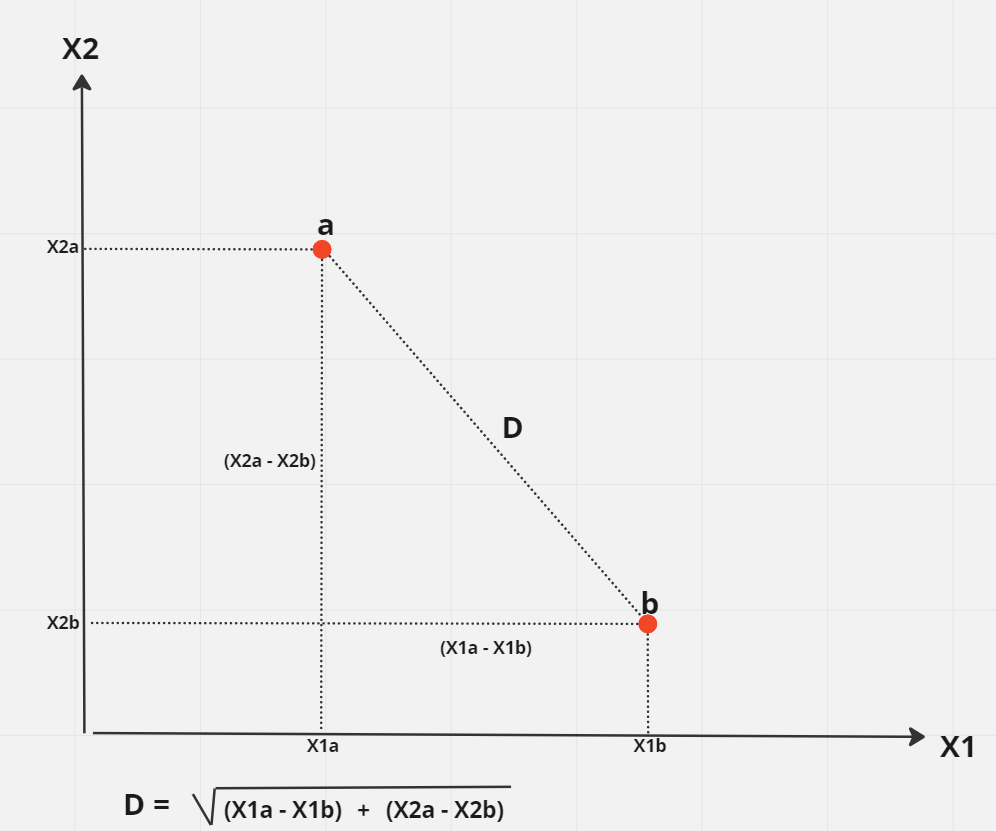

  - podemos ver que a distância D entre dois pontos no plano 2D é pode ser simplificado como sendo o cálculo da Hipotenusa do triangulo retangulo  de catetos (X1a - X1b) e (X2a -X2b).

- ***Para planos 3D temos a seguinte situação:***

Text(0.5, 0, 'X3')

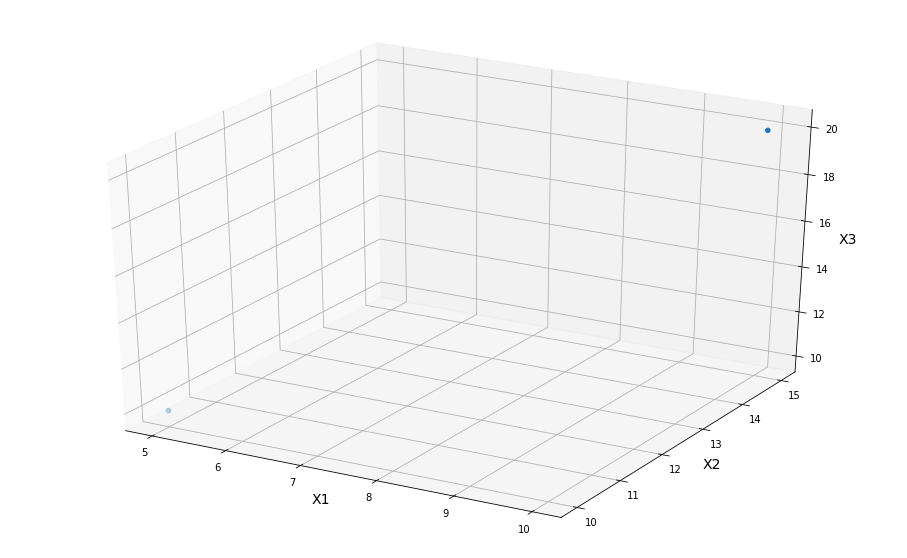

In [ ]:
import matplotlib.pyplot as plt

x = [5, 10]
y = [10, 15]
z = [10, 20]

fig = plt.figure()
fig.set_size_inches(16,10)

grafico = fig.add_subplot(111, projection = "3d")

grafico.scatter(x,y, z)
grafico.set_xlabel("X1", fontsize = 14)
grafico.set_ylabel("X2", fontsize = 14)
grafico.set_zlabel("X3", fontsize = 14)

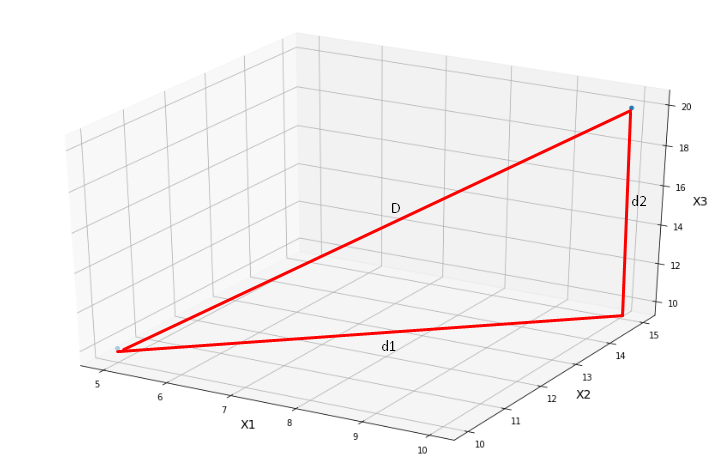

  - Podemos ver a distância D entre os dois pontos no espaço 3D é a Hipotenusa do triangulo retangulo de catetos d1 e d2. note que d1 também é a hipotenusa de catetos (X1a -X1b) e (X2a - X2b) e note que, d2 é a diferença do ponto a é b em ralação ao eixo X3, isto é, d2 = (X3a - X3b).
  - Logo podemos calcular D como sendo:

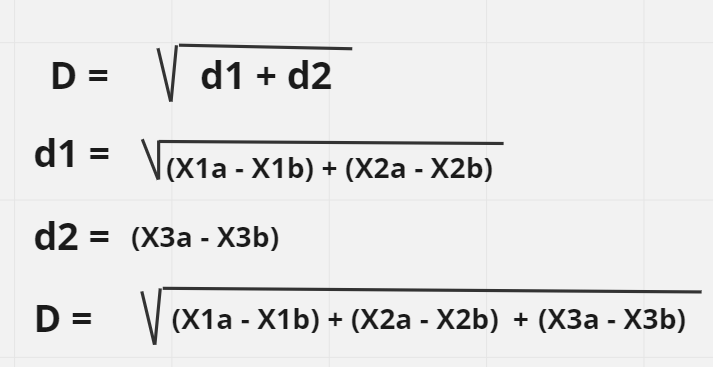

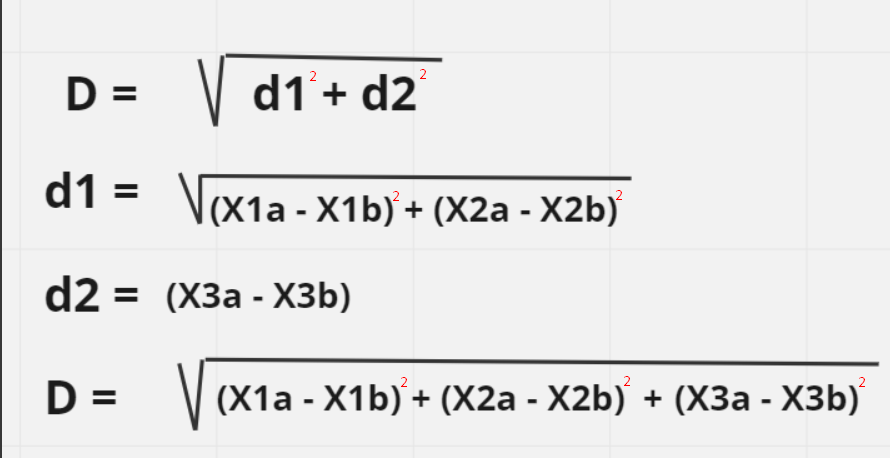

 - Disntancia euclidiana n Dimensões (mais de 3 fetures):
  - Para n, n > 3, dimensões a distância euclidiana pode ser calculada pela generalização que acabamos de descobrir, isto é, a distancia euclidiana entre dois pontos "a" e "b" é o somatória das diferenças entre as suas coordenadas X1, X2, X3, ..., Xn:  

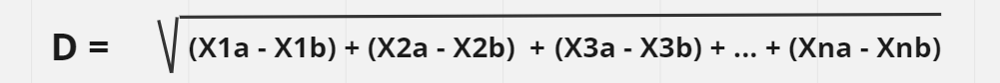

Para este nosso problema utilizaremos a distância euclidiana, mas podemos modificar a medida de distância utilizando o argumento metric da função sklearn.neighbors.KNeighborsClassifier podendo receber os seguintes valores:

“euclidean” para a distância euclidiana;
“manhattan” para a distância de Manhattan;
“minkowski” para a distância de Minkowski;
“chebyshev” para a distância de Chebyshev.

Você pode saber um pouco mais de cada distancia acessando o link sobre diferentes medidas de distância: https://colab.research.google.com/drive/15vA4nuXkiWp9c9yYgs13mnym-n0xDBIq

Vamos fazer um exemplo, vamos pegar uma linha (um ponto) de teste e calcular a distancia dele com outra linha (outro ponto):

In [ ]:
x_padronizado.iloc[0]#Digamos que esse é um novo elementos que queremos classificar

Maior65Anos                                     0.000000
Conjuge                                         1.000000
Dependentes                                     0.000000
MesesDeContrato                                -1.107684
TelefoneFixo                                    0.000000
PagamentoOnline                                 1.000000
ContaMensal                                    -1.321762
VariasLinhasTelefonicas_Nao                     0.000000
VariasLinhasTelefonicas_SemServicoTelefonico    1.000000
VariasLinhasTelefonicas_Sim                     0.000000
ServicoDeInternet_DSL                           1.000000
ServicoDeInternet_FibraOptica                   0.000000
ServicoDeInternet_Nao                           0.000000
SegurancaOnline_Nao                             1.000000
SegurancaOnline_SemServicoDeInternet            0.000000
SegurancaOnline_Sim                             0.000000
BackupOnline_Nao                                0.000000
BackupOnline_SemServicoDeIntern

In [ ]:
x_padronizado.iloc[1]#Vamos calcular a distancia entre o ponto da celula anterior com este

Maior65Anos                                     0.000000
Conjuge                                         0.000000
Dependentes                                     0.000000
MesesDeContrato                                 0.267214
TelefoneFixo                                    1.000000
PagamentoOnline                                 0.000000
ContaMensal                                    -0.379579
VariasLinhasTelefonicas_Nao                     1.000000
VariasLinhasTelefonicas_SemServicoTelefonico    0.000000
VariasLinhasTelefonicas_Sim                     0.000000
ServicoDeInternet_DSL                           1.000000
ServicoDeInternet_FibraOptica                   0.000000
ServicoDeInternet_Nao                           0.000000
SegurancaOnline_Nao                             0.000000
SegurancaOnline_SemServicoDeInternet            0.000000
SegurancaOnline_Sim                             1.000000
BackupOnline_Nao                                1.000000
BackupOnline_SemServicoDeIntern

In [ ]:
x_padronizado.iloc[0] - x_padronizado.iloc[1]#Calculando a diferença entre elas em relação a cada feature

Maior65Anos                                     0.000000
Conjuge                                         1.000000
Dependentes                                     0.000000
MesesDeContrato                                -1.374897
TelefoneFixo                                   -1.000000
PagamentoOnline                                 1.000000
ContaMensal                                    -0.942183
VariasLinhasTelefonicas_Nao                    -1.000000
VariasLinhasTelefonicas_SemServicoTelefonico    1.000000
VariasLinhasTelefonicas_Sim                     0.000000
ServicoDeInternet_DSL                           0.000000
ServicoDeInternet_FibraOptica                   0.000000
ServicoDeInternet_Nao                           0.000000
SegurancaOnline_Nao                             1.000000
SegurancaOnline_SemServicoDeInternet            0.000000
SegurancaOnline_Sim                            -1.000000
BackupOnline_Nao                               -1.000000
BackupOnline_SemServicoDeIntern

In [ ]:
(x_padronizado.iloc[0] - x_padronizado.iloc[1])**2#elevando cada diferença ao quadrado

Maior65Anos                                     0.000000
Conjuge                                         1.000000
Dependentes                                     0.000000
MesesDeContrato                                 1.890342
TelefoneFixo                                    1.000000
PagamentoOnline                                 1.000000
ContaMensal                                     0.887709
VariasLinhasTelefonicas_Nao                     1.000000
VariasLinhasTelefonicas_SemServicoTelefonico    1.000000
VariasLinhasTelefonicas_Sim                     0.000000
ServicoDeInternet_DSL                           0.000000
ServicoDeInternet_FibraOptica                   0.000000
ServicoDeInternet_Nao                           0.000000
SegurancaOnline_Nao                             1.000000
SegurancaOnline_SemServicoDeInternet            0.000000
SegurancaOnline_Sim                             1.000000
BackupOnline_Nao                                1.000000
BackupOnline_SemServicoDeIntern

In [ ]:
np.sum((x_padronizado.iloc[0] - x_padronizado.iloc[1])**2)# A soma da diferença das features

17.77805092008357

In [ ]:
np.sqrt(np.sum((x_padronizado.iloc[0] - x_padronizado.iloc[1])**2))

4.216402604126362

Temos que a distância euclidiana num espaço 38 Dimensional é de 4,216 unidades!


É isso que o KNN faz para cada um dos K vizinhos mais próximos. Sem mais de longas vamos importar o modelo:

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(metric = "euclidean")
knn.fit(x_treino, y_treino)
previsoes_knn = knn.predict(x_teste)
previsoes_knn

/usr/local/lib/python3.8/dist-packages/sklearn/neighbors/_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


array([1, 0, 0, ..., 0, 1, 1])

Por padrão, a classe KNeighborsClassifier usa K = 5, ou seja, a lista que nosso algoritmo vai usar de comparação para classificar os dados terá os 5 vizinhos mais próximos do novo dado que queremos classificar.

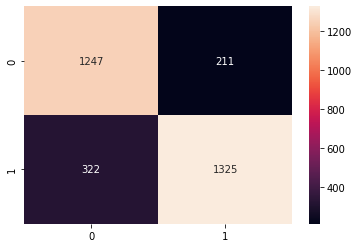

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix

sns.heatmap(confusion_matrix(previsoes_knn, y_teste), annot = True, fmt="d")

In [ ]:
print("Acurácia do modelo KNN : %.2f%%" % (accuracy_score(y_teste, previsoes_knn)*100) )

Acurácia do modelo KNN : 82.83%


#Modelo de Naive Bayes - Gaussiano/Normal

Também conhecido como teorema Gaussiano Naive Bayes, ele é um modelo probabilistico de machine learning supervisionado usado para a classificação quando as variáveis explicativas seguem a distribuição normal, daí o nome Gaussino.

Antes de comerçarmos devemos enterder o teorema de Bayes, que a probabilidade condicional:

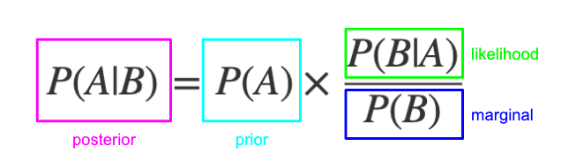

Traduzindo:

- P(A/B) --> probabilidade de A ocorrer, sabendo que já ocorreu B.
- P(A) --> Probabilidade de ocorrer A.
- P(B/A) --> Probabilidade de ocorrer B, sabendo que já ocorreu A.
- P(B) --> Probabilidade de ocorrer B.

Vamos explicar isso com o exempl clçássico do teste médico, que vai dizer se temos alguma doença ou não, com um nível de confiança (acurácia x%):

***EXEMPLO:***

Sabe-se previamente que, dentro de uma população de pessoas apenas 1% tem de fato cancer. Aqui no nosso exmeplo nossa população tem tamanho 1000. Ou seja, dentro da nossa população de 1000 pessoas temos:

  - 10 tem cancer de fato.
  - 990 não tem cancer.

  Um novo teste de cancer diz ter uma confiança de 90%, ou seja, a curácia dele é de 90%. A primeira coisa que devemos saber é interpretar isso, isto é, o que de fato significa ter confiança de 90%?

- Confiança de 90% = Acurácia de 90%:
  - Isso significa que, de todas as pessoas que não tem cancer de fato, ele vai acertar 90%, ou seja, vai dizer que não tem cancer.
  - Isso significa que, de todas as pessoas que tem cancer de fato, ele vai acertar 90%, ou seja, vai dizer que tem cancer.  

Saber interpretar a frase "confiança/acurá de 90%" é fundamental, pois dela tiramos as seguintes conclusões:







Situação inicial, temos um população de 1000 pessoas e sabemos previamente que 1% tem câncer. Logo desta população 10 tem câncer e 990 não tem:

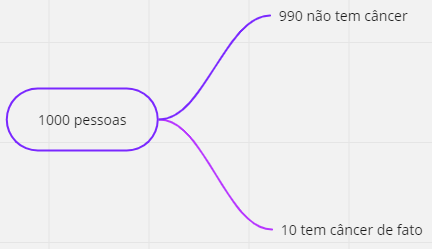

O teste que tem 90% de confiança/acurácia, vai conseguir classificar 90%  dos casos de forma correta, ou seja:

- Dos 990 que não tem câncer ele vai classificar 90% de forma correta, ou seja, classificar 90% como não tendo câncer.
- Dos 10 que tem câncer ele vai classificar  90% de forma correta, ou seja, classificar 90% como tendo câncer.

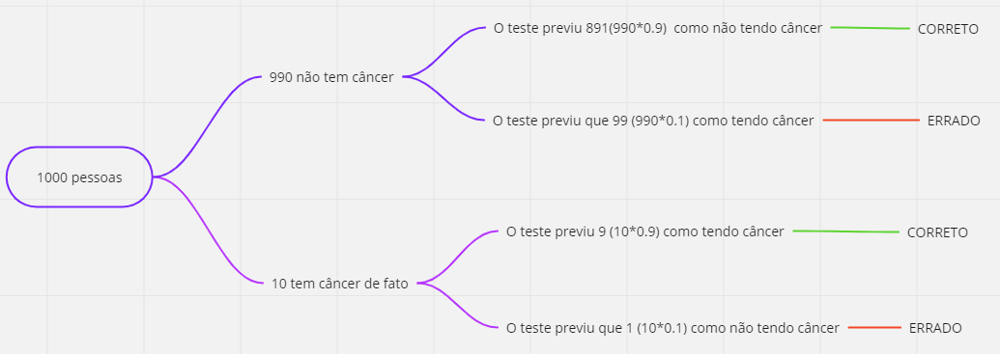

Agora vem a grande pergunta que todo mundo erra... Se uma pessoa dessa população fizer o teste e resultar como positivo, qual é a chance de que, de fato ela ter câncer?

- **Pessoas desavisadas (a maioria) vai dizer que é de 90%.... Tá errado!**



Isso ocorre porque esquecemos de levar em consideração de que o teste já deu positivo! Veja benévolo já ocorreu um evento!


***Seja B uma V.A onde, B = "Teste dar positivo para cancer".*** --> Esse é o vento que já ocorreu!!!


***Seja A uma V.A onde, A = "A pessoa de fato tem cancer".***


A nossa situação agora é:


P(A|B) --> probabilidade de que a pessoa de fato tenha câncer, sabendo que o teste deu positivo.



Para fazer esse calculo, devemos refazer a contagem de possibilidade levando em consideração que o evento B já ocorreu, isto é, que o teste para câncer deu positivo. Se levamos isso em consideração, vamos ter que seguir o seguinte raciocínio:

- Se o teste já deu positivo, eu faço a soma de todos os casos possíveis onde o teste vai dar positivo para câncer:

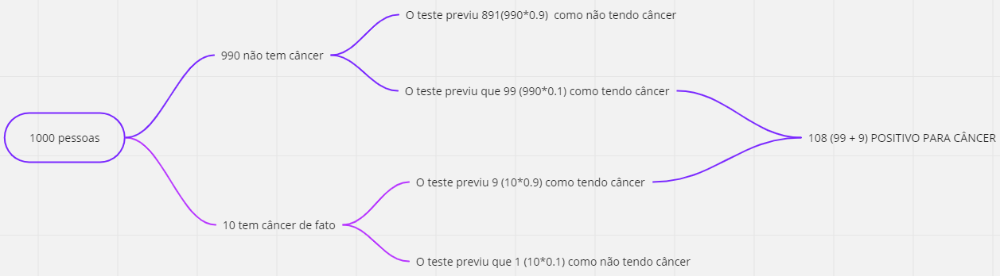

- Agora contamos os casos onde, o teste previu como tendo câncer e de fato a pessoa tinha:

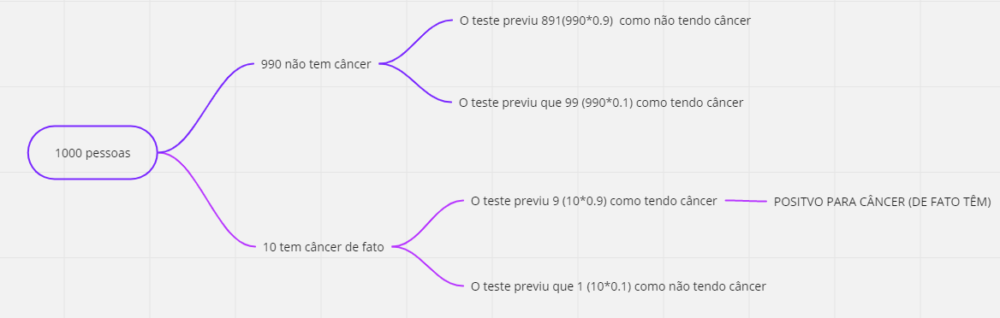

- Agora é aplicação de conceitos básicos de probabildade:
  - P(A|B) = PROPABILIDADE DE QUE A PESSOA TENHA CÂNCER DE FATO, SABENDO QUE TESTOU POSITIVO PARA CÂNCER
  - P(A|B) = Positivo p. Câncer (de fato têm)/ Posito para Câncer
  - P(A|B) = 9/108 = 0,083 = 8,3%


***Ou seja, a probabilidade de que a pessoa tenha câncer de fato, sabendo que o teste deu positivo para câncer é de 8,3%!! e não 90% como haviamos pensado***

Isso ocorre pela baixíssima probabilidade da pessoa ter câncer dentro da população, que é de 1%.

Benévolo, é isso que o terorema de Bayes faz, so que ele coloca isso numa fórmula genérica:

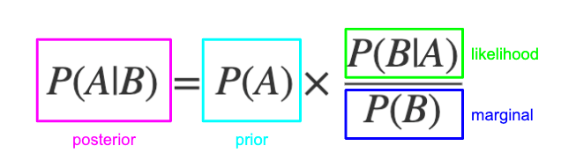

Dando nomes aos bois, para nosso caso temos que:

- ***A é uma V.A onde, A = "A pessoa tem câncer de fato"***
- ***B é uma V.A onde, B = "A pessoa testou positivo para câncer"***

O que queremos saber é: A probabilidade de que a pessoa tenha de fato câncer sabendo que ela testou positvo para câncer, ou seja:

P(A|B)

Já calculamos isso de forma lógica e metódica, usando apenas raciocínio lógico, agora vamos usar a fórmula do teorema de Bayes para fazer o mesmo cálculo:

- **P(A) = Probablidade de que a pessoa tenha câncer de fato:**
  - O enunciado nos forneceu essa informação, e é 1% = 0,01.

- **P(B) = probabilidade de que a pessoa tenha testado positivo para câncer.**
  - Atenção, neste caso devemos levar em consideração todos os casos possíveis onde a pessoa testa possitvo para câncer, eles são os seguintes:
  

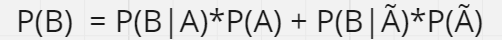

  - O que essa equação nos diz é que a probabilidade de ocorrer  o evento B, isto é, a probabilidade de de que a pessoa tenha testado positivo para câncer é a soma das probabilidades:
      - P(B|A)*P(A) --> prob. da pessoas ter testado positivo para cãncer e ela ter câncer de fato.
      - P(B|Ã)*P(Ã) --> prob. da pessoa ter testado positivo para câncer e ela não ter câncer de fato.

    - Pomos entender melhor essa equação vendo o diagrama de arvore de probabilidades:

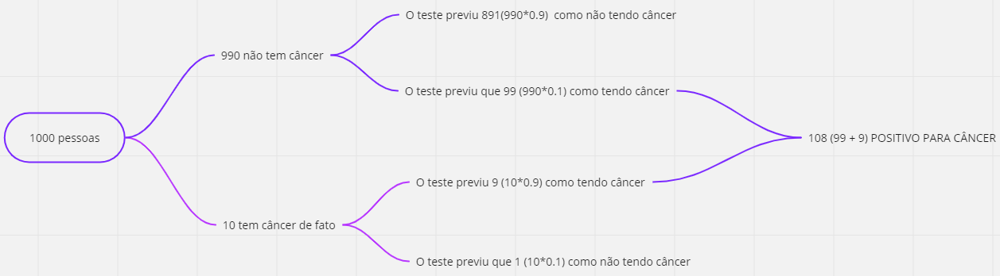

  - Aqui temos 108 casos onde a pessoa testa positivo para câncer.
    - 99 Casos onde as pessoas testam positivo mas não tem câncer de fato.
    - 9 Casos onde as pessoas testam positivo e tem câncer de fato.
  - P(B) = 108/1000 = 0.108 = 10,8% de chance da pessoa testar positivo para câncer.
    - Veja que essa conta nada mais é que fazer: P(B) = P(B|A) * P(A) + P(B|Ã) * P(Ã)
    - Prova:
    - P(B|A)*P(A) = 9/10 * 1/100% = 9/1000
    - P(B|Ã)*P(Ã) = 99/990 * 990/1000 = 99/1000
    - Logo:
    - P(B) = P(B|A) * P(A) + P(B|Ã) * P(Ã)
    - P(B) = 9/1000 + 99/1000 = 108/1000 = 10,8%

- **P(B|A) = Probabilidade de a pessoa teste positivo para câncer, sabendo que ela tem câncer de fato.**
  - Para fazer a contagem de casos, devemos assumir que o evento A já ocorreu, ou seja, devemos contar os casos onde a pessoa têm câncer e testar positivo:

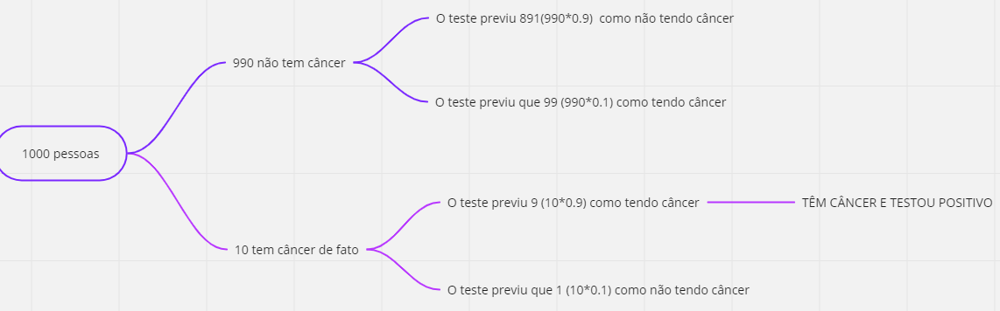

-
  - Aqui temos 9 pessoas que têm câncer de fato e testaram positivo para câncer.
  - Devemos dividir pelo número total de casos onde nosse evento a priori (que já sabemos), que no caso é A (a pessoa tem cãncer de fato), que é 10, portanto temos:
  - P(B|A) = 9/10 = 90% = 0,9

Veja que já temos o valor dos elementos que necessitamos para calcular a probabilidade P(A|B) seguindo a fórmula de Bayes:

 - P(B|A) = 0,9
 - P(B) = 0,108
 - P(A) = 0,01


Substituindo na equação temos:

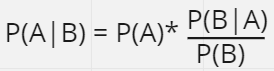

**OU**

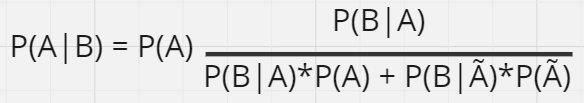

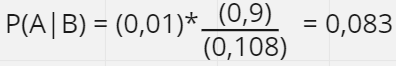

#Teoria Naive Bayes - geral

O que vamos entender agora, é lógica geral de como o modelo de classificação Naive Bayes usa o teorema de Naive Bayes para montar um sistema probabilistico para a classificação.

Digo "logica geral", pois, como veremos mais a diante, existem vários tipode de modelos de classificação de Naive Bayes, como Naive Bayes Gaussiano e Bernoulli.

O modelo de classificação vai tratar cada coluna do dataset como se fosse uma V.A. E a partir da base de dados (dados de treino) ele vai montar uma tabela probabilistica da onde ele vai tirar os valores probabilisticos que vão ser usados na formula de Bayes:

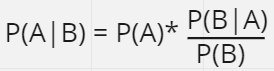

A melhor forma de explicar ele é pelo exemplo. digamos que nosso dataset é o seguinte:

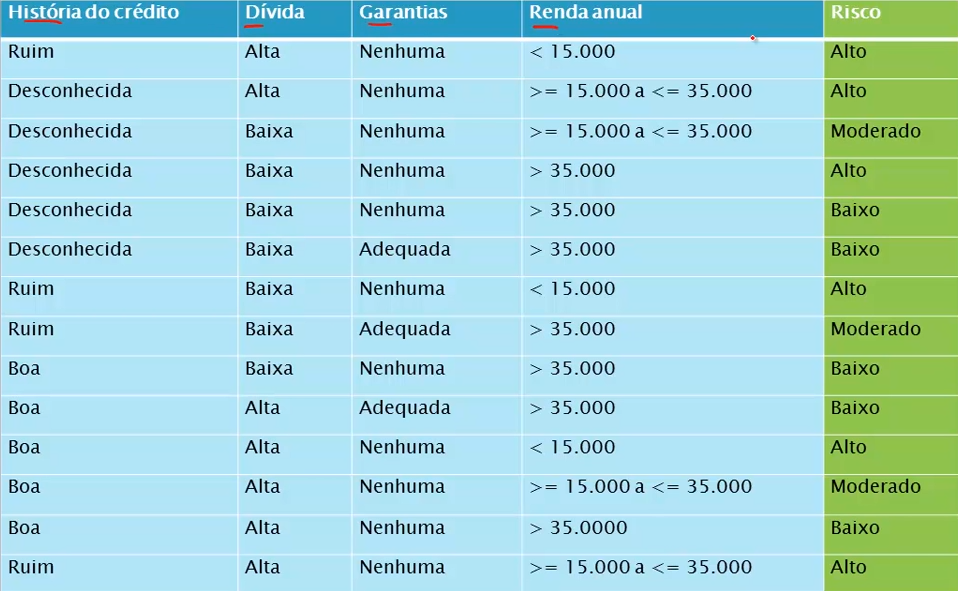

Onde minha variável dependente /target é Risco e as demais são as variáveis explicativas/independentes Xs. O objetivo é conseguir classificar um cliente como tendo Risco Alto, Moderado ou Baixo de dar calote ao banco. Para isso vamos analisar as variáveis:

- Histórico de crédito (Qualitativa)
- Dívida (Qualitativa)
- Garantias (Qualitativa)
- Renda Atual (Quantitativa)

Nossa base de dados tem 14 elementos.

A tabela probabilística que o algoritmo de Naive Bayes vai montar é a seguinte:




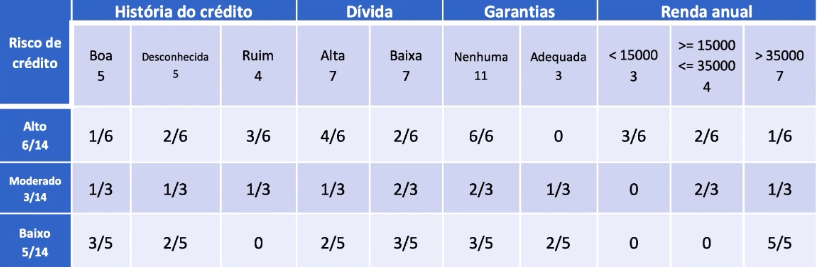

veja que:

- Índice = Variável depedente/Target
  - O índice da tabela probabilistica é o target do nosso problema, onde cada linha da tabela representa uma classificação possível dentro deste target/variável dependente.
  - Veja que, cada índice guarda a sua probabilidade simples, por exemplo:
  - O índice Alto tem probabilidade 6/14, pois de todos os 14 elementos/linhas do dataset 6 são classificados como tendo Risco Alto
  - O índice Moderado tem probabilidade 3/14, pois de todos os 14 elementos/linhas do dataset 3 são classificados como tendo Risco Moderado.
  - O índice Biaxo tem probabilidade 5/14, pois de todos os 14 elementos/linhas do dataset 5 são classificados como tendo Risco Baixo.

- As colunas são as variáveis explicativas.
  - A segunda linha de colunas são todos os valores possíveis dentro da variável explicativa, ou seja, a segunda linha mostra a frequencia total para aquele valor dentro do dataset. Por exemplo:

  - A coluna Dívida tem uma subcoluna para cada valor possível de Dívida, ou seja, temos 2 subcolunas: Alta e Baixa
    - Cada subcoluna tem sua frequência total, no exemplo das subcolunas Alta e Baixa da coluna Dívida, as frequencias são 7 e 7 (o que faz todo sentido, pois 7 + 7 = 14).

  - A coluna Garantia tem uma subcoluna para cada valor possível de Garantia, ou seja, temos 2 subcolunas: Nenhuma e Adequada.
    - Cada subcoluna tem sua frequência total, no exemplo das subcolunas Nenhuma e Adequada da coluna Garantia, as frequencias são 11 e 3 (o que faz todo sentido, pois 11 + 3 = 14).

  - A mesma lógica se repete para as demais subcolunas da demais variáveis explicatrivas/colunas.

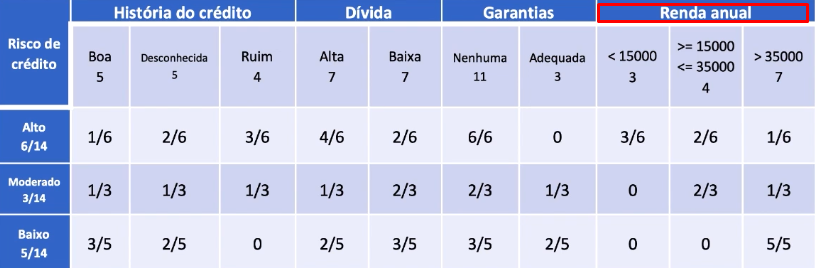

- Veja que, para as vaiáveis Quantitativas devemos fazer um tratamento de range e, apartir dessa divisão de ranges vamos calcular as probablidades. Por exemplo:

  - A coluna/Variável Renada Anual é quantitativa, logo foi feita uma divisão de ranges que simulam classes. As diviões foram as seguintes:
    - Renda Anual < 15000
    - 15000 <= Renda Anual <= 350000
    - Renda Anual > 350000
  - Veja que nas sub colunas que guarda esses ranges que criamos, vamos fazer a mesma coisa que fizemos com os outros sub grupos, isto é, vamos colocar as frequencias totais dessas classes que criamos. ou seja, temos que:
    - Dentro do dataset, das 14 linhas/elementos temos 3 elementos que tem Renda Anual < 150000.
  - Dentro do dataset, das 14 linhas/elementos temos 4 elementos que tem 150000 <= Renda Anual <= 350000.
  - Dentro do dataset, das 14 linhas/elementos temos  elementos que tem Renda Anual > 350000.




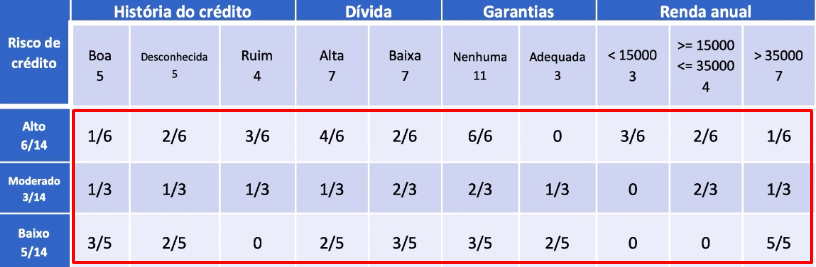

É agora que começamos a calcular as probabilidades. A forma de calcular essas probabilidades é assumir que a LINHA é o que já sabemos, ou seja, é nossa informação a prióri, e a COLUNA é a informação que queremos saber.

por exemplo:



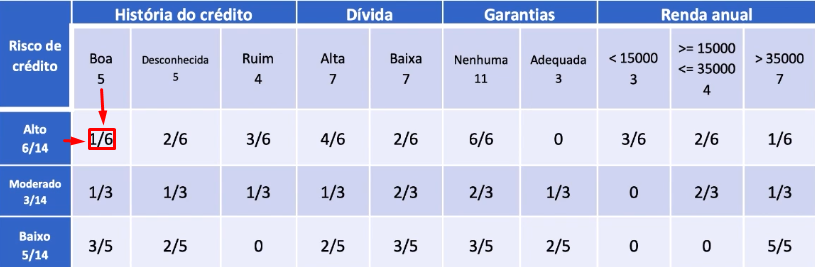

- Digamos que queremos preencher a célula linha 1 e coluina 1 (é a célula marcada na imagem), vamos proceder da seguinte forma:

  - A linha mostra a informa informação a priori, ou seja, neste caso nos mostra que o elemento tem classificação de Risco de Crédito como sendo Alto.
  - A a coluna nos mostra a informação que queremos saber, ou seja, queremos saber se o histórico de Crédito será Boa.
  - juntando as duas informações temos que:
  - P(Hist. Créd. Boa|Risc. Alto) = Probabilidade de que o elemento tenha Histórico de Crédito sendo Boa sabendo que sua classificação de Risco de Crédito é Alta.
    - Usando conceitos de probabilidade, vamos contar o número de elementos/linhas da nossa informação a prióri, ou seja, que tem Risco de Crédito sendo Alto. Contando isso na tabela original, vemos que existem 6 elementos assim.
     - Agora contamos a quantidade de elementos dentro destes 6 elementos que tiveram Hitória de Crédito sendo Boa. Se vizermos isso, cheganmos a 1 elemento/linha.
Agora podemos aplicar a probabilidade:
P(Hist. Créd. Boa|Risc. Alto) = 1/6

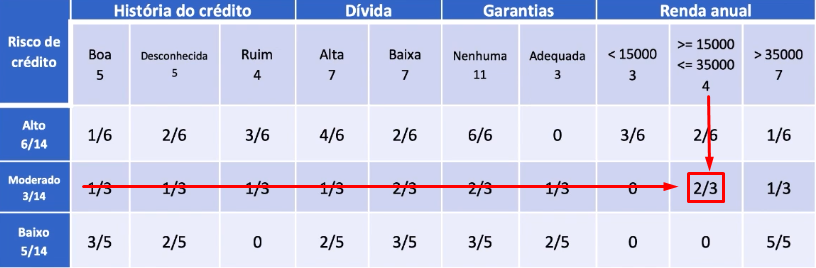

Outro exemplo.

- Digamos que queremos preencher a célula linha 2 e coluna 9 (é a célula marcada na imagem), vamos proceder da seguinte forma:

  - A coluna mostra a informa informação a que queremos saber, ou seja, neste caso queremos saber a prob. que o elemento tem Renda Anual entre [150k,350k[.
  - A a linha nos mostra a informação a prióri, ou seja, já sabemos que  a classificação de Risco de Crédito é Moderado.
  - juntando as duas informações temos que:
  - P(Renda Anual [150k,350[ | Risc. Moderado) = Probabilidade de que o elemento etnha Renda anual de [150k,350k[, sabendo que ele tem uma classificação de Risco de Crédito como sendo moderado.
  - Usando conceitos de probabilidade, vamos contar a quantidade de elementos do nosso caso a prióri, ou seja, vamos contar no dataset a quantidade de elementos que tem Risco de Crédito como sendo Moderado, se fizermos isso chemos em 3.
  - Agora contamos a quantidade de elementos dentro destes 3 elementos que tiveram Renda Anual entre [150k, 350k[. Se vizermos isso, cheganmos a 2 elementos/linhas.
  - Agora podemos aplicar a probabilidade:
    - P(Risc. Moderado|Renda Anual [150k,350[) = 2/3

Ou seja, aqui temos a tabela probabilistica condicional/Bayes onde o evento a prióri é a linha. Podemos ler essa tabela da seguinte forma:

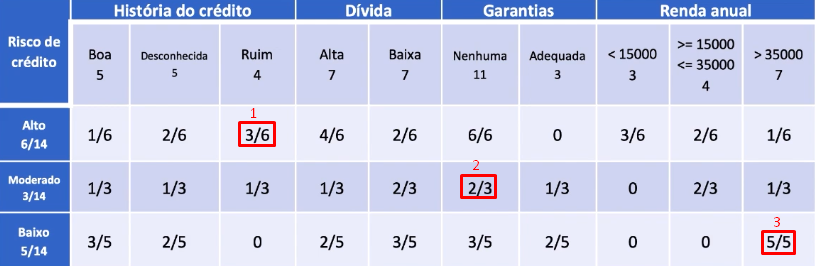

- Lendo célula 1,3 (marcada como 1):
  - P(Hist. = Ruim| Alto) = 3/5 = 50%
  - A probabilidade de que uma pessoa tenha Hist. de Crédito Ruim sabendo que ele tem o Risco de Crédito Alto é de 50%.


- Lendo célula 2,6 (marcada como 2):
  - P(Grant. = Nenhuma| Moderado) = 2/3
  - A probabilidade de que uma pessoa tenha Nenhuma garantia sabendo que ela tem classificação de Risco de Crédito Moderada é de 2/3 = 66%


- Lendo célula 3,10 (marcada como 3):
  - P(Rend.Anual > 350k| Baixo) = 5/5
  - A probabilidade de que uma pessoa tenha Renda Anula maior que 350k sabendo que ela tem classificação de Risco de Crédito Baixa é de 5/5 = 100%

Benévolo, veja então que o modelo de classificação de Naive Bayes necessita de uma tabela completa, isto é, ele necessita de um histórico, pois é a partir dele que o algoritmo vai montar esta tabela probabilistica que acabamos de ver.

##Funcionamento Naive Bayes Gaussiano

### Pré requisitos - Modelo Agussiano

O que vimos até agora sobre o modelo Naive Bayes se aplica a qualquer modelo de classificação Naive Bayes, inclusive o modelo Gaussiano que vamos explicar agora.

O modelo gaussiano como o nome já sugere, é um modelo que utilizamos quando o dataset usado apresenta as seguintes caracteristicas:


- As variáveis explicativas/independentes tem distribuição normal/gaussiana.
- Ou seja, as variáveis explicativas devem ser do tipo quantitativas!
- A variável dependente Y deve ser do tipo categórica.

### Funcionamento - Matématica intuitiva

Com esta tabela em mãos, o nosso algoritmo vai começar a fazer os calculos de probabilidade para cada entrada que ele recebe, isto é, ele vai calcular a probabilidade daquele elemento de entrada ser classificado como tendo Risco de Crédito Alta, Moderado ou Baixo, com base nas caracteristicas do mesmo elemento!

O nosso modelo vai escolher a classificação que tiver a maior probabilidade de ocorrer.

A melhor forma de explicar o funcionamento é com o exemplo.

Digamos que nosso modelo já está treinado, isto é, nosso modelo já montou sua tabela probabilistca a partir do dataset de treino que damos a ele. Agora ele vai receber um elemento com as seguintes caracteriticas:

- História de Crédito = Boa
- Dívida = Alta.
- Garantias = Nenhuma.
- Renda Anual = > 350k

Com essas caracteristicas em mãos, o nosso modelo vai ir para a tabela probabilista que ele montou e vai começar a calcular a seguinte probabilidade condicional:


- P(ALTO| Hist.= Boa, Dívida = Alta, Garant. = Nenhuma e Renda > 350k) = A prob. de ser classificado como Risco de Crédito Alto, sabendo que ele tem Hitória Boa, Dívida Alta, Nenhuma Garantia e Renda Anual maior que 350k.

Para calcular essa probabilidade condicional, podemos destrinchar ela da seguinte forma:

- P(ALTO| Hist.= Boa, Dívida = Alta, Garant. = Nenhuma e Renda > 350k) = P(ALTA) * P(Hist.= Boa|Alto) * P(Dívida = Alta|Alto) * P(Garant. = Nenhuma|Alto) * P( Renda > 350k|Alto)

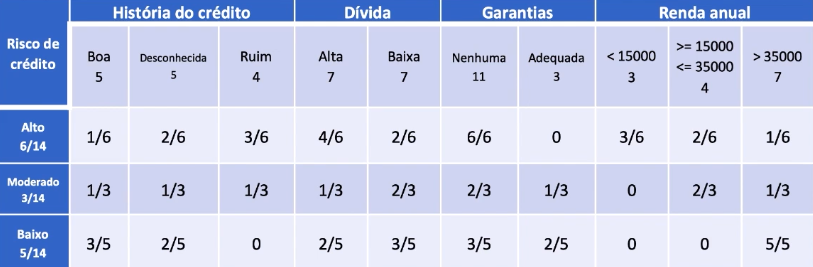

Vendo a tabela podemos substituir os valores:

P(ALTO| Hist.= Boa, Dívida = Alta, Garant. = Nenhuma e Renda > 350k) = 6/14 * 1/6 * 4/6 * 6/6 * 1/6 = 0,0079

Ou seja, veja que somente a primeira prob. a probabilidade de ser classificada como tendo Risco de Crédito Alto é independente, por isso P(Alta) = 6/14. As restantes das prob. estão condicionadas a este fato a prióri, isto é, estão condicionadas sabendo que o risco de crédito é Alto. Veja que poderiamos resolver essa probabilidade inteira apenas com o principio fundamental da matemática...

Seguindo com o algoritmo, agora seguindo o mesmo raciocínio mas agora para a classificação de Risco de Crédito = Moderado:

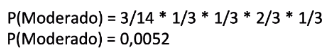

De novo, seguindo o mesmo raciocínio, vamos calcular a prob. do elemento novo ser classificado como tendo classificação de Risco de Crédito Baixo, sabendo das caracteristicas de entrada do elemento:

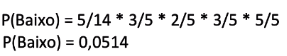

Comparando as 3 probabilidades, vamos escolher a maior delas para fazer a classificação de Risco de Crédito, ou seja, no nosso exemplo de entrada a classificação correta seria Risco de Crédito = Baixo.

Mas você pode estranhar que, se somarmos as 3 prbabilidades não chegaremos em 100% ou 1, na verdade chegaremos em 0,0645:

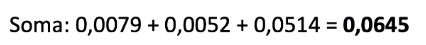

Para conseguirmos ajusar essas 3 probabilidades de tal forma que somadas eles resultem em 100%, devemos dividir elas pelo total, ou seja, devemos dividir elas por 0,0645:


image.png

image.png

image.png

Logo podemos concluir que o algoritmo de classificação Naive Bayes vai classificar esse elemento como tendo Risco de Crédito Baixo!

## Matemática formal - Naive Bayes Gaussiano

Formalizando as contas que acabamos de fazer, veja que calculamos a probabilidade condicional de algo ocorrer sabendo que já ocorreram várias outras, isto é, calculamos a probabilidade de que um elemento seja classificado como Alto, Moderado ou Baixo sabendo que, sabendo que ele tem as seguintes caracteristicas:

- História de Crédito = Boa
- Dívida = Alta.
- Garantias = Nenhuma.
- Renda Anual = > 350k

Veja que essa situação de probabilidade condicional é um pouco diferente da probabilidade condicional simples bayseana que aprendemos. A probabilidade simples bayseana era o calculo da probabilidade de algo ocorrer sabendo que apenas um evento já tinha ocorrido, e não vários eventos que é o nosso caso!

Antes de continuarmos vamos dar nome as bois... A formula geral para calcularmos a probabilidade condicional continua com o mesmo formato, isto é:

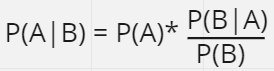

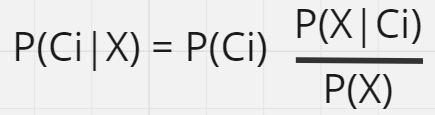

**OU**

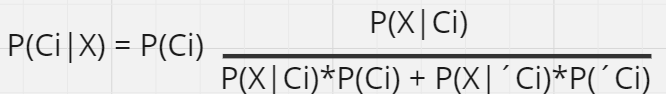

- **C**i --> É a classificação que eu quero calcular a probabilidade.
    - No nosso exemplo **C**i é a variável Risco de Crédito, que pode assumir os seguintes valores:
      - Alto, Moderado e Baixo.
      - Ou seja, temos 3 classificações.
- ***´C***i --> É a negação do evento Ci, isto é, a não ocorrencia de Ci.
  - Neste exemplo, ´Ci é a não ocorrència da classificação de cada uma das classificação.

- X --> São nossos eventos  a priori.
  - No nosso exemplo X representa os eventos a priori:
    - História de Crédito = Boa
    - Dívida = Alta.
    - Garantias = Nenhuma.
    - Renda Anual = > 350k
  - Veja que, X representa vários eventos e não apenas um!
  - Aqui temos 4 eventos a priori.

  

Vamos analisar mais afunda essa parte P(X|Ci)...Esse caso mais elaborado de porbabilidade condicional, onde X representa vários eventos é chamado de ***Função De Verossimilhança***:

A função de verossimilhança explica que:



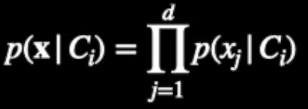

***Simplificando:***

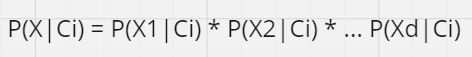

Traduzindo...
- A prob. de ocorrer todos os eventos representado por X sabendo que já ocorreu Ci será igual ao produto de da prob. de cada evento simples ocorrer sabendo ocorreu Ci.
- d é a quantidade de eventos que variável X representa.
- Para o nosso exemplo, isso significa que, a prob. de ocorrer todos os eventos já sabendo da Classificação (Alta, Moderada ou Baixa) será o produto de cada das probabilidades de ocorrer cada um dos eventos sabendo da clasificação.
- Para nosso exemplo:
  - Seja Ci = Alto, ou seja, A classificação de risco de crédito é Alto.
  - Seja X representante dos seguintes eventos:
    - História de Crédito = Boa
    - Dívida = Alta.
    - Garantias = Nenhuma.
    - Renda Anual = > 350k
    - Ou seja, neste caso d = 4.


Podemos afirmar que:

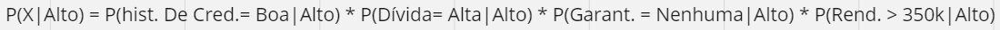

Substituindo os valores com base na nossa tabela:

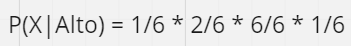

Voltando a nossa equação original...

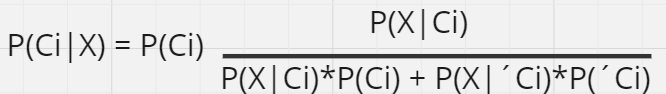

Sabemdo como calcular a probabilidade P(X|Ci), que era a parte mais difícil, podemos usar a formula no nosso exemplo, veja:

Nosso problema inicial era classificar o seguinte elemento de entrada:

  - História de Crédito = Boa
  - Dívida = Alta.
  - Garantias = Nenhuma.
  - Renda Anual = > 350k
  - Ou seja, neste caso d = 4.

Como tendo Risco de Crédito Alto, Moderado ou Baixo, com base nessas caracteristicas. Já sabemos da formula e sabemos como usar a função de verossimilhança, logo o que devmos fazer é calcular as seguintes prob. ⁉

 - P(Alto|X)
 - P(Moderado|X)
 - P(Baixo|X)

 E a classificação que tiver maior probabilidade será aquela que vamos usar parar classificar o elemento de entrada. Em matemátiquês temos:

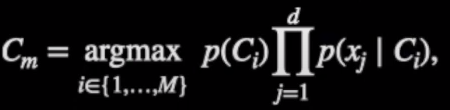

Vamos aos cálculos...

- Calculando P(Alto|X):
  - pela formula temos que:
  - P(Alto|X) = P(Alto) * P(X|Alto) / (P(X|Alto) * P(Alto) + P(X|´Alto)*P(´Alto))
    - Benévolo, perceba que, a não ocorrencia da classificaão de risco = Alto, significa no nosso exemplo, estamos no referindo a classificação de Risco com sendo Moderada ou Baixa, ou seja, temios que:
  - P(Alto|X) = P(Alto) * P(X|Alto) / (P(X|Alto) * P(Alto) + P(X|´Alto)*P(´Alto))
  - P(Alto|X) = P(Alto) * P(X|Alto) / (P(X|Alto) * P(Alto) + P(X|Baixo)*P(Baixo) + P(X|Moderado)*P(Moderado))
  - Vamos usar nossa tabela de probabilidades que montamos:

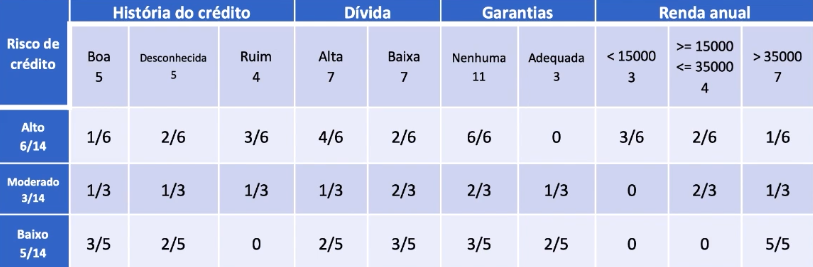

  - P(X|Alto) = 1/6 * 4/6 * 6/6 * 1/6 = 4/6³
  - P(Alto) = 6/14
  - P(X|Moderado) = 1/3 * 1/3 * 2/3 * 1/3 = 2/81
  - P(Moderado) = 3/14
  - P(X|Baixo) = 3/5 * 2/5 * 3/5 * 5/5 = 18/125
  - P(Baixo) = 5/14

  - Substituindo esse valores na equação original:
  - P(Alto|X) = P(Alto) * P(X|Alto) / (P(X|Alto) * P(Alto) + P(X|Baixo)P(Baixo) + P(X|Moderado)P(Moderado))
  - P(Alto|X) = (6/14) * (4/6³) / [ (4/6³ * 6/14) + (18/125 * 5/14) + (2/81 * 3/14) ]
  - P(Alto|x) = (6/14) * (4/6³) / [ (56/36) + (252/100) + (28/27) ]
  - P(Alto|x) = (6/14) * (4/6³) / [ (56/36) + (252/100) + (28/27) ]
  - ... fazendo os calculos
  - P(A|X) = 0,123 = 12,3%
  - Ou seja, a chance de que o elemento seja classificado com tendo Risco de Crédito Alto é de 12,3% com base nas suas caracteristicas (X).

- Mas ainda devemos aplicar a formula para cada uma das possibilidades, isto é, devemos aplicar para os casos:
- p(Moderado|X)
- P(Baixo|X)
- E como coosta na sugunda formula:

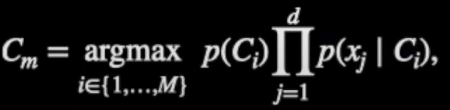![image.png](}{)

- A classificação final que o elemento de entrada X vai assumir, será aquela para qual a probabilidade é maior.
- Aplicando a mesma formula para os dois outros casos, temos as seguintes probabilidades:
- P(Moderado|X) = 8,6%
- P(Baixo|X) = 79,68%

Ou seja, quando comparamos as três probabilidades baysianas, vemos que aquela que tem maior probabilidade de ocorrer sabendo das caracteristicas do elemento de entrada (X) é para a classificação Baixo. Ou seja, nosso algoritmo baysiano gaussiano vai nos devolver como saida a classificação Baixo para Risco de Crédito.

#Aplicação Naive Bayes Gaussiano

Como já sabemos, o modelo de naive bayes gaussiano apenas se aplica a variáveis explicativas que tem distribuição gaussiana, ou seja, o modelo de Naive Bayes Gaussiano tem os seguintes pré requisitos:

***PRÉ REQUISITOS:***
- Variáveis Explicativas podem ser tanto Quantitivativas quanto Qualitativas.
- Mas as variávies Quantitativas devem ter distribuição normal.
- A variável Dependente Y deve ser categórica.

Vamos analisar se as nossas variáveis explicativas quantitativas seguem a distribuição normal:

In [ ]:
dados

,Maior65Anos,Conjuge,Dependentes,MesesDeContrato,TelefoneFixo,PagamentoOnline,ContaMensal,VariasLinhasTelefonicas_Nao,VariasLinhasTelefonicas_SemServicoTelefonico,VariasLinhasTelefonicas_Sim,ServicoDeInternet_DSL,ServicoDeInternet_FibraOptica,ServicoDeInternet_Nao,SegurancaOnline_Nao,SegurancaOnline_SemServicoDeInternet,SegurancaOnline_Sim,BackupOnline_Nao,BackupOnline_SemServicoDeInternet,BackupOnline_Sim,SeguroNoDispositivo_Nao,SeguroNoDispositivo_SemServicoDeInternet,SeguroNoDispositivo_Sim,SuporteTecnico_Nao,SuporteTecnico_SemServicoDeInternet,SuporteTecnico_Sim,TVaCabo_Nao,TVaCabo_SemServicoDeInternet,TVaCabo_Sim,StreamingDeFilmes_Nao,StreamingDeFilmes_SemServicoDeInternet,StreamingDeFilmes_Sim,TipoDeContrato_DoisAnos,TipoDeContrato_Mensalmente,TipoDeContrato_UmAno,FormaDePagamento_CartaoDeCredito,FormaDePagamento_ChequeDigital,FormaDePagamento_ChequePapel,FormaDePagamento_DebitoEmConta,Churn
0,0,1,0,1,0,1,29.850000,0,1,0,1,0,0,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0
1,0,0,0,34,1,0,56.950000,1,0,0,1,0,0,0,0,1,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0
2,0,0,0,2,1,1,53.850000,1,0,0,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,1
3,0,0,0,45,0,0,42.300000,0,1,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,0,0,1,0,0,0,1,0
4,0,0,0,2,1,1,70.700000,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10343,0,1,0,5,1,1,80.921075,0,0,1,0,1,0,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,1
10344,0,0,0,3,1,1,74.347278,0,0,1,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,1
10345,0,0,0,18,1,1,70.164647,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,1
10346,0,0,0,30,1,0,93.024726,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,1


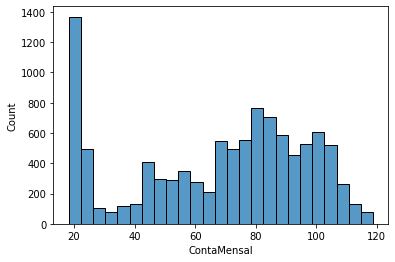

In [ ]:
sns.histplot(dados.ContaMensal)

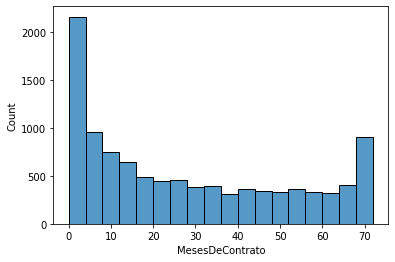

In [ ]:
sns.histplot(dados.MesesDeContrato)

Já vemos que nossas variáveis quantitativas não seguem um dist. normal, neste caso não dá para ajustar, pois o ajuste consegue ser feito com sucesso em distribuições assimétricas ou a direita ou a esquerda. No noss caso, a distribuição é assimétrica tanto a direita quanto a esquerda...

Podemos tentar aplicar o método de Naive Bayes Gaussiano, mas já com pressentimento de que a acurácia irá ser baixa:

In [ ]:
from sklearn.model_selection import train_test_split

SEED = 123
np.random.seed(SEED)

y = dados[['Churn']]

x_treino_NBGaussiano, x_teste_NBGaussiano, y_treino, y_teste = train_test_split(dados[["MesesDeContrato", "ContaMensal"]], y, test_size = 0.3)
x_treino_NBGaussiano.shape

(7243, 2)

In [ ]:
x_treino_NBGaussiano

,MesesDeContrato,ContaMensal
4831,18,40.200000
5077,7,19.850000
9023,1,70.391538
4424,1,24.750000
5236,41,89.550000
...,...,...
9785,13,89.090342
7763,1,50.455795
5218,0,19.700000
1346,14,87.250000


In [ ]:
y_treino

,Churn
4831,0
5077,0
9023,1
4424,1
5236,0
...,...
9785,1
7763,1
5218,0
1346,1


In [ ]:
from sklearn.naive_bayes import GaussianNB

modelo_NBGaussiano = GaussianNB()
modelo_NBGaussiano.fit(x_treino_NBGaussiano, y_treino)
predicao_NBGaussiano = modelo_NBGaussiano.predict(x_teste_NBGaussiano)

/usr/local/lib/python3.8/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix

accuracy_score(y_teste,predicao_NBGaussiano)

0.7162640901771337

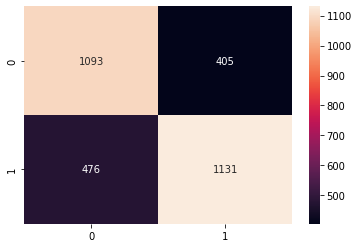

In [ ]:
sns.heatmap(confusion_matrix(predicao_NBGaussiano, y_teste), annot = True, fmt="d")

Comparando com o modelo de classifição KNN que obteve acurácia de 82%, vemos que o modelo de Naive Bayes Gaussiano não é tão performatico quanto esse, o que já era esperado, uma vez que as variáveis explicativas quantitativas não seguiam a distribuição gaussiana.

# Naive Bayes Bernoulli - Teoria

### Pré requisitos

Como o nome já sugere, o modelo de classificação Naive Bayes Bernoulli é usado quando o dataset apresenta as seguintes caracteristicas:

- As variáveis explicativas/independentes apresentam distribuição binomial.
  - Veja que, variáveis categóricas/Qualitativas podem ser usadas neste tipo de modelo, mas somente se elas tiverem duas categorias (0 ou 1).
  - Podemos aplicar o método dumies do pandas que vai fazer essa tratamento nas variáveis categoricas com mais de 2 categorias internas.
- A variável dependente Y deve ser do tipo Categórica. podendo ter duas ou mais categorias dentro dela.
- Relembrando o que seria uma distribuição de Bernoulli, é a distribuição onde existem apenas duas colunas de frequência:

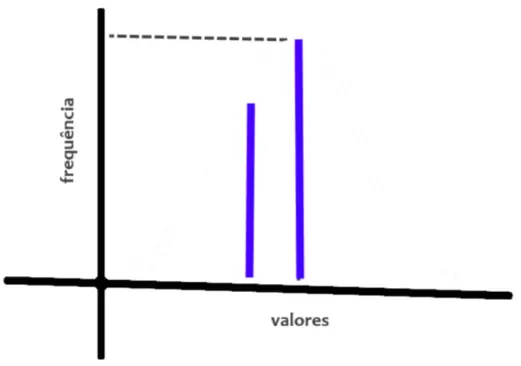

### Matemática (por cima)

Aqui vamos usar a mesma formula classica (não a formula de naive bayes gaussiana) de probabilidade condicional:

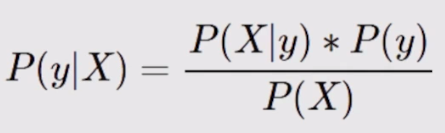

O único problema, é quando vamos calcular a prob. condicional de que ocorra as caracteristicas X do elemento de entrada sabendo que ocorreu a classificação y, que está na formula:

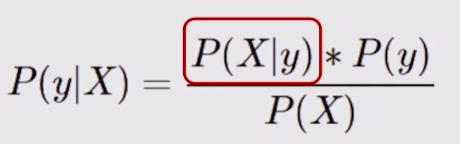

Devemos levar em consideração que estamos lidando com um dataset onde X (lebrando que X representa todas as variáveis explicativas) que representa variáveis explicativas que tem distribuição de Bernoulli e não Gaussiana! Vamos expandir essa parte marcada em vermelho:

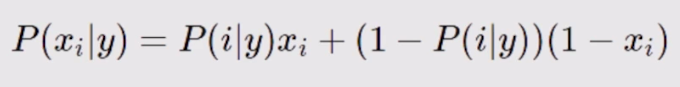

traduzindo:
  - i --> Uma das variáveis explicativas.
  - Y --> A calssificação da variável dependente.
  - Xi --> São todas as variáveis explicativas juntas.
  - P(i|y) --> prob. de que a variável explicativa i (apenas uma variável explicativa) ocorrer com valor i, sabendo que a classificação é y.
  - P(Xi|y) --> prob. de que ocorram todas as  caracteristicas do elemento de entrada (todas as variáveis explicativas) sabendo que a classificação final é Y.

#Naive Bayes Bernoulli Aplicação

Agora que entendemos a teoria básica do algoritmo de classificação de Naive Bayes de Bernoulli, vamos aplicar esse modelo no nosso Dataset para tentar prever se uma pessoas vai deixar de ser cliente da nossa empresa de Telecom.

Antes disso vamos releembrar os pré requisitos que o Naive Bayes de Bernoulli nos pede:

- Variáveis Categóricas com apenas duas categorias (0 ou 1)
- Variável dependente Y Categórica com 2 ou mais categorias.

Vamos analisar nossos dados para ver se as nossas variáveis explicativas seguem a distribuição de Bernoulli:

In [ ]:
dados

,Maior65Anos,Conjuge,Dependentes,MesesDeContrato,TelefoneFixo,PagamentoOnline,ContaMensal,VariasLinhasTelefonicas_Nao,VariasLinhasTelefonicas_SemServicoTelefonico,VariasLinhasTelefonicas_Sim,ServicoDeInternet_DSL,ServicoDeInternet_FibraOptica,ServicoDeInternet_Nao,SegurancaOnline_Nao,SegurancaOnline_SemServicoDeInternet,SegurancaOnline_Sim,BackupOnline_Nao,BackupOnline_SemServicoDeInternet,BackupOnline_Sim,SeguroNoDispositivo_Nao,SeguroNoDispositivo_SemServicoDeInternet,SeguroNoDispositivo_Sim,SuporteTecnico_Nao,SuporteTecnico_SemServicoDeInternet,SuporteTecnico_Sim,TVaCabo_Nao,TVaCabo_SemServicoDeInternet,TVaCabo_Sim,StreamingDeFilmes_Nao,StreamingDeFilmes_SemServicoDeInternet,StreamingDeFilmes_Sim,TipoDeContrato_DoisAnos,TipoDeContrato_Mensalmente,TipoDeContrato_UmAno,FormaDePagamento_CartaoDeCredito,FormaDePagamento_ChequeDigital,FormaDePagamento_ChequePapel,FormaDePagamento_DebitoEmConta,Churn
0,0,1,0,1,0,1,29.850000,0,1,0,1,0,0,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0
1,0,0,0,34,1,0,56.950000,1,0,0,1,0,0,0,0,1,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0
2,0,0,0,2,1,1,53.850000,1,0,0,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,1
3,0,0,0,45,0,0,42.300000,0,1,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,0,0,1,0,0,0,1,0
4,0,0,0,2,1,1,70.700000,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10343,0,1,0,5,1,1,80.921075,0,0,1,0,1,0,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,1
10344,0,0,0,3,1,1,74.347278,0,0,1,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,1
10345,0,0,0,18,1,1,70.164647,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,1
10346,0,0,0,30,1,0,93.024726,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,1


Gerando os gráficos de distribuição:

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

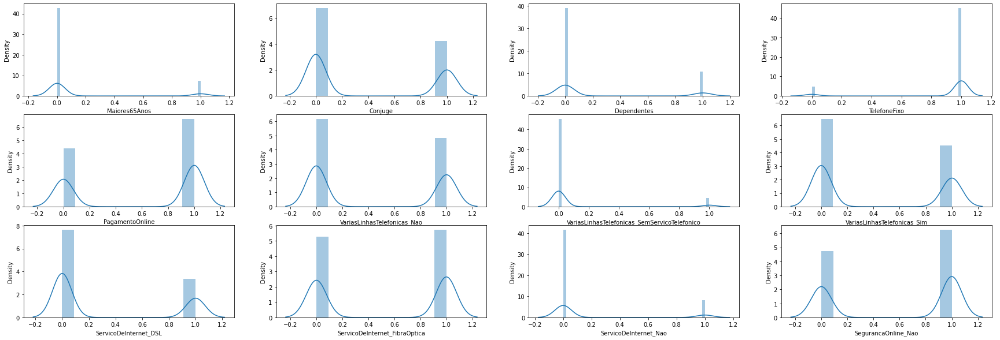

In [ ]:
fig, x = plt.subplots(3,4, figsize=(30, 10))
sns.distplot(ax = x[0,0], x = dados.Maior65Anos, axlabel = "Maiores65Anos")
sns.distplot(ax = x[0,1], x = dados.Conjuge, axlabel = "Conjuge")
sns.distplot(ax = x[0,2], x = dados.Dependentes, axlabel = "Dependentes")
sns.distplot(ax = x[0,3], x = dados.TelefoneFixo, axlabel = "TelefoneFixo")

sns.distplot(ax = x[1,0], x = dados.PagamentoOnline, axlabel = "PagamentoOnline")
sns.distplot(ax = x[1,1], x = dados.VariasLinhasTelefonicas_Nao, axlabel = "VariasLinhasTelefonicas_Nao")
sns.distplot(ax = x[1,2], x = dados.VariasLinhasTelefonicas_SemServicoTelefonico, axlabel = "VariasLinhasTelefonicas_SemServicoTelefonico")
sns.distplot(ax = x[1,3], x = dados.VariasLinhasTelefonicas_Sim, axlabel = "VariasLinhasTelefonicas_Sim")

sns.distplot(ax = x[2,0], x = dados.ServicoDeInternet_DSL, axlabel = "ServicoDeInternet_DSL")
sns.distplot(ax = x[2,1], x = dados.ServicoDeInternet_FibraOptica, axlabel = "ServicoDeInternet_FibraOptica")
sns.distplot(ax = x[2,2], x = dados.ServicoDeInternet_Nao, axlabel = "ServicoDeInternet_Nao")
sns.distplot(ax = x[2,3], x = dados.SegurancaOnline_Nao, axlabel = "SegurancaOnline_Nao")


Bom, não plotamos os gráficos de distribuição de todas nossas variávies explicativas categorticas, mas conseguimos ver que todas elas apresentam distribuição de Bernoulli, pois cada uma dela contém apenas duas categorias (0 ou 1). As únicas variáveis explicativas não categóricas que temos no nosso dataset são as variávies "ContaMensal" e "MesesDeContrato".

Por enquanto, vamos usar somente as variáveis categóricas como variávies explicativas:

In [ ]:
from sklearn.model_selection import train_test_split

SEED = 123
np.random.seed(SEED)

x_treino, x_teste, y_treino, y_teste = train_test_split(dados.drop(["MesesDeContrato", "ContaMensal"], axis=1), y, test_size = 0.3)
x_treino.shape

(7243, 37)

In [ ]:
x_treino

,Maior65Anos,Conjuge,Dependentes,TelefoneFixo,PagamentoOnline,VariasLinhasTelefonicas_Nao,VariasLinhasTelefonicas_SemServicoTelefonico,VariasLinhasTelefonicas_Sim,ServicoDeInternet_DSL,ServicoDeInternet_FibraOptica,ServicoDeInternet_Nao,SegurancaOnline_Nao,SegurancaOnline_SemServicoDeInternet,SegurancaOnline_Sim,BackupOnline_Nao,BackupOnline_SemServicoDeInternet,BackupOnline_Sim,SeguroNoDispositivo_Nao,SeguroNoDispositivo_SemServicoDeInternet,SeguroNoDispositivo_Sim,SuporteTecnico_Nao,SuporteTecnico_SemServicoDeInternet,SuporteTecnico_Sim,TVaCabo_Nao,TVaCabo_SemServicoDeInternet,TVaCabo_Sim,StreamingDeFilmes_Nao,StreamingDeFilmes_SemServicoDeInternet,StreamingDeFilmes_Sim,TipoDeContrato_DoisAnos,TipoDeContrato_Mensalmente,TipoDeContrato_UmAno,FormaDePagamento_CartaoDeCredito,FormaDePagamento_ChequeDigital,FormaDePagamento_ChequePapel,FormaDePagamento_DebitoEmConta,Churn
4831,0,0,0,0,1,0,1,0,1,0,0,0,0,1,0,0,1,1,0,0,0,0,1,1,0,0,1,0,0,0,0,1,0,0,1,0,0
5077,0,1,1,1,0,1,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0
9023,0,0,0,1,0,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,1
4424,0,0,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,1
5236,0,0,0,1,1,1,0,0,0,1,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,1,1,0,0,0,0,1,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9785,0,1,0,1,1,1,0,0,0,1,0,1,0,0,0,0,1,1,0,0,0,0,1,1,0,0,0,0,1,0,1,0,0,0,0,0,1
7763,0,0,0,0,1,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,1,0,0,1,0,0,1
5218,0,1,1,1,1,1,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0
1346,0,1,1,1,1,0,0,1,0,1,0,1,0,0,1,0,0,0,0,1,1,0,0,1,0,0,0,0,1,0,1,0,0,1,0,0,1


In [ ]:
y_treino

,Churn
4831,0
5077,0
9023,1
4424,1
5236,0
...,...
9785,1
7763,1
5218,0
1346,1


In [ ]:
from sklearn.naive_bayes import BernoulliNB

modelo_NBBernoulli = BernoulliNB()
modelo_NBBernoulli.fit(x_treino, y_treino)
predicoes_NBBernoulli =  modelo_NBBernoulli.predict(x_teste)


/usr/local/lib/python3.8/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix

accuracy_score(y_teste,predicoes_NBBernoulli)

0.9555555555555556

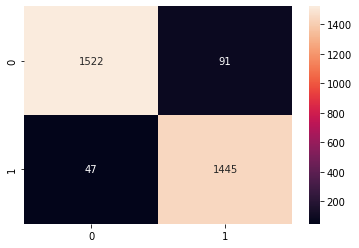

In [ ]:
sns.heatmap(confusion_matrix(predicoes_NBBernoulli, y_teste), annot = True, fmt="d")

BENÉVOLO, CHEGAMOS NUMA ACURÁCIA DE 95% QUE É ALTISSÍMA! Quando comparamos com os outros modelos de classificação podemos ver que:

- Classificação Com Naive Bayes Bernoulii --> 95% Acurácia.
- Classificação Com Naive Bayes Bernoulii --> 71% Acurácia.
- Classificação Com KNN --> 82% Acurácia.

Ou seja, chegamos a nossa máxima acurácia com o modelo de Naive Bayes Bernoulli até o momento.


#Naive Bayes Multinomial

Este é a adpatação do algoritmo de classificação Naive Bayes para o caso onde as variávies explicativas sejem uma distribuição Multinomial. Releembrando o que seria uma distribição Multinomial:

- Distribuição Multinomial.
  - É uma distribuição exclusiva de variávies categóricas/qualitativas onde existem mais de 2 categorias internas dentro ca variável.
  - Por exemplo, uma variável categórica multinomial seria "Raça", pois nela teriamos a seguinte categorias:
    - Branco.
    - Preto.
    - Pardo.

Logo, veja que o pré requisito do modelo de classificação Naive Bayes Multinomial é:

- Variávies explicativas do tipo Categóricas com mais de 2 categorias internas.
- Variável dependente Y do tipo Categórica.


Primeira coisa que vamos ter que fazer é a transformação das categorias dentro de cada variável explicativa em números. Vamos olhas nosso dataset original:

In [ ]:
link = "https://raw.githubusercontent.com/alura-cursos/ML_Classificacao_por_tras_dos_panos/main/Dados/Customer-Churn.csv"
dados_virgem = pd.read_csv(link, sep =",")
dados_virgem

,Maior65Anos,Conjuge,Dependentes,MesesDeContrato,TelefoneFixo,VariasLinhasTelefonicas,ServicoDeInternet,SegurancaOnline,BackupOnline,SeguroNoDispositivo,SuporteTecnico,TVaCabo,StreamingDeFilmes,TipoDeContrato,PagamentoOnline,FormaDePagamento,ContaMensal,Churn
0,0,Sim,Nao,1,Nao,SemServicoTelefonico,DSL,Nao,Sim,Nao,Nao,Nao,Nao,Mensalmente,Sim,ChequeDigital,29.85,Nao
1,0,Nao,Nao,34,Sim,Nao,DSL,Sim,Nao,Sim,Nao,Nao,Nao,UmAno,Nao,ChequePapel,56.95,Nao
2,0,Nao,Nao,2,Sim,Nao,DSL,Sim,Sim,Nao,Nao,Nao,Nao,Mensalmente,Sim,ChequePapel,53.85,Sim
3,0,Nao,Nao,45,Nao,SemServicoTelefonico,DSL,Sim,Nao,Sim,Sim,Nao,Nao,UmAno,Nao,DebitoEmConta,42.30,Nao
4,0,Nao,Nao,2,Sim,Nao,FibraOptica,Nao,Nao,Nao,Nao,Nao,Nao,Mensalmente,Sim,ChequeDigital,70.70,Sim
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,0,Sim,Sim,24,Sim,Sim,DSL,Sim,Nao,Sim,Sim,Sim,Sim,UmAno,Sim,ChequePapel,84.80,Nao
7039,0,Sim,Sim,72,Sim,Sim,FibraOptica,Nao,Sim,Sim,Nao,Sim,Sim,UmAno,Sim,CartaoDeCredito,103.20,Nao
7040,0,Sim,Sim,11,Nao,SemServicoTelefonico,DSL,Sim,Nao,Nao,Nao,Nao,Nao,Mensalmente,Sim,ChequeDigital,29.60,Nao
7041,1,Sim,Nao,4,Sim,Sim,FibraOptica,Nao,Nao,Nao,Nao,Nao,Nao,Mensalmente,Sim,ChequePapel,74.40,Sim


##Transformação String em Números - Sklearn LabelEnconder

Vamos fazer a transformação das categorias dentro de uma variável Categórica utilizando a classe LabelEnconder do Sklearn. Diferente do método get_dummies() do pandas, o método LabelEnconder vai transformar elementos do tipo String em número sem ter que criar novas colunas, isso se deve ao fato de que o LabelEnconder aceita atribuir vários números para String diferentes. Para comparação, o método get_dummies() somente tinha os números 0 e 1, ou seja, se a coluna tinha mais de 2 categorias o método get_dummies() criava uma nova coluna.

Vamos para a aplicação método LabelEnconder:

In [ ]:
from sklearn.preprocessing import LabelEncoder
# vamos ver que instanciar um objeto da classe LabelEconder para cada coluna que queremos transformar:
for i in dados_virgem.drop(["MesesDeContrato", "ContaMensal"], axis = 1).columns:
  label_enconder_trabalhador = LabelEncoder()
  dados_virgem[i] = label_enconder_trabalhador.fit_transform(dados_virgem[i])
dados_virgem

,Maior65Anos,Conjuge,Dependentes,MesesDeContrato,TelefoneFixo,VariasLinhasTelefonicas,ServicoDeInternet,SegurancaOnline,BackupOnline,SeguroNoDispositivo,SuporteTecnico,TVaCabo,StreamingDeFilmes,TipoDeContrato,PagamentoOnline,FormaDePagamento,ContaMensal,Churn
0,0,1,0,1,0,1,0,0,2,0,0,0,0,1,1,1,29.85,0
1,0,0,0,34,1,0,0,2,0,2,0,0,0,2,0,2,56.95,0
2,0,0,0,2,1,0,0,2,2,0,0,0,0,1,1,2,53.85,1
3,0,0,0,45,0,1,0,2,0,2,2,0,0,2,0,3,42.30,0
4,0,0,0,2,1,0,1,0,0,0,0,0,0,1,1,1,70.70,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,0,1,1,24,1,2,0,2,0,2,2,2,2,2,1,2,84.80,0
7039,0,1,1,72,1,2,1,0,2,2,0,2,2,2,1,0,103.20,0
7040,0,1,1,11,0,1,0,2,0,0,0,0,0,1,1,1,29.60,0
7041,1,1,0,4,1,2,1,0,0,0,0,0,0,1,1,2,74.40,1


Plotando gráficos de distribuição das variáveis explicativas para ver se a transformação foi realizada com sucesso:

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

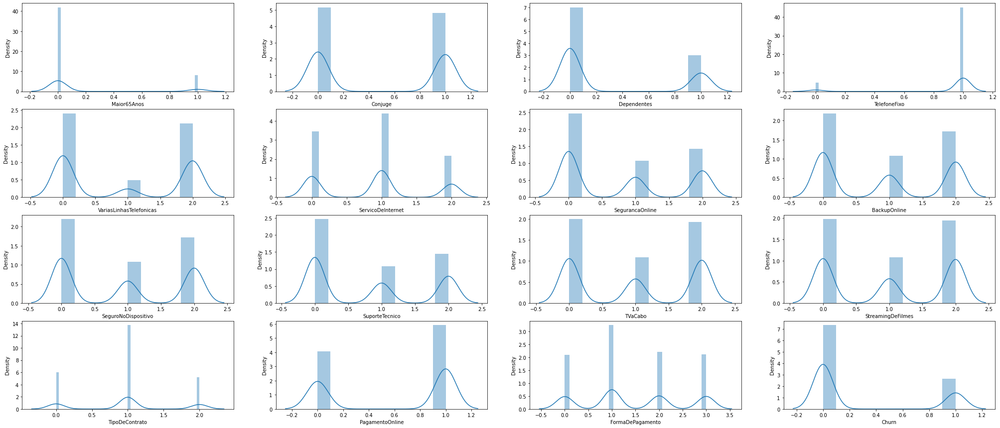

In [ ]:
fig, x = plt.subplots(4,4, figsize=(35, 15))
nomes = dados_virgem.drop(["MesesDeContrato", "ContaMensal"], axis = 1).columns
contador = 0
for i in range(4):
  for j in range(4):
    sns.distplot(ax = x[i,j], x = dados_virgem[nomes[contador]], axlabel = nomes[contador])
    contador += 1

Agora temos que os dados transformados, vamos fazer o balancemanto de classes pelo método SMOTE:

In [ ]:
y = dados_virgem["Churn"]
x = dados_virgem.drop(["MesesDeContrato", "ContaMensal", "Churn"], axis = 1)

Para utilizar a classe SMOTE devemos importar ela da biblioteca imblearn.over_sampling:

In [ ]:
from imblearn.over_sampling import SMOTE

smt = SMOTE(random_state=123)  # Instancia um objeto da classe SMOTE, passamos um código de estado, para ganrantir que, toda vez que essa celula for rodada
                               # a classes SMOTE vai gerar os mesma dados sintéticos.
x, y = smt.fit_resample(x, y)  # o método fit_sample devolve dois datasets, x e y, e esses data set já tem as linhas sintéticas criadas conforme foi explicado anteriormente

dados_virgems_balanceados = pd.concat([x,y], axis = 1)
dados_virgems_balanceados

,Maior65Anos,Conjuge,Dependentes,TelefoneFixo,VariasLinhasTelefonicas,ServicoDeInternet,SegurancaOnline,BackupOnline,SeguroNoDispositivo,SuporteTecnico,TVaCabo,StreamingDeFilmes,TipoDeContrato,PagamentoOnline,FormaDePagamento,Churn
0,0,1,0,0,1,0,0,2,0,0,0,0,1,1,1,0
1,0,0,0,1,0,0,2,0,2,0,0,0,2,0,2,0
2,0,0,0,1,0,0,2,2,0,0,0,0,1,1,2,1
3,0,0,0,0,1,0,2,0,2,2,0,0,2,0,3,0
4,0,0,0,1,0,1,0,0,0,0,0,0,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10343,0,0,0,1,2,1,0,2,0,0,0,0,1,1,1,1
10344,0,0,0,1,2,1,0,0,0,0,0,0,1,1,0,1
10345,0,1,1,1,0,1,0,0,0,0,0,0,1,1,1,1
10346,0,0,0,1,0,1,2,2,2,0,0,0,1,0,0,1


/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


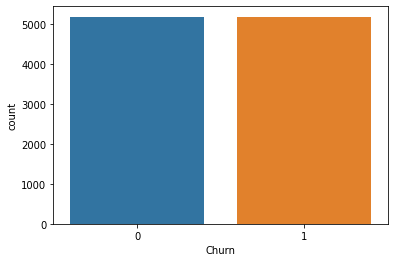

In [ ]:
sns.countplot(dados_virgems_balanceados.Churn)

Agora que temos nosso dataset no formato que queremos, podemos utilizar ele no algoritmo de Naive Bayes Multinomial. Vamos separar o dados em variávies explicativas e variável dependente. Lembrando que, vamos usar somente as variáveis explicativas categóricas, pois esse é um pré requisito do modelo Naive Bayes Multinomial:

In [ ]:
from sklearn.model_selection import train_test_split

SEED = 123
np.random.seed(SEED)

x_treino, x_teste, y_treino, y_teste = train_test_split(x, y, test_size = 0.3)
x_treino

,Maior65Anos,Conjuge,Dependentes,TelefoneFixo,VariasLinhasTelefonicas,ServicoDeInternet,SegurancaOnline,BackupOnline,SeguroNoDispositivo,SuporteTecnico,TVaCabo,StreamingDeFilmes,TipoDeContrato,PagamentoOnline,FormaDePagamento
4831,0,0,0,0,1,0,2,2,0,2,0,0,2,1,2
5077,0,1,1,1,0,2,1,1,1,1,1,1,0,0,2
9023,0,0,0,1,0,1,0,0,0,0,0,0,1,0,1
4424,0,0,1,0,1,0,0,0,0,0,0,0,1,0,1
5236,0,0,0,1,0,1,0,2,0,2,2,0,2,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9785,0,1,0,1,0,0,0,2,0,2,0,2,1,1,3
7763,0,0,0,0,1,0,0,2,0,0,2,2,1,1,1
5218,0,1,1,1,0,2,1,1,1,1,1,1,2,1,2
1346,0,1,1,1,2,1,0,0,2,0,0,2,1,1,1


In [ ]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score, confusion_matrix

modelo_MNB = MultinomialNB()
modelo_MNB.fit(x_treino, y_treino)
previcoes_MNB = modelo_MNB.predict(x_teste)

accuracy_score(y_teste,previcoes_MNB)

0.7046698872785829

Para o modelo Naive Bayes multinomial obtivemos nossa menor acurácia. Fazendo uma comparação com os demais modelos de classificação temos:

- Naive Bayes Multinomial : 70% Acurácia.
- Naive Bayes Bernoulli : 95% Acurácia.
- Naive Bayes Guassiano : 71% Acurácia.
- KNN : 82% Acurácia.

#Árvore de Descisão

##Pré Requisitos

As ávores de decisão é um dos modelos de ML mais antigos que existe! Ele foi muito usado nos anos 90 mas hoje em dia quase ninguém usa ele na prática, ou seja, nos dias atuais ele se limita mais a estudos acadêmicos, pois a lógica da árvore de decisão é utilizada em muitos outros algoritmo de ML.

Também são conhecidos como CART - Classification and regression Tress - ou seja, existem árvores de decisão que são feitas para a regressão, mas não iremos abordar elas neste notebook.

Não tem, ou seja ela:

- Aceita variáveis explicativas Qualitativas e Quantitativa.
  - Não precisam ter distribuição normal ou outra distribuição específica.
  - Aceita variáveis explicativas em diferentes escalas.
    - Ou seja, mão precismos aplicar padronização ou normalização sobre os dados.
  - Aceita outliers.
- Variável dependente Y Deve ser Categórica.
  - Existem uma versão da árvore de descisão em que ela é usada para problema de regressão, mas não veremos isso neste notebook.
- É o modelo de Machine Learning que é mais facíl de entender e de explicar para o publico leigo da área, pois a árvore de descisão se baseia no processo natural humano de tomada de descisão.

##Contrás


Como você verá, o algoritmo de Árvore de descisão é um dos algoritmos de ML mais censíveis a Overfiting! Se a Árvore de decisão for muito grande, ela passa a ter uma acurácia menor! Esse processo de regular a profundidade da ávore é conhecido como "Poda da árvore de descisão", e reservaremos um tópico somente para ele.

##Idéia intuitiva

Seja lá qual método formos usar para medir a puresa dos dados, o algoritmo de Árvore de descisão segue a mesma idéia, ele vai dividr em subgrupos os dados conforme as classes da variável dependente Y que queremos prever. A melhor forma de passar a idéia básica do algoritmo de Árvore de Descisão é com um exemplo:

Temos o seguinte datatset, onde as variáveis explicativas são:

- Consumo de cerveja --> Variável categórica, é nossa variável dependente que queremos prever por Árvore de Descisão.
  - São 3 classes de consumo:
    - Consumo Baixo.
    - Consumo Moderado.
    - Consumo Alto.
- Sol --> Variável explicativa quantitativa que nos informa o quão ensolarado está o dia.
- Vento --> Variável explicativa quantitativa que nos informa a velocidade do vento média no dia.

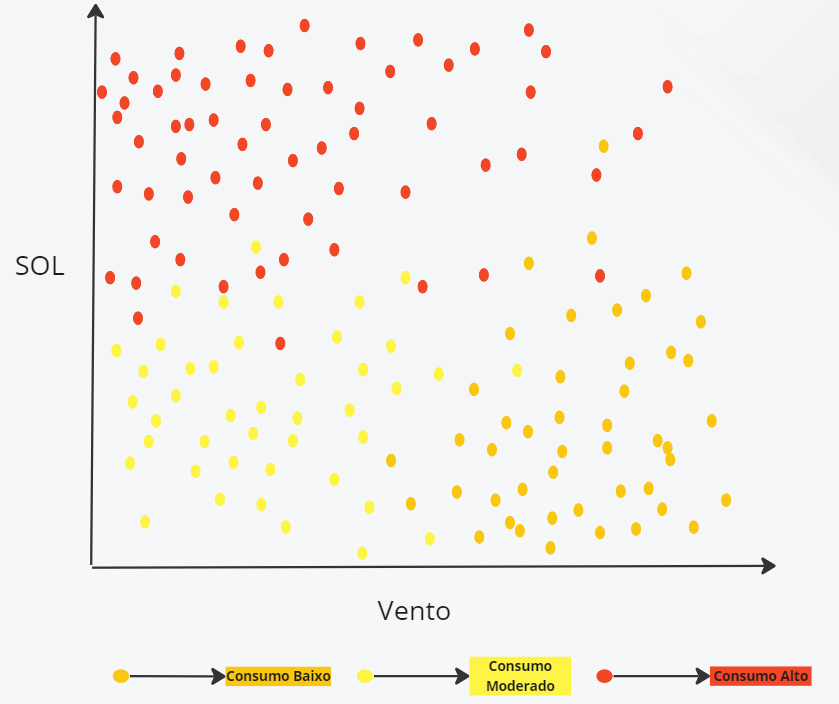

Vamos dividr a lógica de como montar uma Árvore de Descisão em passos:

- I Decobrir o nó raiz.
  - Isto é, vamos decidir qual variável explicativa vai ser o nó raiz da árvore.
- II Descobrir os filhos do nó Raiz/pai.
  - Isto é de novo, vamo ter que descobrir quais variáveis explicativas serão os filhos do nó pai/raiz.
  - Ademais, teremos que ver se o nó pai/raiz tera filho(s), ou se vai direto para a classificação (nó folha).

### I - Calculando Nó Raiz

O primeiro passo de toda árvore de descisão é descobrir qual das variáveis explicativas será a raiz da árvore de descisão.

Para isso deveremos fazer testes com todas as variáveis explicativas da seguinte maneira:

  - Vamos usar a variável explicativa como parâmetro de divisão do elementos do dataset.
    - Vamos analisar a homogenidade os subgrupos formados em relação as categorias da variável dependente Y.
  - A variável explicativa que melhor conseguir agrupar os elementos em subgrupos que tenham a maior a homogenidade possível será usada na raiz da árvore.

Testando a variável **VENTO**

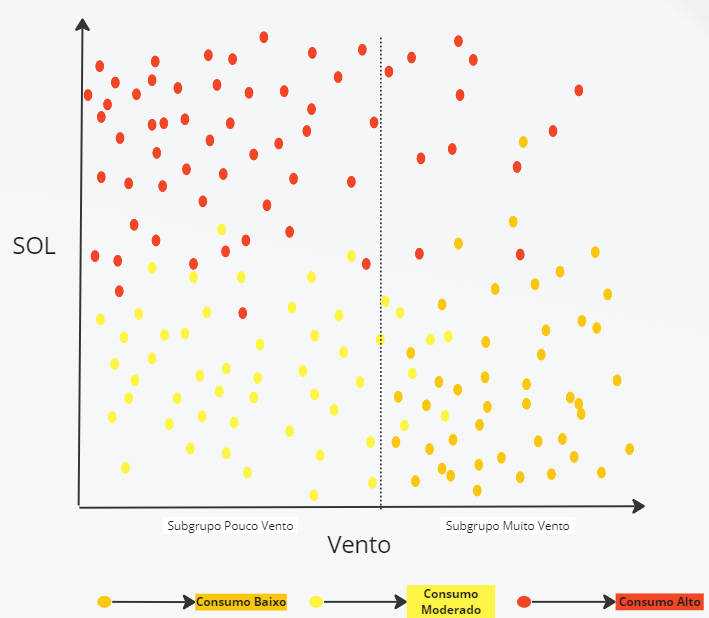

- Resultado do teste para a variável VENTO:
  - Ela dividiu os elementos do dataset em dois grupos que não são homogeneos.
  - Isto é, os grupos "Muito Vento" e o grupo "Pouco Vento" tem elementos de classes diferentes e em quantidade significativas.


Testando variável **SOL**

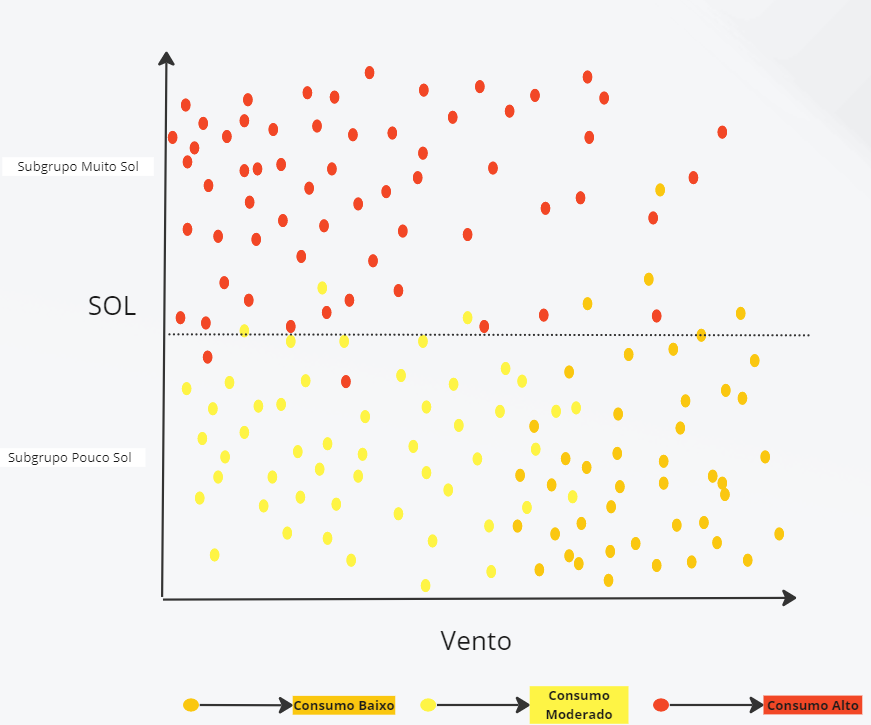

- Resultado do teste para a variável SOL:

- A a variável SOL conseguiu gerar subgrupos mais homogeneos. Veja que ele conseguiu criar um subgrupo "Muito Sol" que tem homogenidade/Pureza de quase 100%. Lógico que o outro grupo "Pouco Sol" não é 100% homogeneo, mas quando comparamos com os grupos criados pela variável VENTO, vemos que esse subgrupo obteve mais sucesso, ou seja, vamos usar a variável "Sol" como raiz da nossa árvore.



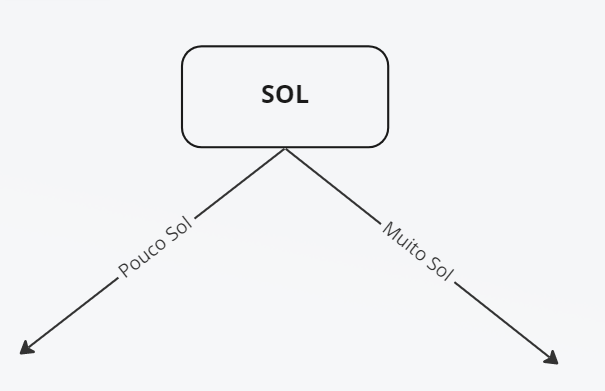

### II - Descobrir os filhos da raiz

O passo seguinte para motarmos o árvore de descisão é desbrir quais são as variáveis que serão usadas como filhos dessse nó pai.

- Lembrando que, não necessariamente os filhos devem ser outra variável, pois existe a possibilidade de que do nó pai já surga uma classificação final, ou seja, que do nó pai haja um nó folha (nó sem filhos).
  - Ainda devemos nos lebrar da possibilidade de que, do nó pai já não haja filhos, ou seja, de que não utilizaremos as variáveis explicativas restantes!
    - Isso é comum! Ocorre quando percebemos que os dois grupos feitos pelo nó pai jã são muito homogeneos! E que a aplicação de mais nó filho com uma das variáveis explicativas não agrega em nada para o aumento da homogenidade dos grupos que serão criados por esse filho.



Para o nosso caso, como apenas temos uma variável explicativa como candidata para ser o filho desse nó, vamos usar ela. Mas ainda resta apergunta.... em qual ramo esse filho com a variável VENTO vai ficar?

Para responder essa pergunta devemos fazer testes:

- Para cada ramo vamos ver a homogenidade dos grupos criados pela variável filho e fazer a comparação entre as homogenidades que o pai já havia alcançado com as do filho.
  - Caso o filho consiga uma homogenidade nos grupos por ele criado que a homogenidade do pai, usamos essa variável como filho.
  - Caso contrário, isto é, se os grupos criados pela variável filho tiverem homogenidade menor que o grupo que o pai fez, não usamos a variável filho naquele ramo.
- Se tivessemos mais variáveis explicativas teriamos que testar cada variável para ver qual dela cria novos grupos apartir dos grupos criados pelo pai, que de fato aumentassem a homogenidade.
- Caso, não exista nenhuma variável filho que aumente a homogenidade do grupo criado pelo pai, o ramo do pai vai direto para a classificação:

Em gráficos temos:




Testando a variável vento como nó filho no ramo MUITO SOL:

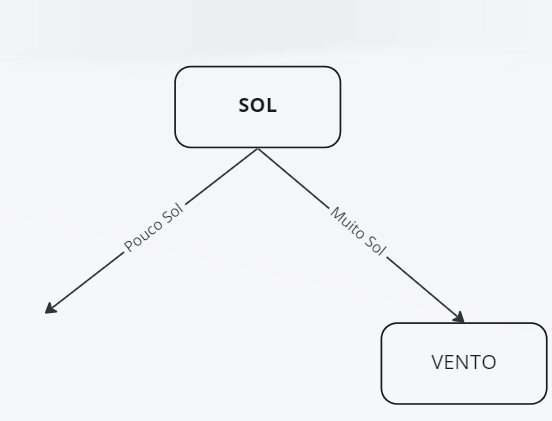

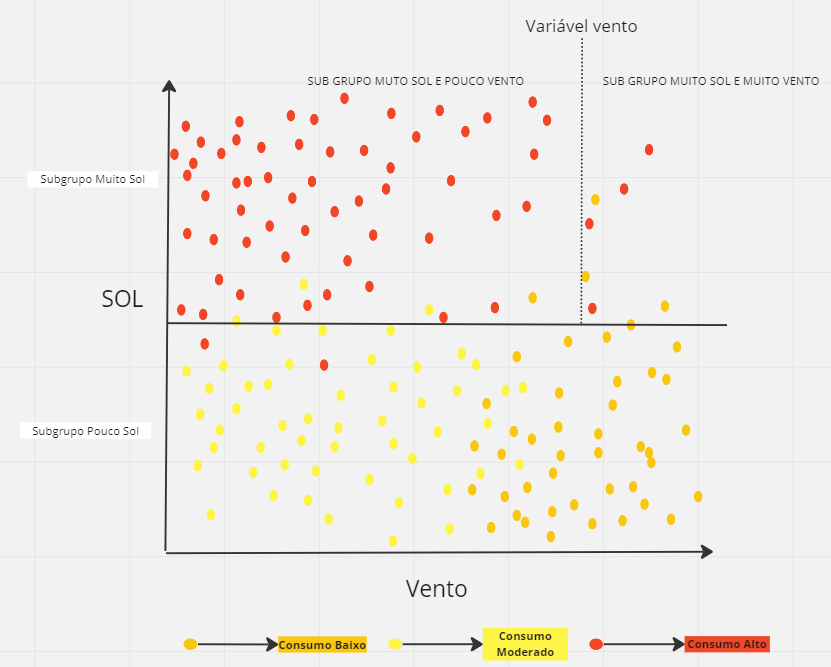

Percebemos que os sub grupos criados quando a variável VENTO é filho da variável SOL pelo ramo MUITO SOL tem as seguintes caracteristicas:

- Ele cria mais 2 subgrupos onde:
  - O sub grupo MUITO SOL E POUCO VENTO tem hmogenidade ainda maior que o grupo original criado pelo pai, ou seja, tem homogenidade maior que o grupo MUITO SOL.
  - O sub grupo MUITO SOL E MUITO VENTO tem homogenidade menor que o grupo criado pelo pai, ou seja, ele tem homogenidade menor que o grupo MUITO SOL.
    - Isso é ruim... isso seria um sinal para que testassemos outra variável (se existisse) como sendo filho do nó SOL no ramo MUTO SOL.


Ainda não podemos utilizar a variável VENTO como sendo nó filho do nó SOL no ramo MUITO SOL, pois ainda devemos calcular seu desempenho como sendo filho do mesmo mas no ramo POUCO SOL:

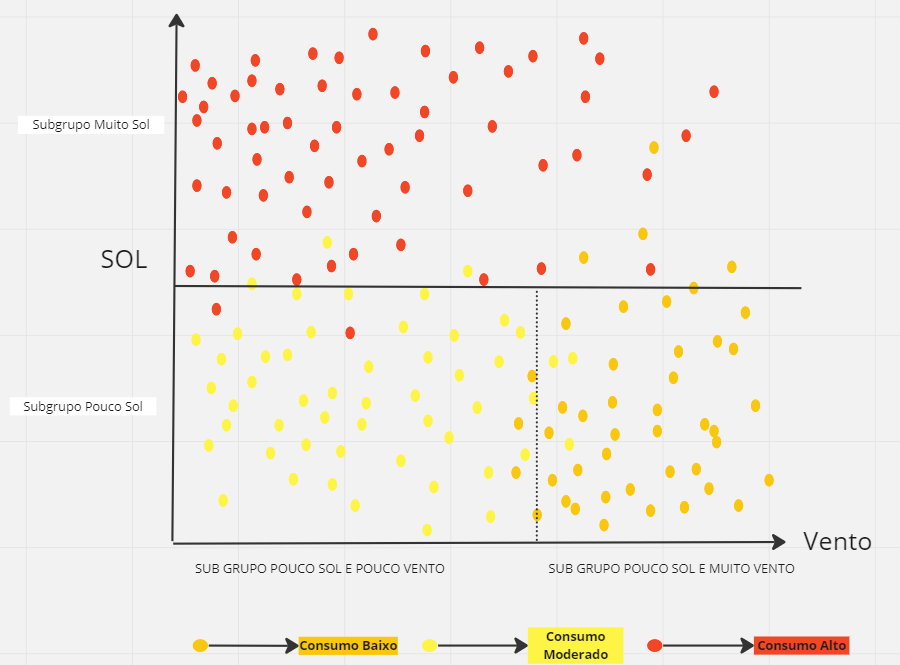

Percebemos que os sub grupos criados quando a variável VENTO é filho da variável SOL pelo ramo PUCO SOL tem as seguintes caracteristicas:

- Ele cria mais 2 subgrupos onde:
  - O sub grupo POUCO SOL E POUCO VENTO tem hmogenidade ainda maior que o grupo original criado pelo pai, ou seja, tem homogenidade maior que o grupo PUCO SOL.
  - O sub grupo POUCO SOL E MUITO VENTO tem hmogenidade ainda maior que o grupo original criado pelo pai, ou seja, tem homogenidade maior que o grupo PUCO SOL..
- Ou seja, podemos ver que, quando a variável VENTO é filho do nó SOL pelo ramo POUCO SOL, ele cria sub grupos que tem homogenidade maior que o grupo criado pelo pai.
  - É isso que o algoritmo árvode de descisão quer, ele quer que os filhos sejam selecionados de tal forma que, eles vão criar subgrupos em cima dos grupos que os nós pais fizeram que só aumentem a homogenidade dos grupos que o algoritmo está criando.

podemos concluir que a variável VENTO será usada sim, e será usada no ramo POUCO SOL. Ou seja nossa árvore ficara na seguinte maneira:

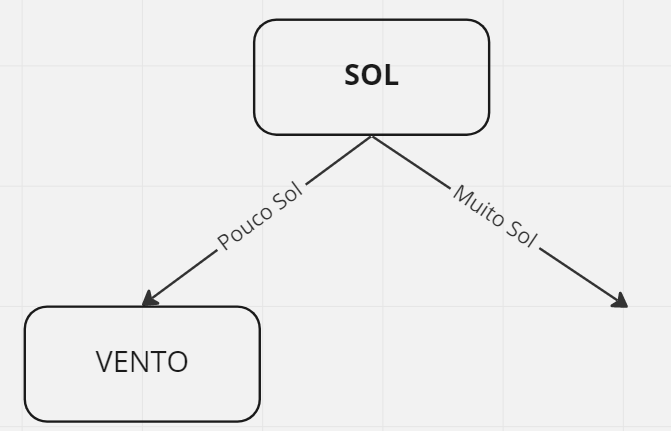

Lemnbrando que, se existissem mais variáveis explicativas, todas elas passariam por esse cilco de testes, ou seja, cada uma das variáveis explicativas seria testada em cada ramo do nó pai e selecinariamos aquela que atendesse os seguinte requisitos:

- Apresentou malhora na homogenidade dos grupos do nó pai.
- Apresentou a melhor melhora da homogenidade entre as variáveis explicativas canditadas.

Agora, como apenas temos uma variável explicativa e ela já foi usada como sendo filha do ramo POUCO SOL, o ramo MUITO SOL terá que ter uma classificação final. Lógica semelhamte será usada para os filhos do nó da variável VENTO, isto é, como nào temos mais variáveis explicativas para serem seus filhos, os filhos do nó vento serão classificações:

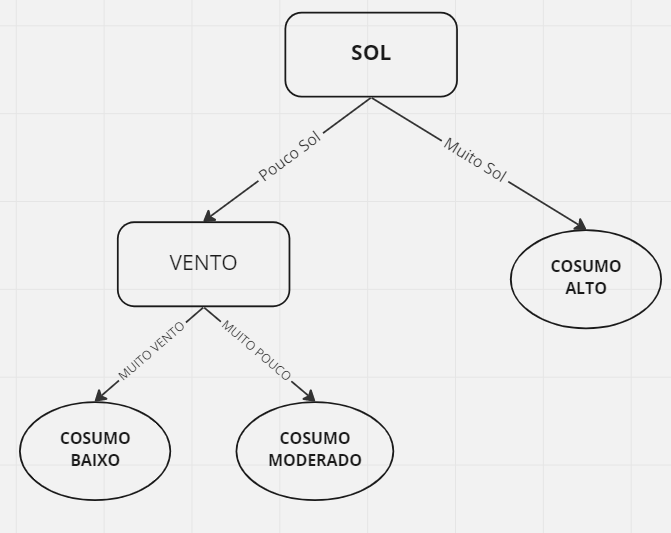

###RESUMO

Podemos resumir a ideia do algoritmo de árvore de descisão da seguinte forma:

- A árvore é montada de tal forma que, conforme formos descendo para os nós filhos, vamos criando sub grupos que são mais homogeneos quando comparados com os grupos dos nós pais.
- A árvore é montada de cima para baixo, ou seja, do nó raiz para o nó folha. Essa ordem de criação reflete quais variáveis explicativas tem maior poder de explicação dos elementos classificados, ou seja, dentro todas as variáveis explicativas o nó raiz tem aquela que melhor consegue explicar as classificações dos elementos da base de dados.
  - Existem várias formas de se medir esse grau de explicação, neste exemplo utilizamos o "olhometro", isto é, plotavamos os gráficos de dispersão dos elementos pintados conforme suas classificações e escolhiamos as variáveis explicativas que melhor separassem os dados em grupos homogeneos.
    - Mas na pratica não usamos o "olhometro". As principais tecnicas usadas nas árvores de descisão para a avaliação do poder dividir os elementos em grupos homogêneos das variáveis explicativas são:
      - Índice de GINI.
      - Grau de Entropia.

O que vamos ver a seguir é estudar como cada técnica é implementada para a costrução da árvore de descisão:




---



---



---



##Árvore de Descião Por Entropia - Teoria

Vamos usar como parâmetro o cáculo da Entropia para decidir qual variável explicativa tem maior poder de separação dos elementos em grupos mais homogêneos possíveis. Antes de ensinarmos a parte técnica de como fazemos o cálculo da Entropia, devemos saber interpretar ela.

- ***Entropia***
  - É um conceito que veio da física e é usada para medir o grua de desordem dos elementos presentes em um conjunto.
    - Ou seja, quanto maior for o valor da Entropia de um conjunto de elementos maior será a desordem de elementos dentro do mesmo.
      - Desordem aqui, significa o número de elementos que são de classes diferentes.
      - Ou seja, conjuntos 100% homogêneos (so tem elementos da mesma classe) tem Entropia = 0.

O que vamos fazer na árvore de decisão feito pela Entropia, é calcular a Entropia de cada variável explicativa
...

A melhor forma de entender como se constroi do zero um árvore de decisão usando a entropia das variáveis explicativas nada melhor que o exemplo. Para este exemplo usaremos uma base de dados onde analisamos caracteristicas financeiras de clientes para classificar o risco de crédito (risco de dar calote):


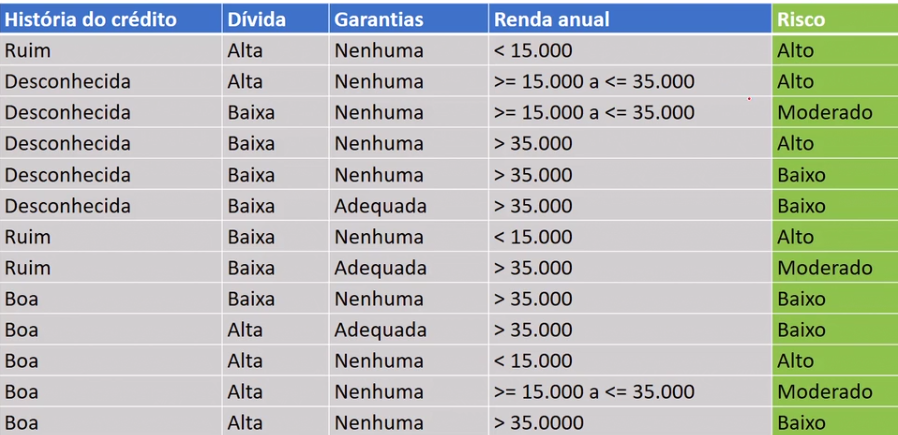

Um ponto importante a ser levantando é que, esta base de dados usada como exemplo, todas as variáveis expicativas são do tipo categórica mas isso não é obrigatório, pois como haviamos comentado no inicio, as árvores de decisão não tem pré requisitos, isso inclui aceitar qualquer tipo de variável explicativa.

Aliás, a variável "Renda Anual" era do tipo quantitativa, o que ocorre em todo algoritmo de árvore de descisão é que ele categoriza todas as variáveis quantitativas em categorias! Para assim depois poder aplicar o algoritmo que vamos ver a seguir":

### Entendendo as fórmulas de Entropia e Ganho de informação

Antes de iniciarmos os cálculos entender as formulas que vamos usar, começando com o fórmula para o cálculo da Entropia de uma variável explicativa:

####Cálculo da Entropia

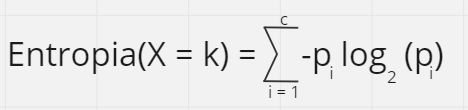

Onde:
- "X = k" --> É uma variável explicativa tendo como categoria K.
- C --> É o número de classes que a variável dependente Y tem dentro de sí.
  - Veja que, não estamos falando do número de categorias que a variável dependente X tem, mas assim do número de categorias que a variável target Y tem!
- Pi --> É a probabilidade de que a classe i (da variável Y) sabendo que a classe da variável k da variável X ocorreu.

Benévolo, é de suma importância que fique claro as seguintes carcatristicas sobre o cálculo da Entropia:
- I a Entropia de uma variável explicativa X sempre será calculada em relação a variável dependente Y!
- Uma variável explicativa X tem Q Entropias em relação a variável Y.
  - Onde Q é o número categorias dentro da variável X.

Vamos aos cálculos para ficar mais claro:

- I - Cálculo das Entropias entre as variáveis "Histórico de Crédito":

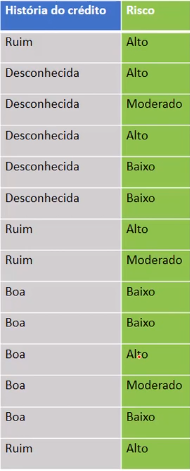

- I.I - Como foi comentado, uma variável explicativa X tem várias entropias, cada uma para cada categoria que ela tem dentro de sí. No nosso exemplo a varável "Histórico de Crédito" tem 3 categorias, logo temos 3 entropias:
  - 1 - Entropia (Hist.Cred = Boa).
  - 2 - Entropia (Hist.Cred = Ruim).
  - 3 - Entropia (Hist.Cred = Desconhecida).
    - Isto é, o primeiro passo é calcular as probabilidades Bayesianas Pi entre as variáveis "Hist. de Crédito" e "Risco" para cada umas das 3 Entropias apresentadas acima:
      - 1.1 - Entropia (Hist.Cred = Boa):
        - P(Risco = Alto| Hist.Cred = boa)
        - P(Risco = Moderado| Hist.Cred = boa)
        - P(Risco = Baixo| Hist.Cred = boa)
      - 2.1 - Entropia (Hist.Cred = Ruim):
        - P(Risco = Alto| Hist.Cred = ruim)
        - P(Risco = Moderado| Hist.Cred = ruim)
        - P(Risco = Baixo| Hist.Cred = ruim)
      - 3.1 - Entropia (Hist.Cred = Desconhecida):
        - P(Risco = Alto| Hist.Cred = desconhecida)
        - P(Risco = Moderado| Hist.Cred = desconhecida)
        - P(Risco = Baixo| Hist.Cred = Desconhecida)
    - Veja que se tratam de probabilidades bayesianas, logo a forma mais clara e organizarda de se fazer isso é com uma árvore de probabildades:




> 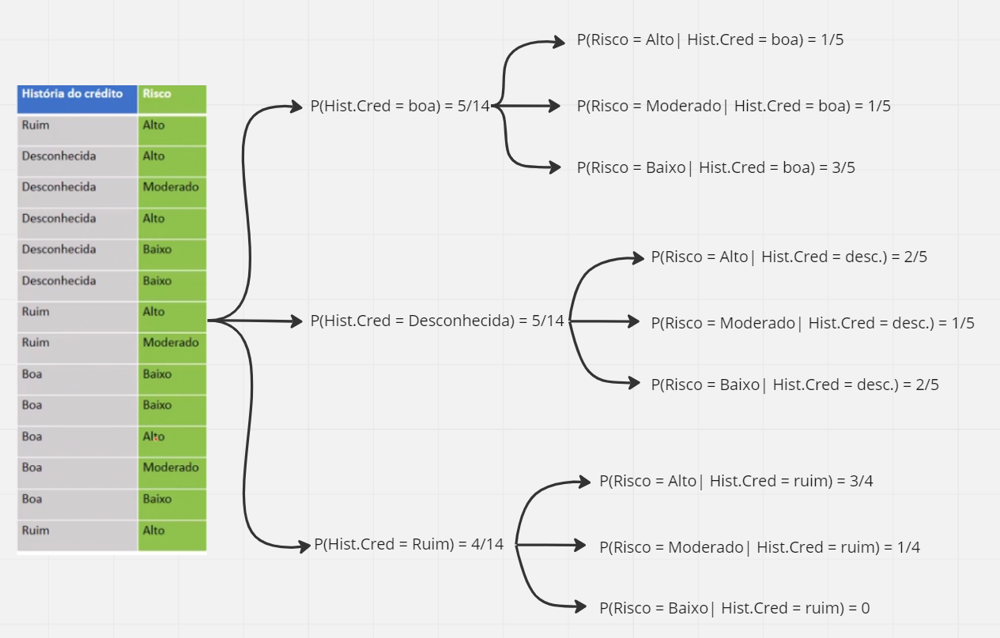





> - Acabamos de realizar a parte mais trabalhosa do cálculo da Entropia... Com as probabilidades Baysianas em mãos, podemos seguir para a aplicalção da formula para cada uma das Entropias:   
  - 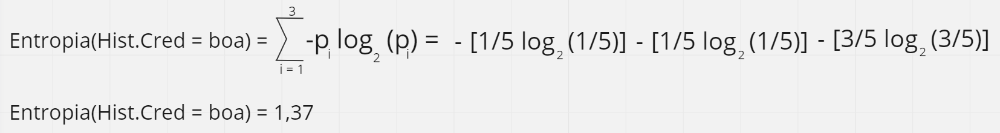
  - 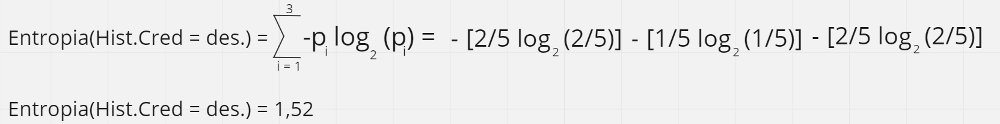
  -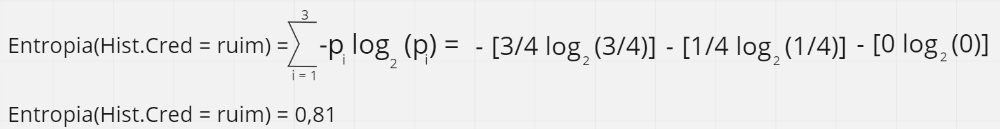





> - Uma forma muito didática de se representar os cálculos das Entropias de uma variável explicativa em relação a sua variável dependente/target Y é pelo pelo seguinte diagrama:





> 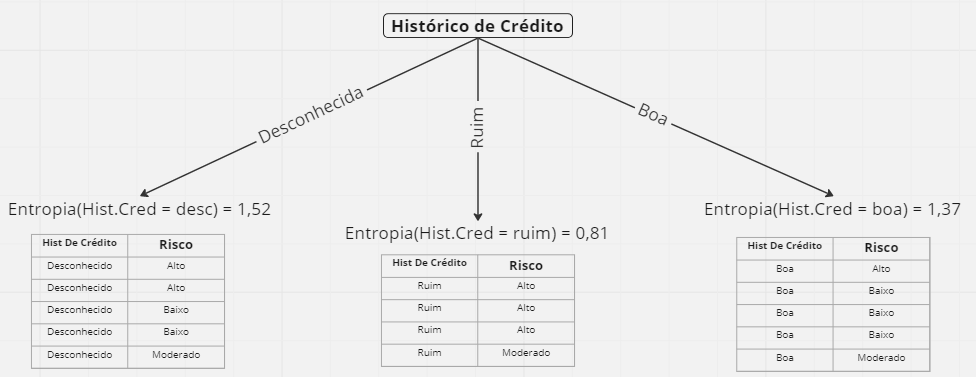





> - Nela conseguimos perceber claramente que:
  - As Entropias mais altas estão relacionadas a subgrupos menos homogêneos.
    - Percebemos isso na Entropia(hist.cred = dec), que apresenta ao mesmo o maior valor da Entropia e a menor homogenidade do subgrupo que criou.
    - Seguindo a mesma lógica, a Entropia(hist.cred = ruim) apresenta a maior homogenidade no seu subgrupo, logo como vemos, ele apresenta o menor valor para a Entropia.
    - Lembrando que, quando Entropia = 0, isso significa que o grupo analisado é 100% homogêneo, ou seja, os elementos dentro do grupo são do mesmo tipo/classe.




A próxima formula que vamos usar para montar a árvore de decisão é a formula do Ganho de Informação! Essa formula resume as entropias cálculadas para uma variável explicativa em um único número. Sendo mais pragmático, é uma comparação entre a variável target/dependente Y e uma variável explicativa. A interpretação dela se dá como sugere o nome:

- Ganho de Informação:
  - Quanto maior o valor do Ganho de informação entre uma variável explciativa e a variável target/dependente Y, isso significa que melhor será os sub grupos criados por essa variável. Ou seja, quanto maior o valor do Ganho de informação entre a variável explicativa X e a variável dependente Y mais homogêneos serão os grupos criados por aquela variável explicativa.
  - Fórmula:



> 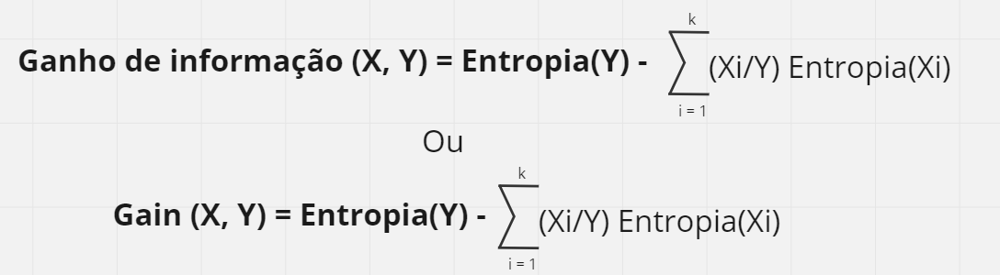





> - Onde:
  - Entropia(Xi) --> É a Entripia da variável explicativa X quando assume a categoria i (uma das suas categarias internas). Note que estamos falando das categorias da variável explicativa X e não das categorias do target Y.
  - K --> É a quantidade total de categorias  dentro da variável explicativa X.
  - Entropial (Y) --> É um caso especial de entropia, pois aqui quebramos a regra que haviamos postulado de que: "A Entropia de uma vairiável é sempre um cálculo que leva em consideração a variável target Y".
    - Ora, veja que estamos calculando a Entropia que é a prórpia target! Por esse motivo o seu cálculo é diferente... Já vamos aboradar seu cálculo.
    - Na fórmula de Ganho de informação Entropia(Y) é uma constante.

Assim como fizemos para entender a fórmula da Entropia, a melhor forma de entender como a fórmula do Ganho de informação funciona é com um exemplo. Vamos calcular o Ganho de informação entre a variável História de Crédito e o target Risco:




- **Cáculo Ganho de Informação**
  - Primeira coisa que devemos fazer é o cáculo da Entropia(Y):
    - Aqui aplicamos a mesma formula que háviamos aplicado quando estavamos cálculando a Entropia de uma variável explicativa. A grande diferença estão nas probabilidades, que antes era probabilidades baysianas, agora por estarmos manipulando a própria variável target serão porbabilidades simples, logo:



> - 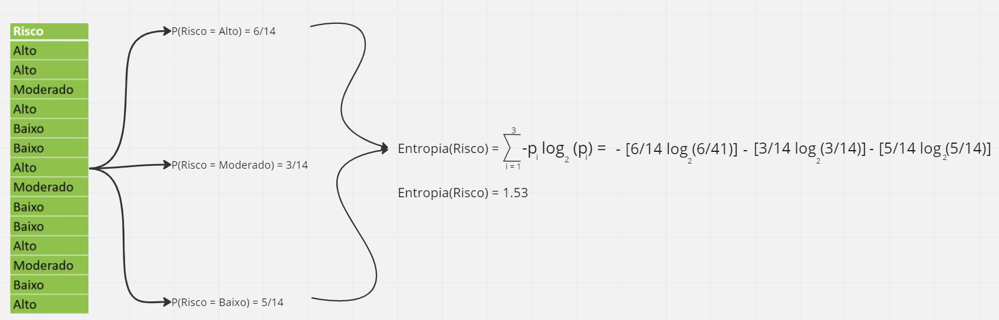





> - Devemos guardar bem este número Entropia(Y) = 1.53 pois vamos usar ele até o fim da montagem da árvore.
- O próximo passo é cálcular o somatório do produto entre as Entropias da variável Hist. Creédito com seu respectivo peso em relação a variável target (Ou melhor dizendo, multiplicado pela sua respectiva probabilidade simples de cada categoria da variável esplicativa).
  - Vejamos em diagrama:





> - 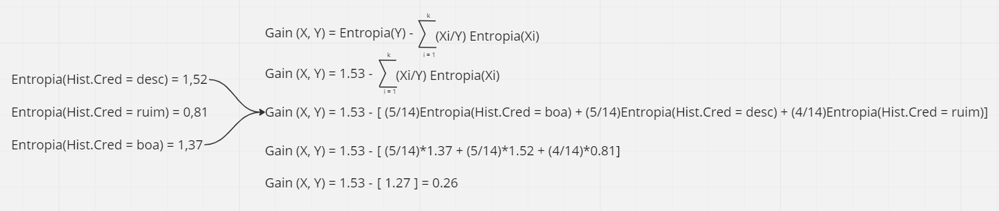





> - Interpretação do Ganho de informação:
    - Quanto maior for o número melhor do Ganho de Informação entre uma variável explicativa e seu target, isso quer dizer que mais/melhor homogêneos serão os grupos formados por ele.
  

---



---





##Construindo a Árvore de Decisão - Teoria

Agora que já sabemos usar as formulas de Entropia e de Ganho de informação, vamos usar elas para contruir nossa árvore de decisão da seguinte forma.



####Construindo o nó raiz

A variável explicativa que vai ser utilizada no nó raiz será aquela que retornar o maior valor da Ganho de Informação entre ela e a variável target, que neste exemplo é a variável Risco. Ou seja, vamos ter que fazer o cálulo do Ganho de informação de todas as variáveis explicativas e o target Risco, e vamos comparar elas e selecionar a que retornar o maior ganho de informação. Ou seja benévolo, estou dizendo que tremos que repetir todos os cálculos feitos no tópico anterior onde aprendiamos a manipular e interpretar as formulas, em cada uma das 4 variáveis explicativas! Sorte nossa que essa árvore tem apenas 4 variáveis explicativas, pois em problemas normais é comun que seja 8 ou 9 variáveis independentes... Aqui percebemos o porque essas estruturas de árvore de decisão se popularizaram após os anos 80! Pois fazer isso a mão levava muito tempo...

  Vamos dividir essa grande quantidade de cálculos em etapas:

- Ganho de Informação da variável Histórico de credito:
  - Já calculamos:
    - Gain(His.Cred, Risco) = 0.26

- Ganho de Informação da variável dívida:



> - 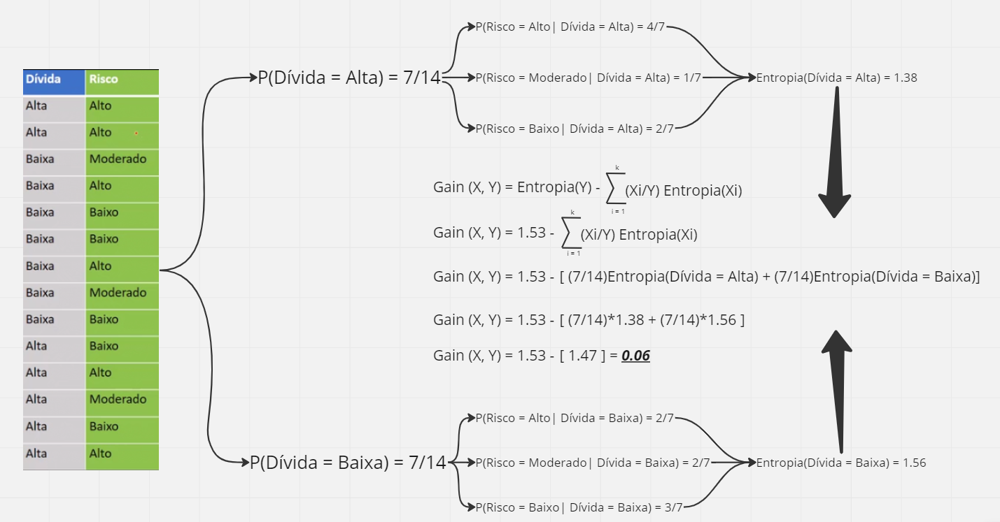



- Ganho de Informação da variável Garantias:



> - 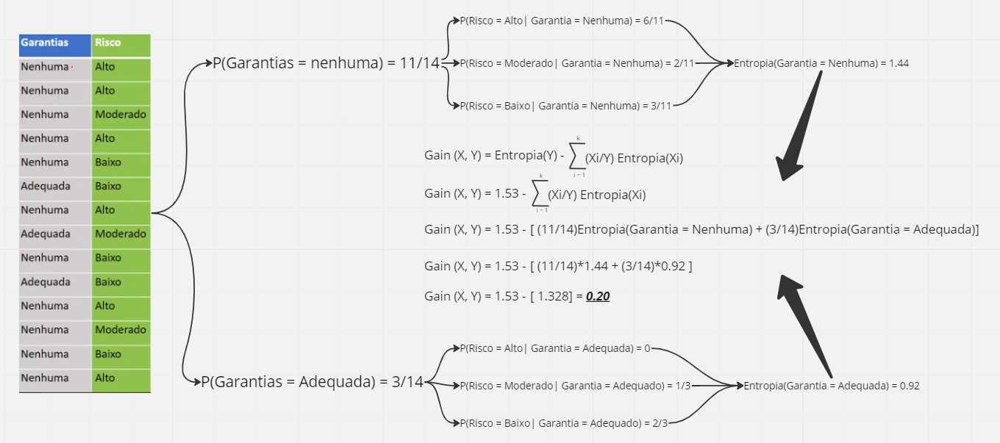



- Ganho de Informação da variável Renda Anual:



> - 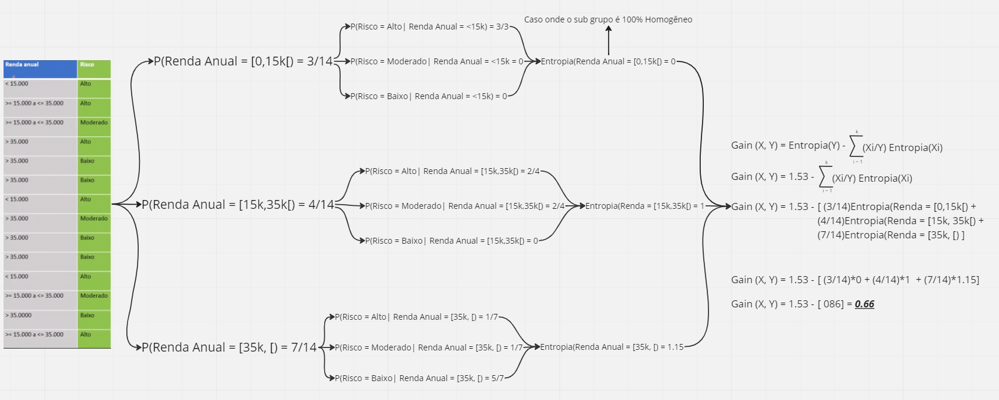



Comparando os ganhos de informação:

- Gain(His.Cred, Risco) = 0.26
- Gain(Dívida, Risco) = 0.06
- Gain(Garantias, Risco) = 0.20
- Gain(Renda Anual, Risco) = 0.66
  - Ou seja, a variável explicativa selecionada para ser a variável no nó raiz será a variável Renda Anual.

Desenhando a árvore que temos até agora:

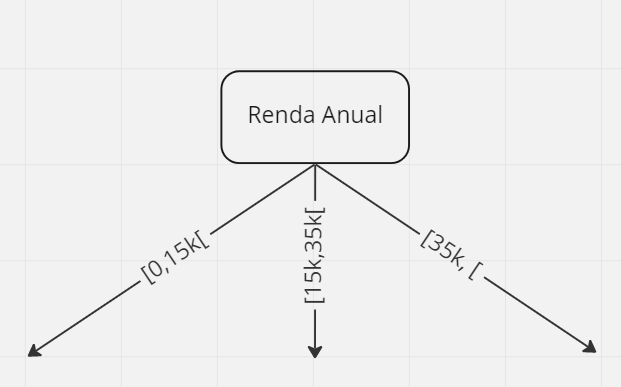



---



---



####Construindo Os Demais Nós Filhos

Vendo a imagem anterior, fica a grande perguntar... Quais vão ser os filhos do nó Renda Anual... Melhor dizendo, nem sabemos se a nó Renda Anual terá filhos... Como vamos sair desse empasse?

Antes de entrarmos de vez nos cálculos devemos fazer pré definições da nossa árvore de decisão:

- Ela não tera parâmetro de parada.
  - Ou seja, ele vai continuar a aumentar a altura da árvore e somente vai para quando:
    - Se depare com sub grupos com homogenidade 100%
    - Nenhum das variáveis explicativas candidatas a serem o nó filho, nos devolveram pelo menos 1 grupo 100% homogêneo.  
      - Neste caso, vamos direto para a classificação, e ele vai assumir a classificação com a maior quantidade.

O que vamos fazer é aplicar exatamente a mesma lógica de passos que aplicamos quando estavamos descobrindo quem seria a variável no nó raiz, a grande diferença é a base que vamos usar para refazer os passos que já fizemos!

Veja:

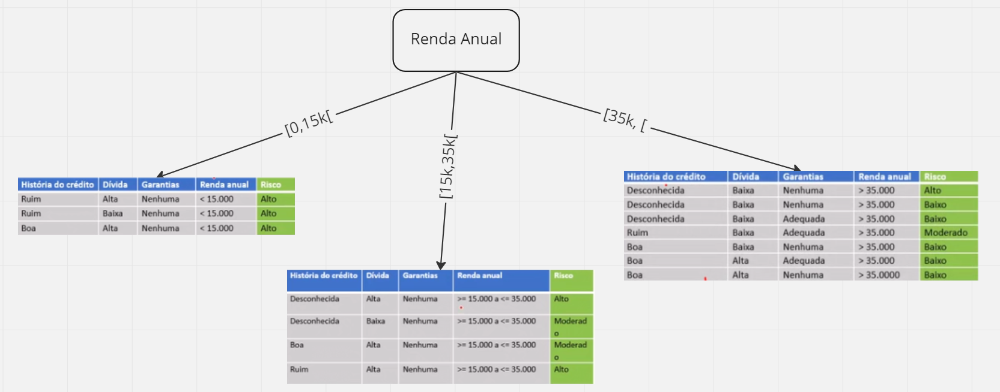

A dinamica para saber quem será o filho em cada ramo será a seguinte:

- Para cada ramo:
  - Calcular o Ganho de Informação das variáveis explicativas restantes.
    - Lembrando de usar a tabela filtrada/reduzida para os cálculos das probabilidades baysianas.
  - A variável explicativa que tiver maior Ganho de Informação neste ramo será o nó filho nesse ramo.

- Vamos cálcular quem será o filho no ramo <15K:
    - Veja que, este grupo é 100% homogêneo! Ou seja, neste caso podemos dizer que nesse ramo o nó raiz/pai não terá filhos e já vai direto para a classificação:



> - 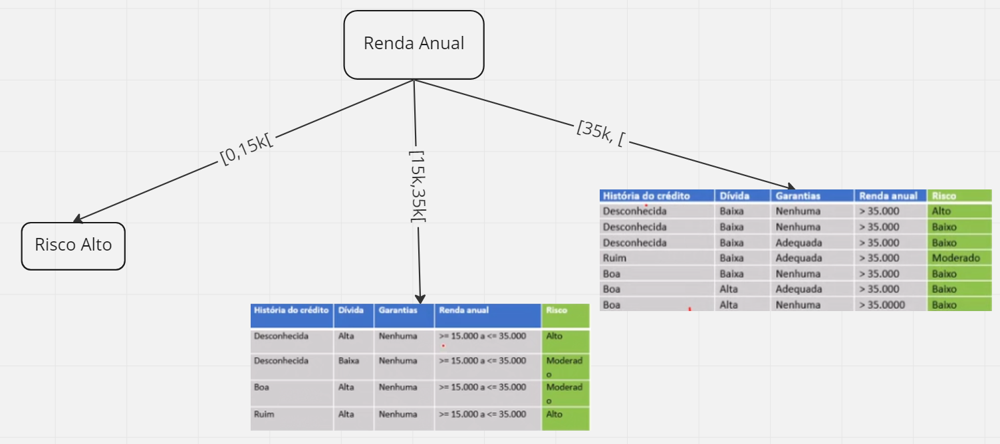



- Calculando o filho no ramo >= 15k e 30k <:
  - Neste caso, como o grupo não é 100% homogêneo, teremos que refazer os cálculos que já haviamos feito na etapa de encontrar a raiz.
    - Mas agora, vamos levar em consideração a tabela/sub grupo filtrado por essa ramificação.
    - Cáculando a Entropia geral para a nova tabela:



> - 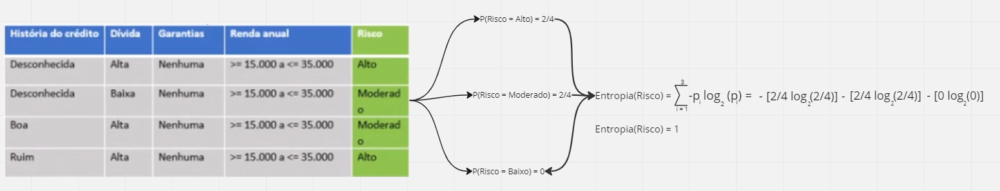





> - Calculando o Ganho de informação para cada variável explicativa restante:
  - Ganho de Informação com a variável Garantias:





> - 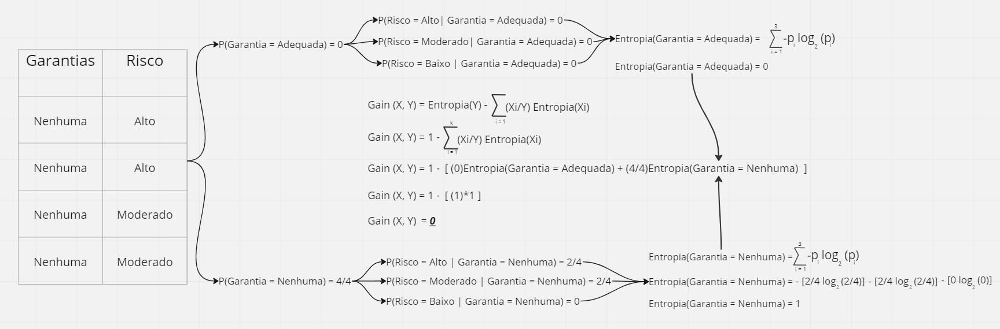





> - Calculando o Ganho de Informação com a variável Dívida:





> - 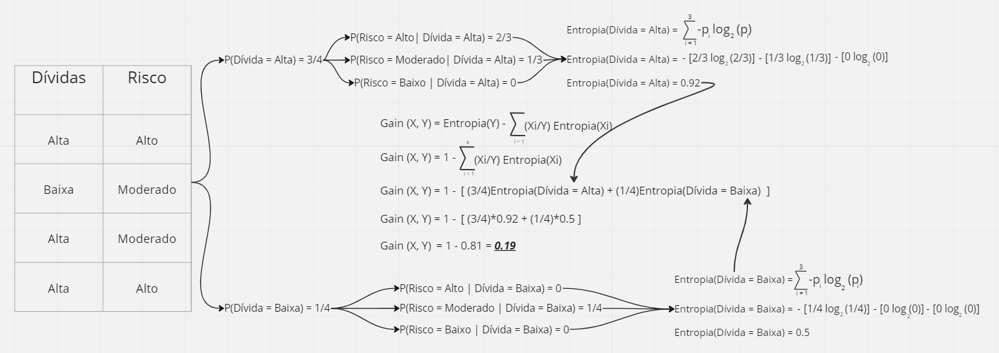





> - Ganho de Informação com a variável Histórico de Crédito:





> - 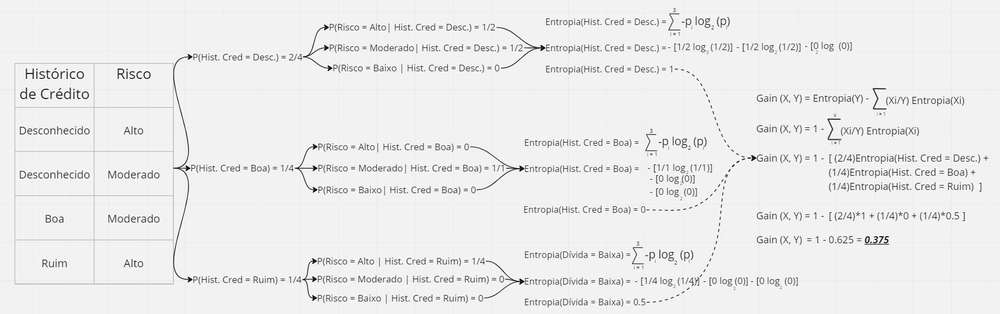



Ou Seja, aqui vemos que para o ramo [15k, 35k[ o variável que nos retorna o maior ganho de informação é a variável Histórico de Crédito, com um Ganho de Informação de 0.65. Logo usaremos ela como nó filho no ramo [15k, 35k[, e nossa árvore ficaria com o seguintes aspecto:

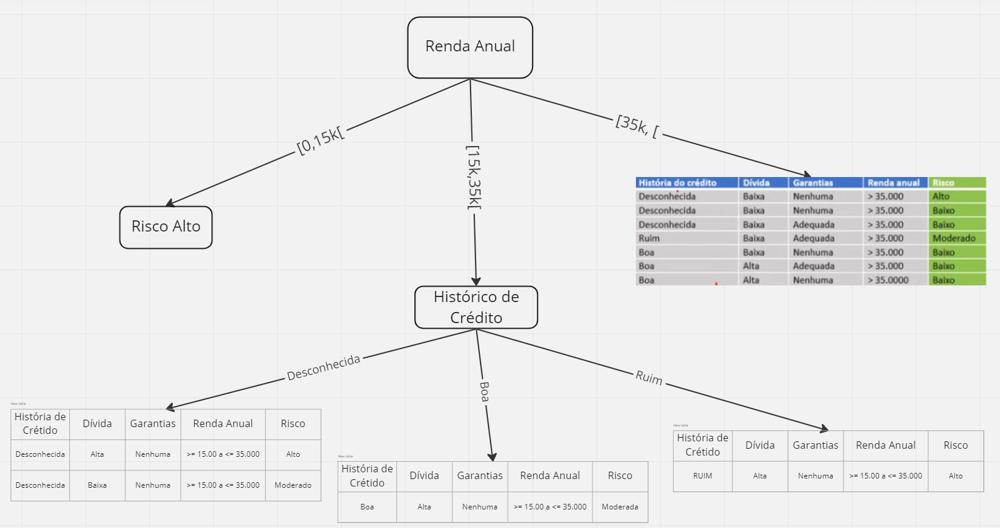

Benévolo, veja que os subgrupos criados pelos ramos "Hist. de Cred = boa" e "Hist. de Cred = ruim" são 100% homogêneos, logo para estes dois ramos podemos ir direto para classificação:

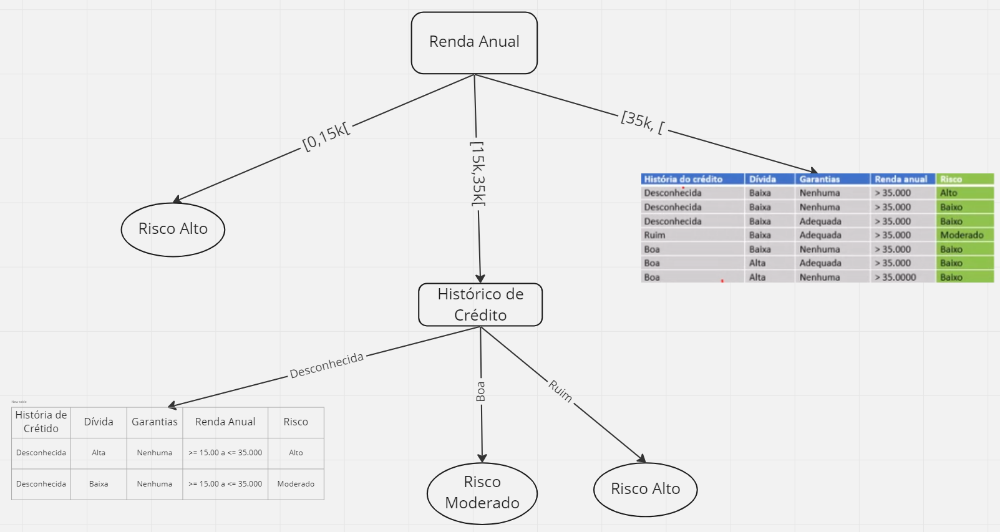

Vamos continuar no mesmo ramo e vamos qual será a variável que será o nó filho do nó Histórico de Renda no ramo "Desconhecido". Benévolo, eu vou fazer os cálculos de praxe que já fizemos nos passos anteriores, mas se você prestar atenção na tabela que nos resta nessa ramificação fica claro que a variável explicativa "Dívida" é a única que pode ser utilizada como variável no nó filho, pois:

- Não podemos utilizar as variáveis que estão em nós antepasados diretos.
  - Ou seja, não podemos usar a variável que está no nó pai, a variável histórico de crédito, e também não podemos utilizar a variável que está no nó avô, a variável Renda Anual.
  - Logo, nos restam apenas as variáveis Garantias e Dívida.
    - A variávei Garantia não pode ser utilizada, pois ela já está 100% homogêneo, logo não trá nenhum ganho de informação para a variável target - Risco -.
    - A variável Dívida, além de ser única restante (lembrando que isso não garante que ela será excolhida, pois existem a possibilidade nessa ramo não haver nunhum filho) ela consegue dividir em sub grupos 100% homogênoes os dados!

Mas como este é um notebook explicativo, vamos ser rigorosos e metódicos e vamos continuar aplicando as formulas como havímos feitos nos passos anteriores. Ou seja o que vamos fazer é:

- Recalcular o Entropia Geral da nova tabela.
  - Ou seja, cálcular a Entropia da variável Y - Risco, na nova tabela:



> - 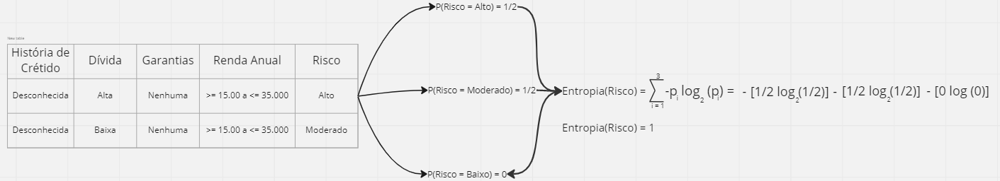



- Cálcular a Entropia de cada variável explicativa candidata a ser filho nesse ramo.
- Calcular o Ganho de Informação de cada variável explicativa candidata a ser filho nesse ramo:



> - 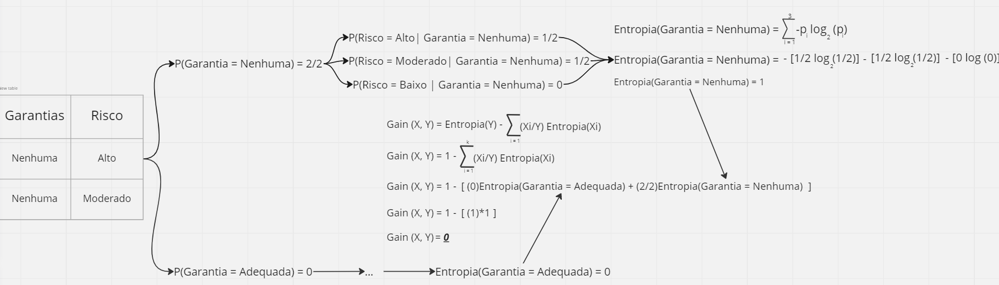





> - 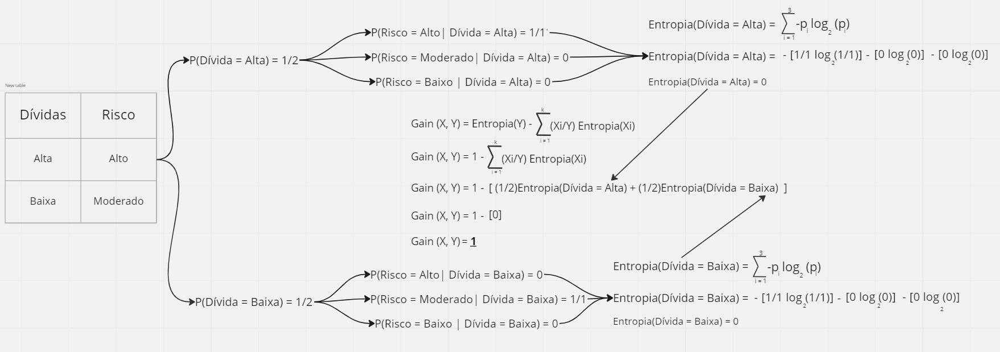



- Aqui vemos que a variável que nos dá o maior Ganho de Informação é a variável Dívida, logo ela será o filho do nó Histórico de Renda no ramo 'Desconhecido':

- 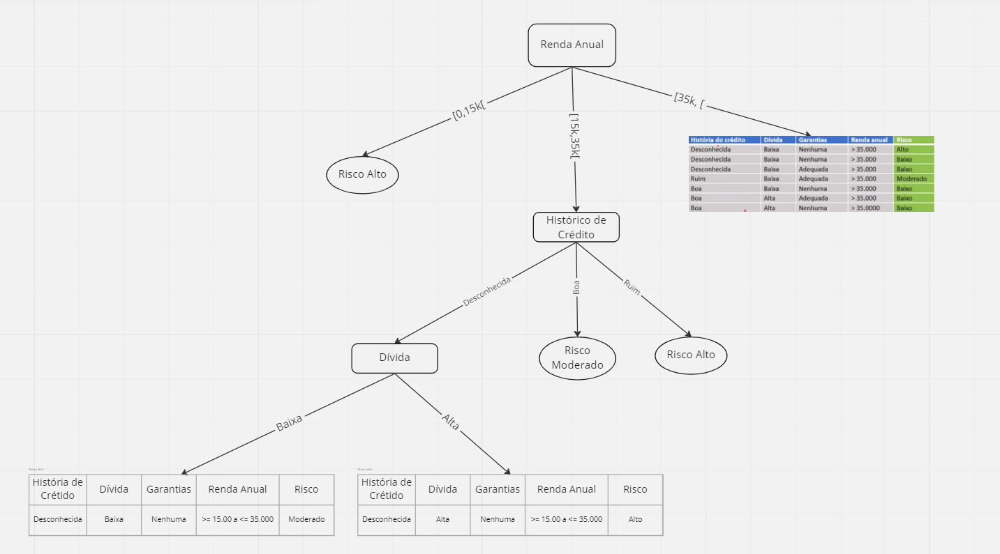

Como os subgruops criados são 100% homogêneos em relação a variável target, podemos ir direto para a classificação:

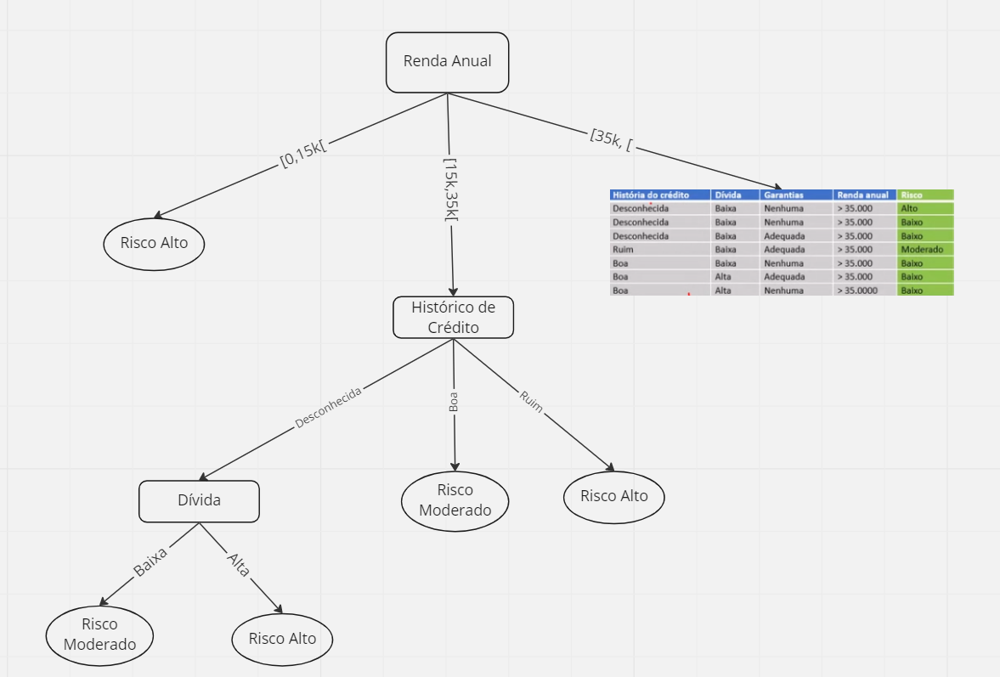

Pronto... Não há mais trabalho para fazer neste ramo, então voltemos para o nó raiz no ramo [35k, [ e vamos cálcular quem será a variável que será o nó filho dele.

Lembrando que:

- As variáveis explicativas disponiveis para serem filhos do nó raiz Renda Anual são todas as que ainda não forom usadas na linhagem direta dele, ou seja, não podemos usar as variáveis que estão no nó pai, avô, bisavô....:
  - Ou seja podemos usar:
    - Histórico de Crédito.
      - Sim... Podemos usar a variável que já esta sendo usada no nó irmão! Ou seja, o nó pai pode ter filhos gémeos!
    - Dívida.
    - Garantia.
- Vamos calcular o Ganho de Informação para cada vaiável candidata a ser filho nesse ramo:
  - I - Cálculando a Entropia Geral da tabela, ou seja, a Entropia da variável target nessa tabela:



> - 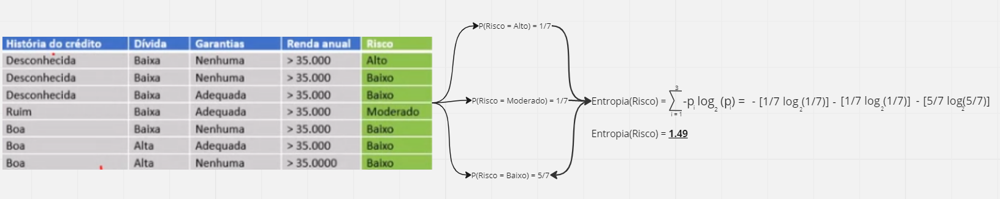





> - Calculando o Ganho de informação de cada variável explicativa candidata:




> - 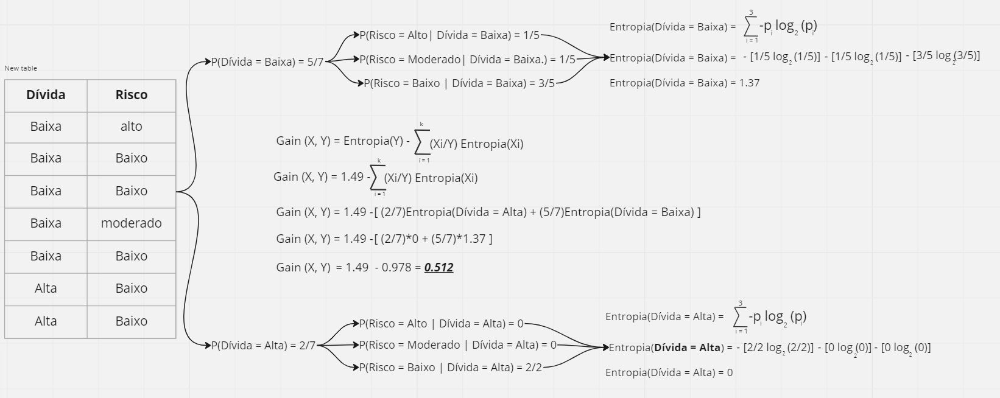





> - 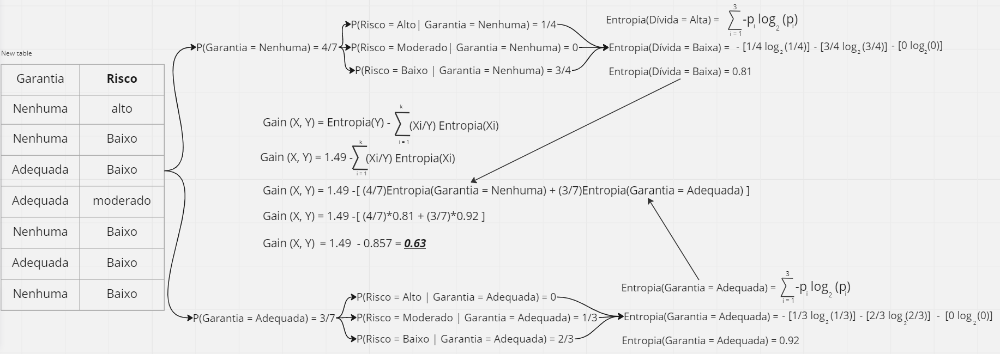





> - 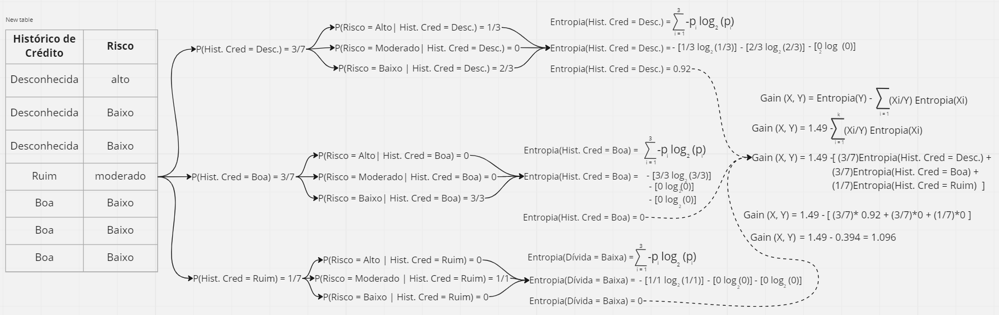



Comparando os Ganhos de Informação vemos que a variável explicativa "Hisórico de Crédito" nos devolveu o maior Ganho de informação, logo usaramos ele com nó filho no ramo [35k[.

Benévolo, note que estamos utilizando a mesma variável que já está sendo usada no nó irmão!! Isso é possível, o que não é possível é a utilização de uma variável que já seja antepassado na árvore daquele nó que estamos estudando!

Nossa nova árvore de decisão fica da seguinte forma:

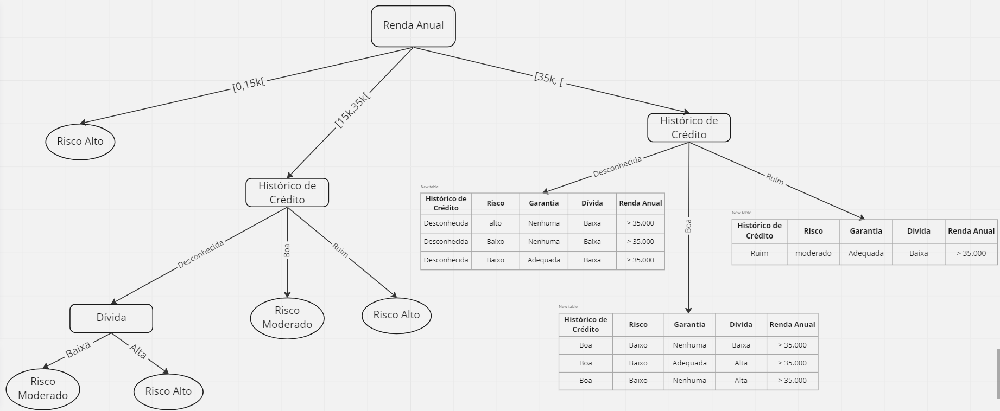

Podemos ver que os sub grupos gerados pelos ramos Ruim e Boa sáo 100% homogêneos, logo podemos ir direto para a classificação:

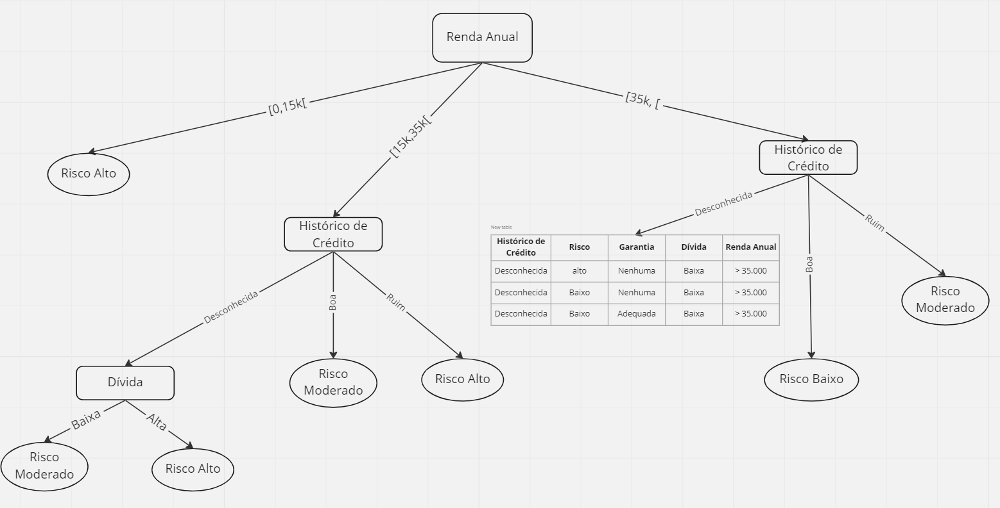

O próximo passo seria descobrir quais das variáveis explicativas disponiveis será o nó filho no ramo "Desconhcido". Benévolo perceba que chegamos numa condição de parada da nossa árvore!

A primeira condição era que paramos de aprofundar o ramo é quando os sub grupos gerados tenham homogenidade de 100%. Neste caso, nem a variável Dívida quanto Garantia vão conseguir criar pelo menos 1 sub grupo com 100% de homogenidade! O que vamos fazer é devolver a classificação que estiver em maior frequência dentro da tabela restante, que no caso é a classificação "Risco = Baixo"

Lembrando que, este critério de parada é o autor da árvore de decisão que define! Ou seja, fomos nós definimos.

Desenhando nossa árvore de decisão final:

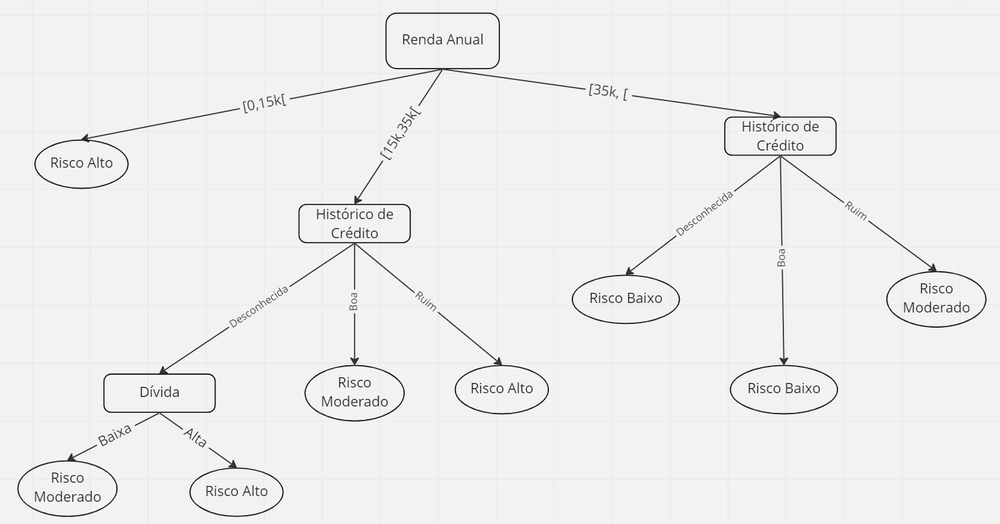



---



---



##Contrás e Pontos de Atenção

Como já foi comentado no inicio do tópico de árvores de decisão, o critério de parada de crescimento da árvore é dada pelo usuário. De forma geral, os critérios mais utilizados são os seguintes:

- 1 - O usuário define como critério de poda a altura máxima da árvore.
  - Ou seja, o usuário passa como parâmetro da função a altura/profundide máxima que a árvore pode assumir.
    - Veja que, pode ser que a árvore de fato nunca atinga essa altura e o que vai definir se ela vai ter continuar tendo filhos são as homogenidades 100% serem atigidas ou não, como ocorreu no nosso exemplo, onde nos deparamos em um ramo onde nenhuma variável criava subgrupos 100% homogêneos.
  - Por padrão, a biblioteca sklearn não assume limite de crescimento, logo a árvore continua a crescer de forma muito semelhante a que fizemos no exmeplo.
    - Mas existem sim, um parâmetro dentro do sklearn que coloca limite de crescimento.

- 2 - O usuário define como critério de poda o número máximo de nó folhas da árvore.
  - Ou seja, a árvore para de se expandir se um determinado número de nós folhas forem atingidos.
  - Este tipo de critério de poda tem forte correlação positiva com a altura da árvoe, pois obviamente, a maioria das árvores que tem altura/profundidade grande também tem um grande número de nós folhas.
- 3 - O usuário define (passando como parâmetro) como critério de Poda (não aprofundar ramos) é um nível mínimo de Homogenidade aceita.
    - Por exemplo, se eu passo como parâmetro de poda, que estou aceitando uma homogenidade de 70%, isso quer dizer que, se nossa árvore se deparar um ramo que nos entregue 70% ou mais de homogênidade, esse ramo para de crescer (não gera um nó filho naquele ramo) e já vai direto para a classificação que estiver em maior frequência dentro do sub grupo.
      - Por exemplo:
  



> - 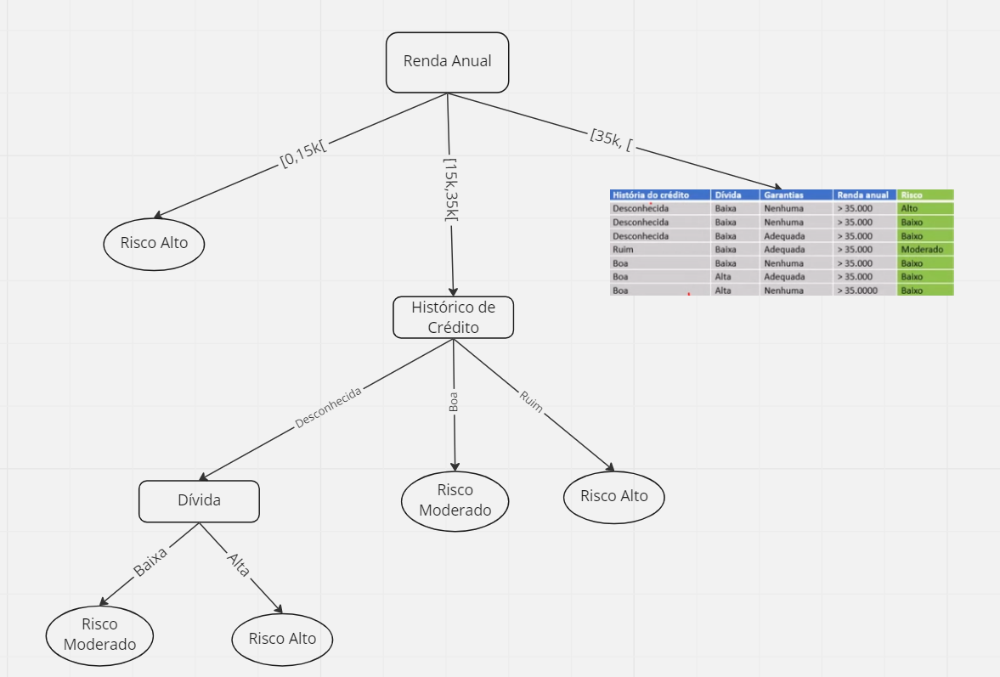





> - Se esta ávore tivesse como critério de poda Homogênidade de 70%, o ramo [35k,[ do nó Renda Anual seria podada, pois apresenta uma homogenidade de 71% para a classificação Risco = Baixo. Ou seja, o ramo iria direto para a classificação e a classificação assumida seria aquela que estivesse em maior quantidade dentro do subgrupo, ou seja, neste caso seria a classificação Risco Baixo. Nossa árvore ficaria assim:

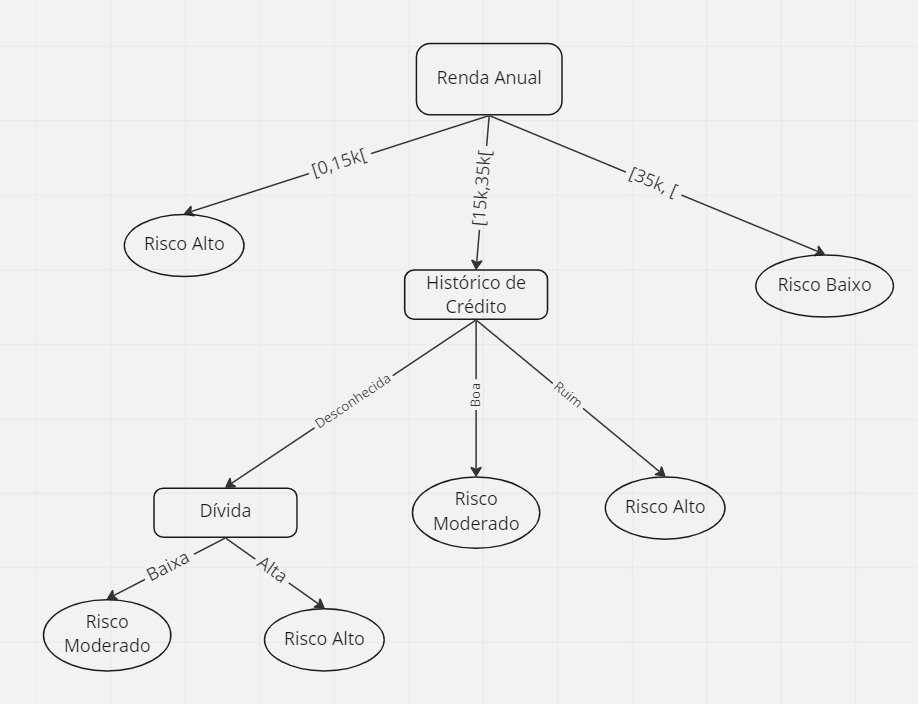


- ***Contras:***
  - Se a árvore de decisão não tem um critério de poda, ela naturalmente cresce muito! Visualmente cresce tanto que nem dá para visualizar toda a árvore de decisão criada.
  - Se não delimitamos um critério de parada/poda, a nossa árvore sofrerá o que chamamos de Overfit!
    - Ou seja, nossa árvore ficará viciada nos dados de treino (dados passados para montar a árvore) e quando recebe dados novos diferentes daqueles que ele treinou ele tem mal desempenho!
  - São modelos instáveis (alta variância), pequena variações nos dados de treino podem resultar em árvores completamente distintas.
  - O algritmo de árove de decisão é um algoritmo NP - Completo em complexidade, ou seja, ele é um algoritmo guloso, ou seja de novo, ele é um algoritmo que leva um tempo polinomial para ser solucionado.
  - Eram muito populares nos anos 90, mas hoje em dia na prática quase ninguém usa eles, pois existem outros modelos que tem performace melhor para o memso problema.
    - Redes Neurais, KNN, SVM são algoritmos que geralmente tem desempenho melhor que uma árvore de decisão.
    - Como veremos em outro notebook, existe um modelo de machine learning que é o primoramento/evolução da árvore de decisão clássica, que é a Random Forest.

Daqui surge uma das maiores dúvidas que existem quando trabalhamos com árvore de decisão... Qual é a altura ideal, ou seja, qual é o critério de poda ideal que uma árvore tem que ter para que ele não tenha um Overfit mas mantenha uma acurácia alta ou aceitavel?



###Tratando Overfitting - Gráfico do Cotovelo

Para descobrirmos qual é o critério ótimo de poda das árvores vamos utilizar o método mais intuitivo... Ou seja, vamos calcular a acurácia da ávore modelada para diferentes valores de critérios de poda e vamos plotar esses históricos (critério, acurácia) em um gráfico.


E definimos o valor ótimo de poda exatamente no ponto onde está o "cotovelo" da curvam.

##Árvore de decisão com Entropia - Prática

Relembrando a base de dados que estamos trabalhando:

In [ ]:
dados

,Maior65Anos,Conjuge,Dependentes,MesesDeContrato,TelefoneFixo,PagamentoOnline,ContaMensal,VariasLinhasTelefonicas_Nao,VariasLinhasTelefonicas_SemServicoTelefonico,VariasLinhasTelefonicas_Sim,ServicoDeInternet_DSL,ServicoDeInternet_FibraOptica,ServicoDeInternet_Nao,SegurancaOnline_Nao,SegurancaOnline_SemServicoDeInternet,SegurancaOnline_Sim,BackupOnline_Nao,BackupOnline_SemServicoDeInternet,BackupOnline_Sim,SeguroNoDispositivo_Nao,SeguroNoDispositivo_SemServicoDeInternet,SeguroNoDispositivo_Sim,SuporteTecnico_Nao,SuporteTecnico_SemServicoDeInternet,SuporteTecnico_Sim,TVaCabo_Nao,TVaCabo_SemServicoDeInternet,TVaCabo_Sim,StreamingDeFilmes_Nao,StreamingDeFilmes_SemServicoDeInternet,StreamingDeFilmes_Sim,TipoDeContrato_DoisAnos,TipoDeContrato_Mensalmente,TipoDeContrato_UmAno,FormaDePagamento_CartaoDeCredito,FormaDePagamento_ChequeDigital,FormaDePagamento_ChequePapel,FormaDePagamento_DebitoEmConta,Churn
0,0,1,0,1,0,1,29.850000,0,1,0,1,0,0,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0
1,0,0,0,34,1,0,56.950000,1,0,0,1,0,0,0,0,1,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0
2,0,0,0,2,1,1,53.850000,1,0,0,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,1
3,0,0,0,45,0,0,42.300000,0,1,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,0,0,1,0,0,0,1,0
4,0,0,0,2,1,1,70.700000,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10343,0,1,0,5,1,1,80.921075,0,0,1,0,1,0,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,1
10344,0,0,0,3,1,1,74.347278,0,0,1,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,1
10345,0,0,0,18,1,1,70.164647,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,1
10346,0,0,0,30,1,0,93.024726,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,1


Está é a base de dados tratada, lembrando que o tratamento que fizemos foi a transformação das variáveis categóricas em categóricas númericas (0 ou 1), pois todo modelo de Machine Learning apenas manipula números e não string.

Nessa base de dados devemos nos recordar que também fizemos o tratamento do desbalanceamento dos dados. Aplicamos sobre ela uma técnica de Oversampling, a técnica SMOTE. Ou seja, esta base de dados está balanceado. Lembrando que mesmo que a técnica de árvore de decisão não tenha nenhuma pré requisito, necessitamos fazer esses tratamentos. O primeiro tratamento de transformação das variáveis categóricas em categóricas númericas é necessário por conta da natureza do computador em si, que não consegue manipular de forma adequada string. O segunda tratamento, que foi a balanceamento, é necessário para que o modelo de árvore de decisão não fique enviesado.

Importando a classe DicisionTreeClassifier da biblioteca Sklearn:

In [ ]:
from sklearn.tree import DecisionTreeClassifier

Dividindo os dados em treino e teste. Vamos usar o mesmo estado randomico, para que os dados de teste e treino sejam iguais para os 3 modelos de Machine Learning que estamos estudando nesse notebook e possamos comparar de forma justa o desempenho de cada um:

In [ ]:
from sklearn.model_selection import train_test_split

x = dados.iloc[:, :38]
y = dados.iloc[:, 38:39]

SEED = 123
np.random.seed(SEED)

x_treino, x_teste, y_treino, y_teste = train_test_split(x, y, test_size = 0.3)
x_treino

,Maior65Anos,Conjuge,Dependentes,MesesDeContrato,TelefoneFixo,PagamentoOnline,ContaMensal,VariasLinhasTelefonicas_Nao,VariasLinhasTelefonicas_SemServicoTelefonico,VariasLinhasTelefonicas_Sim,ServicoDeInternet_DSL,ServicoDeInternet_FibraOptica,ServicoDeInternet_Nao,SegurancaOnline_Nao,SegurancaOnline_SemServicoDeInternet,SegurancaOnline_Sim,BackupOnline_Nao,BackupOnline_SemServicoDeInternet,BackupOnline_Sim,SeguroNoDispositivo_Nao,SeguroNoDispositivo_SemServicoDeInternet,SeguroNoDispositivo_Sim,SuporteTecnico_Nao,SuporteTecnico_SemServicoDeInternet,SuporteTecnico_Sim,TVaCabo_Nao,TVaCabo_SemServicoDeInternet,TVaCabo_Sim,StreamingDeFilmes_Nao,StreamingDeFilmes_SemServicoDeInternet,StreamingDeFilmes_Sim,TipoDeContrato_DoisAnos,TipoDeContrato_Mensalmente,TipoDeContrato_UmAno,FormaDePagamento_CartaoDeCredito,FormaDePagamento_ChequeDigital,FormaDePagamento_ChequePapel,FormaDePagamento_DebitoEmConta
4831,0,0,0,18,0,1,40.200000,0,1,0,1,0,0,0,0,1,0,0,1,1,0,0,0,0,1,1,0,0,1,0,0,0,0,1,0,0,1,0
5077,0,1,1,7,1,0,19.850000,1,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,1,0,0,0,0,1,0
9023,0,0,0,1,1,0,70.391538,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0
4424,0,0,1,1,0,0,24.750000,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0
5236,0,0,0,41,1,1,89.550000,1,0,0,0,1,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,1,1,0,0,0,0,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9785,0,1,0,13,1,1,89.090342,1,0,0,0,1,0,1,0,0,0,0,1,1,0,0,0,0,1,1,0,0,0,0,1,0,1,0,0,0,0,0
7763,0,0,0,1,0,1,50.455795,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,1,0,0,1,0,0
5218,0,1,1,0,1,1,19.700000,1,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0
1346,0,1,1,14,1,1,87.250000,0,0,1,0,1,0,1,0,0,1,0,0,0,0,1,1,0,0,1,0,0,0,0,1,0,1,0,0,1,0,0


Instânciando um objeto da classe DecisionTreeClassifier, ou seja, instânciando um árvore de decisão virgem. Na mesma célula vamos treinar ele:

In [ ]:
arvore = DecisionTreeClassifier(criterion = "entropy", random_state = 42)
arvore.fit(x_treino, y_treino)

DecisionTreeClassifier(criterion='entropy', random_state=42)

Podemos ver o Ganho de informação de cada uma das variáveis explicativas em relação a variável target, que neste caso é a variável Churn. Não se preocupe se os valores que a função "feature_importances_" seja diferente dos Ganhos de informação calculados por você a mão, pois esses dados da função sofrem normalização. Mas a variável com o maior Ganho de Informação se mantem sendo a variável que tem o maior valor nessa função:

In [ ]:
arvore.feature_importances_

array([0.01795426, 0.02056705, 0.01516897, 0.16478058, 0.006427  ,
       0.01740678, 0.22311461, 0.008942  , 0.00344576, 0.01039979,
       0.0019815 , 0.03131262, 0.00368329, 0.00968039, 0.        ,
       0.01730146, 0.00668922, 0.        , 0.01027342, 0.00952577,
       0.        , 0.00905283, 0.01461744, 0.00092891, 0.02010972,
       0.0026784 , 0.        , 0.0014254 , 0.00734915, 0.        ,
       0.01297283, 0.03611651, 0.16384005, 0.07422263, 0.01689757,
       0.02207543, 0.02020332, 0.01885533])

In [ ]:
arvore.feature_importances_.max()

0.22311460584153534

Esse Ganho de Informação é da variável "Conta Mensal". Ou seja, podemos dizer que a variável que tem maior influência na decisão de sair ou não da operadora (Churn) é essa variável, é o valor que ela paga mensalmente.

Podemos visualizar a árvore de decisão, o que é muito importante (e é o principal difenrencial dessa técnica de classificação) para entendermos os passos de classificação:

In [ ]:
from sklearn.tree import export_graphviz
import graphviz

dot_data = export_graphviz(arvore, out_file=None)
grafico_arvore = graphviz.Source(dot_data)
grafico_arvore

In [ ]:
arvore.get_depth()

33

Benévolo, veja que, como não passamos nenhum parâmetro de poda, a árvore vai crescer até seu limite, ou seja, até formar subgrupos 100% homogêneos, ou seja de novo, até criar sub grupos com Entropia = 0.

De fato, se você ver no gráfico acima, todos os nós folhas das árvores tem Entropia = 0. Mas como já haviamos comentado anteriormente, deixar a árvore crescer sem critério de poda é perigoso pelos seguintes motivos:

- Quase sempre ela está caindo no Overfting!
- A maior árvore não necessáriamente terá a maior acurácia! Ou seja, existem uma pronfundidade otima onde nossa acurácia é a maior possível minimizando as probabilidades de Overfiting.
  - Veremos como encontrar esse ponto ótimo de poda com o gráfico do cotovelo.

Vamos testar a acurácia dessa árvore de decisão feita, se ela tem Overfiting:

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix
previsoes_arvore = arvore.predict(x_teste)

accuracy_score(y_teste,previsoes_arvore)

0.8054750402576489

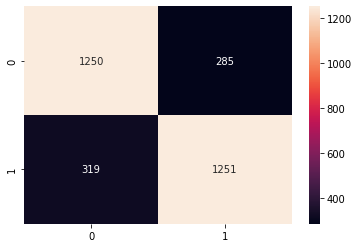

In [ ]:
sns.heatmap(confusion_matrix(previsoes_arvore, y_teste), annot = True, fmt="d")

Ela apresentou uma acurácia muito boa, podemos afirmar que neste caso, deixar a árvore crescer sem critério de poda não deixar o modelo em Overfitting! Mas ainda precisamos encontrar o melhor critério de poda. Neste caso vamos usar a profundidade da árvore como critério de poda para contruir o gráfico do cotovelo.

Como foi comentado, para criarmos o gráfico do cotovelo precisamos rodar o algoritmo de árvore de decisão várias vezes e ir guardando os hitóricos de profundidade da árvore e seu erro (que nada mais é que a diferença e "1 - acurácia"):

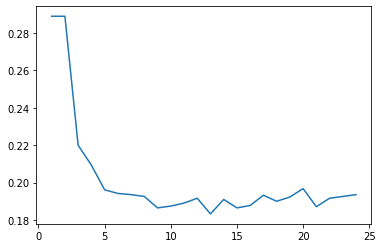

In [ ]:
acuracias = []
for i in range(1,25):
  arvore = DecisionTreeClassifier(criterion = "entropy", random_state = 42, max_depth= i)
  arvore.fit(x_treino, y_treino)
  previsoes_arvore = arvore.predict(x_teste)
  acuracias.append(1 - accuracy_score(y_teste,previsoes_arvore))

import matplotlib.pyplot as plt

plt.plot(range(1,25), acuracias)

Ou seja, conseguimos perceber pelo gráfico do cotovelo que o ponto ótimo é quando a árvore tem altura máxima de -+ 5. logo vamos rodar outra vez o algoritmo mas agora com esse critério de poda. Podemos passar esse critério como parâmetro da função:


In [ ]:
arvore = DecisionTreeClassifier(criterion = "entropy", random_state = 42, max_depth = 5)
arvore.fit(x_treino, y_treino)

previsoes_arvore = arvore.predict(x_teste)

accuracy_score(y_teste,previsoes_arvore)

0.8038647342995169

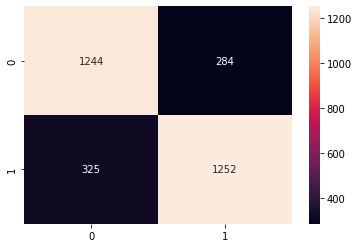

In [ ]:
sns.heatmap(confusion_matrix(previsoes_arvore, y_teste), annot = True, fmt="d")

Você ponsar que o aumento de 1% não vale apena para rodar outro modelo de árvore de decisão com profundidade 9... Mas vale sim, pois o que poupamos de trabalho computacional faz diferença. Bom neste caso nem o trabalho computacional foi muito diferente entre a árvore de profundidade 33 e o de 5, mas em casos da vida real, com bases de dados que passam do milhão, essa diferença de tempo de cláculo é mais notória.

Devemos verificar de novo quais variávies tem o maior Ganho de informação, pois o parâmetro de poda muda o valor final do ganho de informação de cada variável explicativa:

In [ ]:
arvore.feature_importances_

array([0.        , 0.        , 0.        , 0.13244343, 0.01117059,
       0.        , 0.02839986, 0.        , 0.00678058, 0.        ,
       0.        , 0.07537284, 0.        , 0.        , 0.        ,
       0.00961455, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.0160131 , 0.        , 0.02992534,
       0.        , 0.00886608, 0.        , 0.        , 0.        ,
       0.02143484, 0.08693633, 0.39438062, 0.17866184, 0.        ,
       0.        , 0.        , 0.        ])

In [ ]:
arvore.feature_importances_.max()

0.3943806223735961

Nesta árvore de decisão com altura 5, a variável com maior ganho de informação é a variável "TipoDeContrato_Mensalmente", ou seja, é ela que ficara no nó raiz.

Plotando o gráfico da nossa nova árvore de decisão:

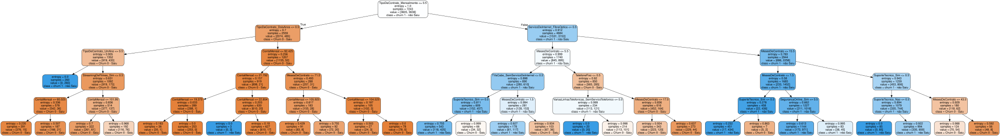

In [ ]:
from sklearn.tree import export_graphviz
import graphviz

#add nome das variáveis em cada nó, add cores e add nome das classes do target em cada sub grupo.
dot_data = export_graphviz(arvore, out_file=None, feature_names = x.columns, filled = True, rounded = True, class_names = ["Churn 0 - Saiu", "churn 1 - não Saiu"])
grafico_arvore = graphviz.Source(dot_data)
grafico_arvore

#Comparação dos modelos

##Métricas Teoria

O que vamos fazer neste tópico é um comparação dos tr6es modelos de machine learning utilizando métricas de desempenho. Usaremos 3 métricas de desempenho:

- ***Acurácia.***
  - Como você já deve saber, a acurácia de um modelo é a razão entre a quantidade de predições corretas (soma dos verdadeiros positivos e verdadeiros falsos) com a quantidade total de predições.
    - Acurácia = Predições certas/Total de Predições. = (VP + VN)/(VP + VN + FV  + FN).
    - Lemrbando que FV e FN são respectivamente, Falso verdadeiro e Falso negativo, ou seja, são as predições erradas.
- ***Precisão.***
  - É a divisão entre a quantidade de previsões positivas corretas pelo total de predições positivas (soma das Falso Positivo e Verdadeiro Positivo).
    - Precisão = VP/ (FP + VP)
      - Esse tipo de métrica é utilizado quando os Falso Positivos são muito mais projudiciais `que os Falso Negativos.
        - Por exemplo, estamos rodando um algoritmo de classificação onde classifica em Positivo se um investimento for considerado bom, e Negativo caso o mesmo investimento for considerado ruim.
        - Veja que um Falso Positivo vai nos dar aseguinte menssagem: "Invista nesse ativo, pois ela é boa"... Benévolo, por ser um Falso positivo, na verdade estamos investindo em uma ação que vai nos trazer prejuizo!
        - Para o mesmo caso, um Falso Positivo nos passa a seguinte menssagem:
        "Não invista nesse ativo, pois ele é ruim"... Como é um Falso Negativo, esse ativo na verdade é uma bom ativo e dará lucro... Veja confiar na classificação do algoritmo (Falso Negativo) não nos trouxe prejuizo, apenas fez que não ganhassemos dinheiro.

- ***Recall ou Sensibilidade.***
  - Essa métrica se assemelha muito a métrica Precisão, mas não é a mesma.
  - Recall ou Sensibildiade é a razão entre a prediçoes Verdadeiros Positivos com o total de Positivos.
    - Veja que, o Total Positivos é a soma: VP + FN
      - Note que FN é aquilo que foi classificado como Negativo mas é Positivo! Por isso ele entra na soma do total de Positivos!
    - Logo a formula do Recall/Sensibilidade pode ser cálculada pela fórmula:
      - Recall/Sensibilidade = VP/(VP + FN)
  - Usamos o Recall quando o que mais importa no contexto do problema é a capacidade do modelo em identificar os positivos reais.
    - Por exemplo, se queremos identificar os clintes que estão prestes a sair, ou seja, queremos identificar os clientes que serão churn positivo. Se meu modelo der um falso positivo, o que vai acontecer é que esteremos dando descontos e beneficios para um cliente que nem sairia, ou seja, nao perdemos muita coisa. Se o modelo der um verdadeiro positivo estaremos dando aos clientes que estão prester a desistir beneficios e descontos para que ele fique. Veja que, o falso positivo não é tão prejudicial, o que realmente me importa é o verdadeiro positivo, ou seja, o que realmente importa aqui é identificar aqueles que realmente vão sair.
      - Todo problema em que o falso positivo não é tão prejudicial, isso acarreta que o falso negativo é muito danoso! temos que ficar a tento a relações de causa:
        - Falso Negativo muito prejudicial -->  Verdadeiro positivo importante.
        - Falso positivo prejudicial --> Falso positivo importante.


- **F1 score**
  - Além da acurácia, precisão e recall, podemos extrair da matriz de confusão uma outra métrica conhecida como f1 score, que é uma média harmônica entre o recall e a precisão.O recall e a precisão são grandezas inversamente proporcionais, ou seja, à medida que vai aumentando o recall, por consequência irá diminuir a precisão e vice-versa.

  - O f1 score é uma métrica para identificar se algum dos valores de recall ou precisão estão baixos, uma vez que não é muito interessante ter um modelo com um alto recall e pouca precisão, ou vice versa. Então, caso sua intenção seja obter um valor equilibrado entre o recall e a precisão, a métrica que precisamos maximizar é o f1 score.
  - Para calcular o F1 score de um modelo de ML utilizamos a seguinte fórmula:
    - 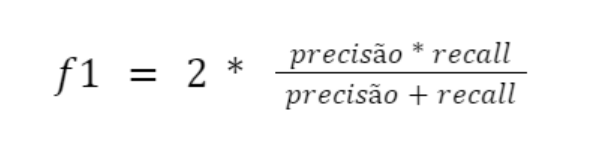



> - Exemplo, vamos calcular o F1 score das seguintes previsões:



In [ ]:
previsto = [0,0,0,0,1,1,1,1,0,1,0,1]
real = [1,1,0,0,1,1,1,0,1,0,1,0]
recall = 3/7
precisao = 3/6

F1 = 2*recall*precisao/(recall + precisao)
F1

0.4615384615384615

Para o nosso exemplo de intentificação de churn positivo, ou seja, de indentificação de cliente que vão sair da empresa, o que relamente importa para a gente é o modelo de machine learning consiga:

- Identificação de clientes que realmente sairão.
  - Ou seja, queremos os modelos com o maior poder de identificar o verdadeiros positivos.
    - E conseguentemente, diminuir os falsos negativo (clientes que o modelo julgo como que não iam sair, mas na verdade vão sair).
      - Ou seja, a métrica mais importante na avaliação dos é o Recall/Sesibilidade dos mesmos.

- Os falso positivos para o nosso problema não é tão prejudicial.
  - Veja que, a empresa der beneficios para clientes que não iriam largar a empresa não é tão ruim assim.
    - Ou seja, uma métrica Precisão não é tão importante, mas podemos usar ela como uma métrica de desempate.

Por fim, não devemos deixar de fora a acurácia dos modelos na hora da avaliação, mas lembrando que para este problema a melhor métrica de avalição é o Recall/Sensibilidade do modelo.




##Calculando Métricas

calculando a acurácia dos modelos

In [ ]:
from sklearn.metrics import accuracy_score

df_metricas = pd.DataFrame({"Modelo":['Naive Bayes Gaussiano', 'Naive Bayes Bernoulli', 'Naive Bayes Multinomial', 'KNN', 'Decision Tree']})
df_metricas

acuracias = []
acuracias.append(accuracy_score(y_teste, predicao_NBGaussiano))
acuracias.append(accuracy_score(y_teste, predicoes_NBBernoulli))
acuracias.append(accuracy_score(y_teste, previcoes_MNB))
acuracias.append(accuracy_score(y_teste, previsoes_knn))
acuracias.append(accuracy_score(y_teste, previsoes_arvore))

df_metricas['Acuracia'] = acuracias
df_metricas

,Modelo,Acuracia
0,Naive Bayes Gaussiano,0.716264
1,Naive Bayes Bernoulli,0.955556
2,Naive Bayes Multinomial,0.704670
3,KNN,0.828341
4,Decision Tree,0.803865


In [ ]:
from sklearn.metrics import precision_score
precisoes = []
precisoes.append(precision_score(y_teste, predicao_NBGaussiano))
precisoes.append(precision_score(y_teste, predicoes_NBBernoulli))
precisoes.append(precision_score(y_teste, previcoes_MNB))
precisoes.append(precision_score(y_teste, previsoes_knn))
precisoes.append(precision_score(y_teste, previsoes_arvore))

df_metricas['Precisão'] = precisoes
df_metricas

,Modelo,Acuracia,Precisão
0,Naive Bayes Gaussiano,0.716264,0.703796
1,Naive Bayes Bernoulli,0.955556,0.968499
2,Naive Bayes Multinomial,0.704670,0.709546
3,KNN,0.828341,0.804493
4,Decision Tree,0.803865,0.793912


In [ ]:
from sklearn.metrics import recall_score
recalls = []
recalls.append(recall_score(y_teste, predicao_NBGaussiano))
recalls.append(recall_score(y_teste, predicoes_NBBernoulli))
recalls.append(recall_score(y_teste, previcoes_MNB))
recalls.append(recall_score(y_teste, previsoes_knn))
recalls.append(recall_score(y_teste, previsoes_arvore))

df_metricas['Recall'] = recalls
df_metricas

,Modelo,Acuracia,Precisão,Recall
0,Naive Bayes Gaussiano,0.716264,0.703796,0.736328
1,Naive Bayes Bernoulli,0.955556,0.968499,0.940755
2,Naive Bayes Multinomial,0.704670,0.709546,0.682292
3,KNN,0.828341,0.804493,0.862630
4,Decision Tree,0.803865,0.793912,0.815104


Como no nosso problema a métrica mais importante é o recall, ou seja, no nosso problema a classificação mais danosa é o Falso negativo, que no nosso contexto é o cliente que vai sair mais o modelo classifica como cliente que não vai sair! O Recall é a relação entre o verdadeiros postivos e os falsos negativos (veja a formula), onde, quanto maior for o valor do recall, significa que melhor será a precisão do modelo de classificar corretamente os verdadeiros positivos e minimizar os falsos negativos!

Em outras palavras, para nosso problema a melhor métrica é o recall. Ou seja, o melhor modelo de machine learning é Naive Bayes com um recall de 94%

In [ ]:
import numpy as np
np.log(10)

NameError: ignored